## 命名规则
rmse:
feature_method+model

pic:
feature_method+model

In [1]:
#Basic Computation
import numpy as np
from numpy import arange
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# from pylab import *
#Feature Selection Metrics
from statsmodels.tsa import stattools
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mutual_info_score
from minepy import MINE
from minepy import cstats

#Preprocessing and performance evaluation
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
from math import log,pi,hypot,fabs,sqrt

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# grid search hyperparameters for ridge regression
from sklearn.model_selection import GridSearchCV
from tensorflow import keras
# Model
from sklearn.linear_model import Ridge, Lasso,LinearRegression
from sklearn.linear_model import LogisticRegression,SGDRegressor,TheilSenRegressor
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest
import xgboost
from xgboost.sklearn import XGBRegressor
from xgboost import plot_importance
import lightgbm as lgb
import warnings
warnings.filterwarnings('ignore')
OUTDATED_IGNORE=1
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline

import copy

In [2]:
power = pd.read_csv(r"./dataset/Tetuan_City_power_consumption.csv",parse_dates=['DateTime'],index_col = 'DateTime')

In [3]:
power

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
DateTime,,,,,,,,
2017-01-01 00:00:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386
2017-01-01 00:10:00,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434
2017-01-01 00:20:00,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373
2017-01-01 00:30:00,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711
2017-01-01 00:40:00,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964
...,...,...,...,...,...,...,...,...
2017-12-30 23:10:00,7.010,72.4,0.080,0.040,0.096,31160.45627,26857.31820,14780.31212
2017-12-30 23:20:00,6.947,72.6,0.082,0.051,0.093,30430.41825,26124.57809,14428.81152
2017-12-30 23:30:00,6.900,72.8,0.086,0.084,0.074,29590.87452,25277.69254,13806.48259


In [3]:
power['avg_con'] = power.iloc[:,-3:].mean(axis=1)

In [4]:
df = power.resample('D').mean()

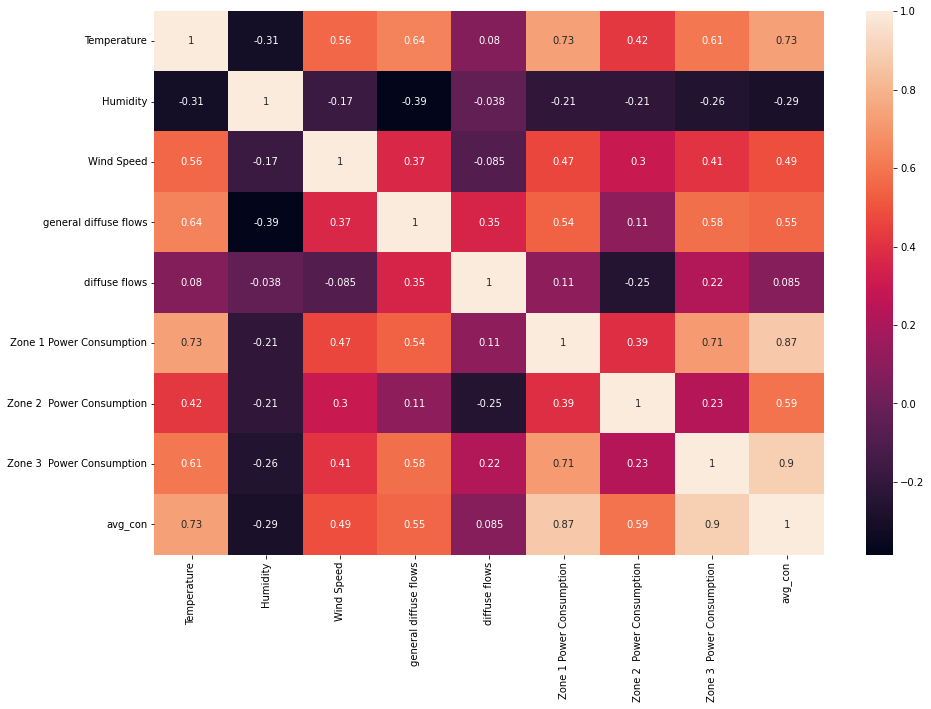

In [7]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), annot=True)
plt.savefig('./pic/Correlation Pic/PowerCity/Corr_Map.png')

In [11]:
df.corr().describe().loc['75%'].abs().mean()

0.5488079839838501

In [5]:
df = power.resample('D').mean()
df['avg_con_1'] = df['avg_con'].shift(-1)
df.dropna(inplace=True)

In [6]:
df.drop('avg_con',axis=1,inplace=True)

In [7]:
df

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption,avg_con_1
DateTime,,,,,,,,,
2017-01-01,9.675299,68.519306,0.315146,121.390771,25.993924,28465.232067,17737.791287,17868.795181,22082.660718
2017-01-02,12.476875,71.456319,0.076562,120.404486,27.227410,28869.493671,19557.725431,17820.763053,22746.839991
2017-01-03,12.100000,74.981667,0.076715,120.686014,28.574660,30562.447257,20057.269504,17620.803213,22821.867668
2017-01-04,10.509479,75.459792,0.082417,122.959319,28.827222,30689.831224,20102.077001,17673.694779,22833.676446
2017-01-05,10.866444,71.040486,0.083896,118.749861,29.741438,30802.911393,20033.941237,17664.176707,22777.695865
...,...,...,...,...,...,...,...,...,...
2017-12-25,10.621549,76.292014,0.083271,115.661035,24.049069,29980.946346,24562.161195,11182.593037,22055.387162
2017-12-26,11.621840,69.070903,0.083063,106.836687,50.760389,30013.476975,24757.006239,11395.678272,22174.241185
2017-12-27,15.232917,59.445903,0.082028,95.890674,41.705062,29966.962399,25057.481845,11498.279312,22006.427519


In [8]:
def segment(data,col_name):
    Y = (data[col_name])
    X = data.drop(col_name,axis=1)
    return X,Y

In [9]:
def Train_Valid_Test(data,train_percent,valid_percent,test_percent):
    train_len = int(data.shape[0]*train_percent)
    valid_len = int(data.shape[0]*(train_percent + valid_percent)) 
    train_df = data.iloc[:train_len,:]
    valid_df = data.iloc[train_len:valid_len,:]
    test_df = data.iloc[valid_len:,:]
    return train_df,valid_df,test_df

def Split_Part(data,percent):
    train_len = int(data.shape[0]*percent)
    train_df = data.iloc[:train_len,:]
    test_df = data.iloc[train_len:,:]
    return train_df,test_df

In [10]:
def lag_data(data,max_lag,target):
    X = data.copy()
    X_col = list(X.columns)
    X_col.remove(target)
    for col in X_col:
        for i in range(2,max_lag+1):
            X[col+'_lag_'+str(i)] = X[col].shift(i-1)
    for i in X_col:
        X.rename(columns ={i:i+'_lag_1'},inplace = True)
    X.dropna(inplace = True) 
    return X

### Lag the feature based on the order of feature in data.columns
def lag_feature_df(max_lag,data,target):
    # Store each feature's dataframe:
    X = pd.DataFrame()
    X_col = list(data.columns)
    X_col.remove(target)
    feature_range = range(len(X_col))
    for idx,col in enumerate(X_col):
        for j in range(max_lag):
            X[col+'_lag_'+str(j+1)] = data[col].shift(j)
    X[target] = data[target].copy()
    X.dropna(inplace=True)
    return X

In [11]:
df_lag = lag_feature_df(30,df,'avg_con_1')

train_lag,valid_lag,test_lag = Train_Valid_Test(df_lag,0.7,0.1,0.2)
## Lagging
X_train_lag,Y_train_lag = segment(train_lag,'avg_con_1')
X_valid_lag,Y_valid_lag = segment(valid_lag,'avg_con_1')
X_test_lag,Y_test_lag = segment(test_lag,'avg_con_1')

train_no,valid_no,test_no = Train_Valid_Test(df.loc[df_lag.index],0.7,0.1,0.2)

## No lagging
X_train_no,Y_train_no = segment(train_no,'avg_con_1')
X_valid_no,Y_valid_no = segment(test_no,'avg_con_1')
X_test_no,Y_test_no = segment(test_no,'avg_con_1')

In [12]:
X_arr = X_train_lag.values

In [13]:
X_train_lag

,Temperature_lag_1,Temperature_lag_2,Temperature_lag_3,Temperature_lag_4,Temperature_lag_5,Temperature_lag_6,Temperature_lag_7,Temperature_lag_8,Temperature_lag_9,Temperature_lag_10,...,Zone 3 Power Consumption_lag_21,Zone 3 Power Consumption_lag_22,Zone 3 Power Consumption_lag_23,Zone 3 Power Consumption_lag_24,Zone 3 Power Consumption_lag_25,Zone 3 Power Consumption_lag_26,Zone 3 Power Consumption_lag_27,Zone 3 Power Consumption_lag_28,Zone 3 Power Consumption_lag_29,Zone 3 Power Consumption_lag_30
DateTime,,,,,,,,,,,,,,,,,,,,,
2017-01-30,16.618681,14.560069,13.521389,11.854840,11.220361,9.884285,10.841403,11.418056,12.839097,11.184236,...,17425.341366,17417.791165,17810.602410,17985.943775,17481.084337,17664.176707,17673.694779,17620.803213,17820.763053,17868.795181
2017-01-31,15.267569,16.618681,14.560069,13.521389,11.854840,11.220361,9.884285,10.841403,11.418056,12.839097,...,17307.590361,17425.341366,17417.791165,17810.602410,17985.943775,17481.084337,17664.176707,17673.694779,17620.803213,17820.763053
2017-02-01,11.241597,15.267569,16.618681,14.560069,13.521389,11.854840,11.220361,9.884285,10.841403,11.418056,...,17507.389558,17307.590361,17425.341366,17417.791165,17810.602410,17985.943775,17481.084337,17664.176707,17673.694779,17620.803213
2017-02-02,11.112590,11.241597,15.267569,16.618681,14.560069,13.521389,11.854840,11.220361,9.884285,10.841403,...,17051.686747,17507.389558,17307.590361,17425.341366,17417.791165,17810.602410,17985.943775,17481.084337,17664.176707,17673.694779
2017-02-03,13.890069,11.112590,11.241597,15.267569,16.618681,14.560069,13.521389,11.854840,11.220361,9.884285,...,17716.144578,17051.686747,17507.389558,17307.590361,17425.341366,17417.791165,17810.602410,17985.943775,17481.084337,17664.176707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-15,23.809236,22.988819,23.165417,22.863819,23.834167,23.313194,23.453264,22.987569,23.555208,23.613889,...,22244.305121,22677.199582,23141.985371,24051.577847,24079.916405,24599.247649,26054.002090,26611.368861,26394.817137,26247.857889
2017-09-16,20.713681,23.809236,22.988819,23.165417,22.863819,23.834167,23.313194,23.453264,22.987569,23.555208,...,21369.153605,22244.305121,22677.199582,23141.985371,24051.577847,24079.916405,24599.247649,26054.002090,26611.368861,26394.817137
2017-09-17,19.846806,20.713681,23.809236,22.988819,23.165417,22.863819,23.834167,23.313194,23.453264,22.987569,...,19365.600836,21369.153605,22244.305121,22677.199582,23141.985371,24051.577847,24079.916405,24599.247649,26054.002090,26611.368861


In [14]:
X_train_no

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Zone 1 Power Consumption,Zone 2 Power Consumption,Zone 3 Power Consumption
DateTime,,,,,,,,
2017-01-30,16.618681,68.655556,4.915354,70.375597,62.823868,31524.008439,18932.953394,17577.991968
2017-01-31,15.267569,70.533819,4.916674,50.241694,50.894722,31593.966245,19179.103344,17762.008032
2017-02-01,11.241597,56.077708,4.919806,163.062771,177.604514,31374.194915,19077.127659,17562.572864
2017-02-02,11.112590,60.562986,4.916750,113.116167,118.672174,31880.932203,19304.229990,17783.236181
2017-02-03,13.890069,64.120625,2.703979,78.499792,80.976604,30736.016949,18653.951368,17049.366834
...,...,...,...,...,...,...,...,...
2017-09-15,23.809236,50.165000,0.308028,242.857153,39.086771,34246.017699,21207.042620,14909.703779
2017-09-16,20.713681,64.332847,2.399458,81.191424,67.314069,33550.663717,19485.135134,15131.399388
2017-09-17,19.846806,64.714653,4.919500,231.883535,34.300431,31889.336283,17542.099792,14585.863126


## Prediction Models

In [15]:
def LR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear_a = reg_Linear.predict(x_test)
    y_Linear_a_inverse =minmax_y_test.inverse_transform(y_Linear_a.reshape((-1,1)))
    
    print(
        "Linear:rmse: ",sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
         "Linear:mae:",mean_absolute_error(y_Linear_a_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_Linear_a_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_Linear_a_inverse,y_test_inverse)
    }
    return error_metrics

In [16]:
def ANN_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    ann_model = keras.Sequential([
        keras.layers.Dense(500,activation='relu',input_shape=[x_train.shape[1]]),
        keras.layers.Dense(500,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(1)])#最后输出为一个结果，也就是预测的值
        #定义损失函数loss，采用的优化器optimizer为Adam
    ann_model.compile(loss='mean_absolute_error',optimizer='Adam')
    
    ann_model.fit(x_train,y_train.reshape(-1,))
    y_ann_model = ann_model.predict(x_test)
    y_ann_model_inverse =minmax_y_test.inverse_transform(y_ann_model.reshape((-1,1)))
    
    print(
          "ANN_mae:%f"%(mean_absolute_error(y_ann_model_inverse, Y_test  ))+"\n",
          "ANN_rmse:%f"%(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  )))+"\n"
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_ann_model_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_ann_model_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_ann_model_inverse, Y_test)
    }
    return error_metrics

In [17]:
def RF_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    rfr = RandomForestRegressor(max_depth=9)
#     param_grid = {"n_estimators":[10,100,300],"max_depth":range(1,31)}
#     grid_search = GridSearchCV(rfr,param_grid,cv = 3)

    rfr.fit(x_train,y_train.reshape(-1,))
    y_rfr = rfr.predict(x_test)
    y_rfr_inverse =minmax_y_test.inverse_transform(y_rfr.reshape((-1,1)))
    
    print(
          "RandomForest_mae:%f"%(mean_absolute_error(y_rfr_inverse, Y_test  ))+"\n",
          "RandomForest_rmse:%f"%(sqrt(mean_squared_error(y_rfr_inverse, Y_test  )))+"\n"
#           "elastic_mse:%f"%(mean_squared_error( y_elastic_inverse, Y_test  )),     
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_rfr_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_rfr_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_rfr_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_rfr_inverse, Y_test)
    }
    return error_metrics

In [18]:
def XGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))

    xgb = XGBRegressor(max_depth=3,
    learning_rate=0.1,
    n_estimators=100,
    objective='reg:squarederror', # 此默认参数与 XGBClassifier 不同
    booster='gbtree',
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1,
    reg_alpha=0,
    reg_lambda=1,
    random_state=0)
    
    
    xgb.fit(x_train,y_train.reshape(-1,),eval_metric='rmse', verbose=50)
    y_xgb = xgb.predict(x_test)
    y_xgb_inverse =minmax_y_test.inverse_transform(y_xgb.reshape((-1,1)))
    
    print(
        "XGB rmse: ",sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
         "XGB mae:",mean_absolute_error(y_xgb_inverse,Y_test)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
        "mae":mean_absolute_error(y_xgb_inverse,Y_test),
        'mape':mean_absolute_percentage_error(y_xgb_inverse,Y_test)
    }
    
    return error_metrics

In [19]:
def LGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    
    gbm = lgb.LGBMRegressor(max_depth=12)
    gbm.fit(x_train, y_train)
    y_gbm = gbm.predict(x_test)
    y_gbm_inverse =minmax_y_test.inverse_transform(y_gbm.reshape((-1,1)))
    
    print(
        "LGB rmse: ",sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
         "LGB mae:",mean_absolute_error(y_gbm_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_gbm_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_gbm_inverse,y_test_inverse)
    }
    
    
    return error_metrics

In [20]:
def SVR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
#     parameters = {, 'gamma':np.logspace(-5, 0, num=6, base=2.0),'C':np.logspace(-5, 5, num=11, base=2.0)}
#     grid_search = GridSearchCV(, cv=10, n_jobs=4, scoring='neg_mean_squared_error')
    svr = SVR(kernel='rbf', C=1e3, gamma=0.01)
    svr.fit(x_train,y_train.reshape(-1,))
#     print(grid_search.best_params_)
    y_svr = svr.predict(x_test)
    
    y_svr_inverse = minmax_y_test.inverse_transform(y_svr.reshape((-1,1)))
    
    print(
        "SVR rmse: ",sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
         "SVR mae:",mean_absolute_error(y_svr_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_svr_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_svr_inverse,y_test_inverse)
    }
    
    return error_metrics

## BenchMark

In [21]:
def stacking_models(X_train,Y_train,X_test,Y_test):
    model_df =pd.DataFrame({
                 LR_Model.__name__:LR_Model(X_train,Y_train,X_test,Y_test),
                 RF_Model.__name__:RF_Model(X_train,Y_train,X_test,Y_test),
                 ANN_Model.__name__:ANN_Model(X_train,Y_train,X_test,Y_test),
                 XGB_Model.__name__:XGB_Model(X_train,Y_train,X_test,Y_test),
                 LGB_Model.__name__:LGB_Model(X_train,Y_train,X_test,Y_test),
                 SVR_Model.__name__:SVR_Model(X_train,Y_train,X_test,Y_test),
                }
                )
    return model_df

In [22]:
mi_xy = mutual_info_regression(X_train_lag,Y_train_lag)
mi_xx = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])

for i in range(mi_xx.shape[1]):
    for j in range(mi_xx.shape[1]):
        mi_xx[i][j] = mutual_info_regression(X_arr[:,i].reshape(-1,1),X_arr[:,j])
    print(i+1,'/',mi_xx.shape[1],end='\r',flush=True)

In [23]:
def mRMR(selected,idx,metric_xy,metric_xx):
    
    mrmr = 0.0
    
    if len(selected) == 0:
        mrmr = metric_xy[idx]
        
    else:
        relevance_score = 0
        redundency_score = 0
        relevance_score = metric_xy[idx] 
        X_s = selected+[idx]
        col_len = len(selected)
        
        for i in selected:
            redundency_score+=metric_xx[idx][i]
        redundency_score/=(col_len)
        
#         for i in X_s:
#             relevance_score+=metric_xy[i]
#         relevance_score/=(col_len)
        

#         for i in range(col_len - 1):
#             for j in range(i+1,col_len):
#                 redundency_score+=metric_xx[X_s[i]][X_s[j]]
#         redundency_score/=(col_len)
        
        mrmr = (relevance_score - redundency_score)

    return mrmr

def incremental_selection(x,metric):
    X = np.array(x)
    selected = [] # indices of selected fetures
    rest = list(range(X.shape[1]))
    scores = []
    metric_xy = []
    metric_xx = []
    # stop = False
    if metric == 'MI-MI':
        metric_xy = mi_xy
        metric_xx = mi_xx
    elif metric == 'MI-MI-Norm':
        metric_xy = mi_xy_norm 
        metric_xx = mi_norm
    elif metric == 'MI-MIC':
        metric_xy = mi_xy_norm
        metric_xx = mic_norm
    elif metric == 'MIC-MI':
        metric_xy = mic_xy_norm
        metric_xx = mi_norm
    elif metric =='MI-CCF':
        metric_xy = mi_xy
        metric_xx = ccf_xx
    elif metric=='MI-CCF-Norm':
        metric_xy = mi_xy_norm
        metric_xx = ccf_norm
    elif metric == 'MI-Pearson':
        metric_xy = mi_xy_norm
        metric_xx = pearson_norm   
    print(metric)
    while len(rest)>0 :
        id_max = rest[0]
        max_score = 0   
        for idx in rest:
            temp_score = mRMR(selected,idx,metric_xy,metric_xx)
            if temp_score>max_score:
                id_max = idx
                max_score = temp_score
        if max_score <=0:        
             return selected
             break                
        selected = selected + [id_max]
        rest.remove(id_max)
        print(f"selected:{selected},delta_score:{max_score}",end = "\r",flush=True)
    
    return selected

In [24]:
mi_mi = incremental_selection(X_train_lag,'MI-MI')
len(mi_mi)

MI-MI


208

In [25]:
MI_MI_result = stacking_models(X_train_lag.iloc[:,mi_mi],Y_train_lag,X_test_lag.iloc[:,mi_mi],Y_test_lag)

Linear:rmse:  2095.5221488328098 Linear:mae: 1668.1921229295563
RandomForest_mae:1168.758020
 RandomForest_rmse:1304.698311

8/8 [==============================] - 2s 15ms/step - loss: 0.2304
ANN_mae:1522.440754
 ANN_rmse:1664.527013

XGB rmse:  1273.673927553626 XGB mae: 1138.530560582435
LGB rmse:  1174.483013860605 LGB mae: 1037.2597531979065
SVR rmse:  1347.5398562127882 SVR mae: 1216.3407767587048


In [26]:
MI_MI_result

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,2095.522149,1304.698311,1664.527013,1273.673928,1174.483014,1347.539856
mae,1668.192123,1168.758020,1522.440754,1138.530561,1037.259753,1216.340777
mape,0.087653,0.057115,0.075935,0.055642,0.050396,0.059641


### Raw Data

In [31]:
raw_df = stacking_models(X_train_no,Y_train_no,X_test_no,Y_test_no)

Linear:rmse:  1041.6467077853765 Linear:mae: 923.5452688650071
RandomForest_mae:1035.658903
 RandomForest_rmse:1163.783548

8/8 [==============================] - 0s 4ms/step - loss: 0.1732
ANN_mae:955.499437
 ANN_rmse:1057.413546

XGB rmse:  1077.5553436255805 XGB mae: 949.6719351603087
LGB rmse:  1008.1343387354549 LGB mae: 883.2699953275331
SVR rmse:  1053.3712880756568 SVR mae: 928.6749672749863


In [32]:
raw_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,1041.646708,1163.783548,1057.413546,1077.555344,1008.134339,1053.371288
mae,923.545269,1035.658903,955.499437,949.671935,883.269995,928.674967
mape,0.044666,0.050254,0.046076,0.045934,0.042530,0.044956


### All Lag

In [33]:
all_df = stacking_models(X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

Linear:rmse:  2577.537206990251 Linear:mae: 1947.9734958215076
RandomForest_mae:1170.118859
 RandomForest_rmse:1304.399817

8/8 [==============================] - 0s 5ms/step - loss: 0.3536
ANN_mae:713.387497
 ANN_rmse:812.579797

XGB rmse:  1269.0406897299868 XGB mae: 1136.8263278398979
LGB rmse:  1183.6378695596047 LGB mae: 1041.223191122508
SVR rmse:  1338.3961773538783 SVR mae: 1211.0271123661298


In [34]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,2577.537207,1304.399817,812.579797,1269.040690,1183.637870,1338.396177
mae,1947.973496,1170.118859,713.387497,1136.826328,1041.223191,1211.027112
mape,0.092675,0.057179,0.033653,0.055550,0.050640,0.059336


## PACF

In [35]:
def lag_based_PACF(data,max_lag,width):
    lags_pacf,interval = stattools.pacf(data,max_lag,"yw",width)
    lags = []
    boundary = (interval[:,1] - lags_pacf)[1]
    lags_pacf = np.abs(lags_pacf)
    for idx,lag in enumerate(lags_pacf):
        if lag > boundary:
            lags.append(idx)
    return lags

In [36]:
lags_pacf = {}
for col in X_train_no.columns:
    lags_pacf[col] = lag_based_PACF(X_train_no[col],29,0.05)
cols = []
for k,v in lags_pacf.items():
    for j in v:
        cols.append(k+'_lag_'+str(j+1))        

In [37]:
len(cols)

56

In [38]:
pacf_df = stacking_models(X_train_lag[cols],Y_train_lag,X_test_lag[cols],Y_test_lag)

Linear:rmse:  848.7345038123364 Linear:mae: 704.6834369644415
RandomForest_mae:1080.875310
 RandomForest_rmse:1224.086013

8/8 [==============================] - 0s 4ms/step - loss: 0.1596
ANN_mae:955.751199
 ANN_rmse:1074.329080

XGB rmse:  1181.1198925314272 XGB mae: 1042.6809384092037
LGB rmse:  1147.1131405830283 LGB mae: 1009.1167368141345
SVR rmse:  975.6910672857102 SVR mae: 862.988575238187


In [39]:
pacf_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,848.734504,1224.086013,1074.329080,1181.119893,1147.113141,975.691067
mae,704.683437,1080.875310,955.751199,1042.680938,1009.116737,862.988575
mape,0.033538,0.052557,0.046094,0.050565,0.048922,0.041443


In [40]:
X_train_no.shape[1]

8

## Feature Selection

### Construct Corr Matrix 

In [41]:
x_mat = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])
feature_num = X_train_no.shape[1]
max_lag = 30

for i in range(0,feature_num):
    ## For each feature,we computew its corr with its self and other features
    ## Self Correlation
    row_start = max_lag*i
    col_end = max_lag*(i+1)
    print(row_start,col_end)
    x_mat[row_start,row_start+1:col_end] = [stats.pearsonr(X_arr[:,row_start],X_arr[:,p])[0] for p in range(max_lag*i+1,max_lag*(i+1))]
    ## Diagnal
    for k in range(row_start+1,col_end-1):
        for j in range(row_start,max_lag*(i+1)-(k-max_lag*i)):
            x_mat[j,j+(k-max_lag*i)] = x_mat[row_start,k]
            
    ## Between Features
    for row in range(col_end,X_arr.shape[1]):
        for col in range(row_start,col_end):
            x_mat[col][row] = stats.pearsonr(X_arr[:,row],X_arr[:,col])[0]

0 30
30 60
60 90
90 120
120 150
150 180
180 210
210 240


In [42]:
corr_copy = np.abs(copy.deepcopy(x_mat))

In [43]:
pd.DataFrame(corr_copy)

,0,1,2,3,4,5,6,7,8,9,...,230,231,232,233,234,235,236,237,238,239
0,0.0,0.965325,0.936681,0.921264,0.908948,0.899368,0.891381,0.887131,0.886492,0.885211,...,0.695711,0.683727,0.677085,0.667916,0.654770,0.642910,0.632221,0.619104,0.603128,0.589832
1,0.0,0.000000,0.965325,0.936681,0.921264,0.908948,0.899368,0.891381,0.887131,0.886492,...,0.709503,0.698936,0.685948,0.678374,0.668630,0.655186,0.643277,0.632601,0.619387,0.603378
2,0.0,0.000000,0.000000,0.965325,0.936681,0.921264,0.908948,0.899368,0.891381,0.887131,...,0.719833,0.712268,0.700696,0.686857,0.678960,0.668957,0.655515,0.643681,0.632958,0.619715
3,0.0,0.000000,0.000000,0.000000,0.965325,0.936681,0.921264,0.908948,0.899368,0.891381,...,0.728519,0.720656,0.712345,0.700374,0.687279,0.679459,0.669654,0.656544,0.645034,0.634305
4,0.0,0.000000,0.000000,0.000000,0.000000,0.965325,0.936681,0.921264,0.908948,0.899368,...,0.736282,0.729630,0.720831,0.711888,0.700358,0.687207,0.679500,0.669937,0.656991,0.645470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.990102,0.980260,0.970244,0.957741
236,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.990102,0.980260,0.970244
237,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.990102,0.980260
238,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.990102


In [44]:
def flat(nums):
    res = []
    for i in nums:
        if isinstance(i, list):
            res.extend(flat(i))
        else:
            res.append(i)
    return res

In [45]:
def generate_feature_subsets(corr_matrix,threshold,X_train,Y_train):
    
    correlation_pairs = np.argwhere(corr_matrix>=threshold)
    
    # Check how many features are highly correlated with 1 feature
    correlated_pairs_dict = {}

    for i in set(correlation_pairs[:,0]):
        correlated_pairs_dict[i] = []
        for j in correlation_pairs:
            if j[0]==i:
                correlated_pairs_dict[i].append(j[1])
                
    high_correlated_features = list(set(correlation_pairs.flatten()))
    print("High_correlated_features",len(high_correlated_features))
    corr_cols = X_train.columns[high_correlated_features]
    
    check_corr_pairs = {}
    kk = list(correlated_pairs_dict.keys())
    kk_copy = kk.copy()
    for j in kk_copy:
        check_corr_pairs[j] = correlated_pairs_dict[j].copy()
        for i in correlated_pairs_dict[j]:
            if i in kk:
                check_corr_pairs[j].append(correlated_pairs_dict[i])
                for q in correlated_pairs_dict[i]:
                    if q in kk_copy:
                        kk_copy.remove(q)
            if i in kk_copy:
                    kk_copy.remove(i)
        check_corr_pairs[j] = list(set(flat(check_corr_pairs[j])))
        
    ### Make redundant features into groups    
    redundant_group = []

    for k,v in check_corr_pairs.items():
        redundant_group.append([k]+v)
    
    # Rank features according to MI
    max_feats = len(corr_cols)
    sel_function = mutual_info_regression
    fs = SelectKBest(score_func=sel_function, k=max_feats)
    fs.fit(X_train[corr_cols],Y_train)
    mutual_info = dict(zip(high_correlated_features,fs.scores_))
    sorted_by_mutual_info =[key for (key,val) in sorted(mutual_info.items(), key=lambda kv: kv[1],reverse=True)]
#     print("sorted_by_mutual_info",sorted_by_mutual_info)
    
    ## Highly-Correlated Features
    mrmr_features = []
    for i in redundant_group:
        indexes = [sorted_by_mutual_info.index(j) for j in i]
        mrmr_features.append(sorted_by_mutual_info[min(indexes)])
    print("MRMR Features",len(mrmr_features))

    ## Uncorelated features
    lst = []
    for i in range(X_train.shape[1]):
        if i not in high_correlated_features:
            lst.append(i)
    ## Joint filtered features with uncorrelated pairs
    final_list = list(set(mrmr_features+lst))
    
    print("Final Features:",len(final_list))
    return final_list,len(mrmr_features),len(high_correlated_features)

In [46]:
feature_collections = {}
mrmr_len = {}
correlated_features_len = {}
for i in np.round(arange(0.9,0.99,0.01),3):
    print(i)
    results = generate_feature_subsets(corr_copy,i,X_train_lag,Y_train_lag)
    feature_collections[i] = list(X_train_lag.columns[results[0]])
    mrmr_len[i] = results[1]
    correlated_features_len[i] = results[2]

0.9
High_correlated_features 60
MRMR Features 6
Final Features: 186
0.91
High_correlated_features 60
MRMR Features 7
Final Features: 187
0.92
High_correlated_features 60
MRMR Features 8
Final Features: 188
0.93
High_correlated_features 60
MRMR Features 9
Final Features: 189
0.94
High_correlated_features 60
MRMR Features 13
Final Features: 193
0.95
High_correlated_features 60
MRMR Features 14
Final Features: 194
0.96
High_correlated_features 60
MRMR Features 15
Final Features: 195
0.97
High_correlated_features 30
MRMR Features 5
Final Features: 215
0.98
High_correlated_features 30
MRMR Features 6
Final Features: 216


In [47]:
for k,v in feature_collections.items():
    print(k,len(v))

0.9 186
0.91 187
0.92 188
0.93 189
0.94 193
0.95 194
0.96 195
0.97 215
0.98 216


In [48]:
feature_nums = {}
for k,v in feature_collections.items():
    feature_nums[k] = len(v)

In [49]:
features_compare = pd.DataFrame({
                "High correlated Features":correlated_features_len,
                "MRMR":mrmr_len,
                'Final Features':feature_nums
})

In [50]:
features_compare

,High correlated Features,MRMR,Final Features
0.90,60,6,186
0.91,60,7,187
0.92,60,8,188
0.93,60,9,189
0.94,60,13,193
0.95,60,14,194
0.96,60,15,195
0.97,30,5,215
0.98,30,6,216


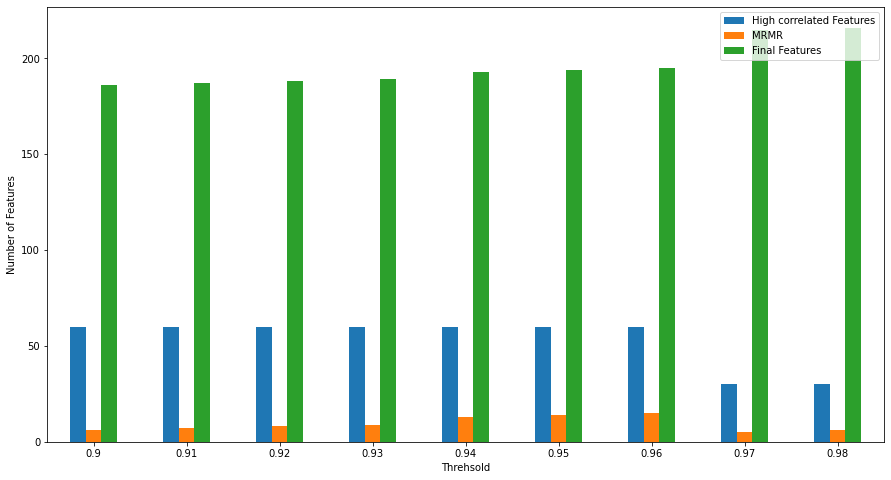

In [125]:
# plt.figure()
ax = features_compare.plot.bar(rot=0,figsize=(15,8))
plt.legend(loc='upper right')
plt.xlabel("Threhsold")
plt.ylabel("Number of Features")
plt.savefig("./pic/Correlation Pic/PowerCity/feature_reduction_PowerCity.png")

## Recursive Feature Elimination

## LightBGM,Random Forest,XGBoost

In [51]:
def lgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    gbm = lgb.LGBMRegressor()
    gbm.fit(x_train, y_train,eval_set = [(x_test,y_test)],early_stopping_rounds = 10)

    features = X_train.columns
    importances = gbm.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = features
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with LightBGM model')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [52]:
def rfr_pipeline(X_train,Y_train,top_feature_num,i):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))

    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train.reshape(-1,))
    
    feature_names = X_train.columns
    importances = rfr.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     fig = sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with Random Forest model')
#     plt.savefig('./pic/RMSE/PowerCity/feature_round_'+str(i)+'.png')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    
    return top_features

In [53]:
def xgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    xgb = XGBRegressor()
    xgb.fit(x_train,y_train.reshape(-1,),eval_set=[(x_test, y_test)],early_stopping_rounds=10)

    feature_names = X_train.columns
    importances = xgb.feature_importances_
#     plot_importance(xgb,max_num_features=10,importance_type='gain',show_values=False)
    
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
# #     plt.barh(importances_df['Feature_Name'][:10], importances_df['Feature_Importance'][:10]) 
#     plt.title('Top 10 features with XGB model')
#     plt.show()
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [54]:
def rfr_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,):
    
    max_end = int(0.2*len(cols))
    
    range_end = 0
    
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                rfr_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))
                rfr_features = list(set(np.array(rfr_features).flatten()))
                features_dict[j] = rfr_features
                print(j,end='\r',flush=True)
                
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
        features_dict = {}
        for j in range(feature_num_1,range_end+1):
            rfr_features = []
            for i in range(5):
                col_len = int(len(cols)*i*0.2)
                now_cols = cols[col_len:]
                rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))

            rfr_features = list(set(np.array(rfr_features).flatten()))
            features_dict[j] = rfr_features
        
            print(j,end='\r',flush=True)
        return features_dict

In [55]:
def lgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0

    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                lgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    lgb_features.append( lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))

                lgb_features = list(set(np.array(lgb_features).flatten()))
                features_dict[j] = lgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    features_dict = {}
    
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
    
    for j in range(feature_num_1,range_end+1):
        lgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            lgb_features.append(lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        lgb_features = list(set(np.array(lgb_features).flatten()))
        features_dict[j] = lgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [56]:
def xgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                xgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                xgb_features = list(set(np.array(xgb_features).flatten()))
                features_dict[j] = xgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        xgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        xgb_features = list(set(np.array(xgb_features).flatten()))
        features_dict[j] = xgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [57]:
real_lgb = {}
for k,v in feature_collections.items():
    real_lgb[k] = lgb_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.11077
[4]	valid_0's l2: 0.105118
[5]	valid_0's l2: 0.097237
[6]	valid_0's l2: 0.0935648
[7]	valid_0's l2: 0.0866957
[8]	valid_0's l2: 0.0845207
[9]	valid_0's l2: 0.0816034
[10]	valid_0's l2: 0.078675
[11]	valid_0's l2: 0.0766003
[12]	valid_0's l2: 0.0754082
[13]	valid_0's l2: 0.0742994
[14]	valid_0's l2: 0.0728102
[15]	valid_0's l2: 0.0720291
[16]	valid_0's l2: 0.0711108
[17]	valid_0's l2: 0.0710769
[18]	valid_0's l2: 0.0697331
[19]	valid_0's l2: 0.0694418
[20]	valid_0's l2: 0.0695649
[21]	valid_0's l2: 0.0689319
[22]	valid_0's l2: 0.0693174
[23]	valid_0's l2: 0.0692427
[24]	valid_0's l2: 0.0684448
[25]	valid_0's l2: 0.0683414
[26]	valid_0's l2: 0.0679072
[27]	valid_0's l2: 0.0677347
[28]	valid_0's l2: 0.0677988
[29]	valid_0's l2: 0.0678846
[30]	valid_0's l2: 0.0675979
[31]	valid_0's l2: 0.068105
[32]	valid_0's l2: 0.0680182
[33]	valid_0's l2: 0.0678905
[34]	valid_0's l2: 0.0679754
[35]	valid_0's l2: 0.0680469
[36]

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.11077
[4]	valid_0's l2: 0.105118
[5]	valid_0's l2: 0.097237
[6]	valid_0's l2: 0.0935648
[7]	valid_0's l2: 0.0866957
[8]	valid_0's l2: 0.0845207
[9]	valid_0's l2: 0.0816034
[10]	valid_0's l2: 0.078675
[11]	valid_0's l2: 0.0766003
[12]	valid_0's l2: 0.0754082
[13]	valid_0's l2: 0.0742994
[14]	valid_0's l2: 0.0728102
[15]	valid_0's l2: 0.0720291
[16]	valid_0's l2: 0.0711108
[17]	valid_0's l2: 0.0710769
[18]	valid_0's l2: 0.0697331
[19]	valid_0's l2: 0.0694418
[20]	valid_0's l2: 0.0695649
[21]	valid_0's l2: 0.0689319
[22]	valid_0's l2: 0.0693174
[23]	valid_0's l2: 0.0692427
[24]	valid_0's l2: 0.0684448
[25]	valid_0's l2: 0.0683414
[26]	valid_0's l2: 0.0679072
[27]	valid_0's l2: 0.0677347
[28]	valid_0's l2: 0.0677988
[29]	valid_0's l2: 0.0678846
[30]	valid_0's l2: 0.0675979
[31]	valid_0's l2: 0.068105
[32]	valid_0's l2: 0.0680182
[33]	valid_0's l2: 0.0678905
[34]	valid_0's l2: 0.0679754
[35]	valid_0's l2: 0.0680469
[36]

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.11077
[4]	valid_0's l2: 0.105118
[5]	valid_0's l2: 0.097237
[6]	valid_0's l2: 0.0935648
[7]	valid_0's l2: 0.0866957
[8]	valid_0's l2: 0.0845207
[9]	valid_0's l2: 0.0816034
[10]	valid_0's l2: 0.078675
[11]	valid_0's l2: 0.0766003
[12]	valid_0's l2: 0.0754082
[13]	valid_0's l2: 0.0742994
[14]	valid_0's l2: 0.0728102
[15]	valid_0's l2: 0.0720291
[16]	valid_0's l2: 0.0711108
[17]	valid_0's l2: 0.0710769
[18]	valid_0's l2: 0.0697331
[19]	valid_0's l2: 0.0694418
[20]	valid_0's l2: 0.0695649
[21]	valid_0's l2: 0.0689319
[22]	valid_0's l2: 0.0693174
[23]	valid_0's l2: 0.0692427
[24]	valid_0's l2: 0.0684448
[25]	valid_0's l2: 0.0683414
[26]	valid_0's l2: 0.0679072
[27]	valid_0's l2: 0.0677347
[28]	valid_0's l2: 0.0677988
[29]	valid_0's l2: 0.0678846
[30]	valid_0's l2: 0.0675979
[31]	valid_0's l2: 0.068105
[32]	valid_0's l2: 0.0680182
[33]	valid_0's l2: 0.0678905
[34]	valid_0's l2: 0.0679754
[35]	valid_0's l2: 0.0680469
[36]

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.11077
[4]	valid_0's l2: 0.105118
[5]	valid_0's l2: 0.097237
[6]	valid_0's l2: 0.0935648
[7]	valid_0's l2: 0.0866957
[8]	valid_0's l2: 0.0845207
[9]	valid_0's l2: 0.0816034
[10]	valid_0's l2: 0.078675
[11]	valid_0's l2: 0.0766003
[12]	valid_0's l2: 0.0754082
[13]	valid_0's l2: 0.0742994
[14]	valid_0's l2: 0.0728102
[15]	valid_0's l2: 0.0720291
[16]	valid_0's l2: 0.0711108
[17]	valid_0's l2: 0.0710769
[18]	valid_0's l2: 0.0697331
[19]	valid_0's l2: 0.0694418
[20]	valid_0's l2: 0.0695649
[21]	valid_0's l2: 0.0689319
[22]	valid_0's l2: 0.0693174
[23]	valid_0's l2: 0.0692427
[24]	valid_0's l2: 0.0684448
[25]	valid_0's l2: 0.0683414
[26]	valid_0's l2: 0.0679072
[27]	valid_0's l2: 0.0677347
[28]	valid_0's l2: 0.0677988
[29]	valid_0's l2: 0.0678846
[30]	valid_0's l2: 0.0675979
[31]	valid_0's l2: 0.068105
[32]	valid_0's l2: 0.0680182
[33]	valid_0's l2: 0.0678905
[34]	valid_0's l2: 0.0679754
[35]	valid_0's l2: 0.0680469
[36]

[73]	valid_0's l2: 0.0527611
[74]	valid_0's l2: 0.0527229
[75]	valid_0's l2: 0.0525213
[76]	valid_0's l2: 0.0524163
[77]	valid_0's l2: 0.0525107
[78]	valid_0's l2: 0.0525511
[79]	valid_0's l2: 0.0524534
[80]	valid_0's l2: 0.0522852
[81]	valid_0's l2: 0.0522049
[82]	valid_0's l2: 0.0523182
[83]	valid_0's l2: 0.052304
[84]	valid_0's l2: 0.052308
[85]	valid_0's l2: 0.0521797
[86]	valid_0's l2: 0.0520733
[87]	valid_0's l2: 0.0519972
[88]	valid_0's l2: 0.0519842
[89]	valid_0's l2: 0.0518136
[90]	valid_0's l2: 0.0518678
[91]	valid_0's l2: 0.0518419
[92]	valid_0's l2: 0.0518721
[93]	valid_0's l2: 0.0519546
[94]	valid_0's l2: 0.0519644
[95]	valid_0's l2: 0.0518362
[96]	valid_0's l2: 0.0517642
[97]	valid_0's l2: 0.0518202
[98]	valid_0's l2: 0.0517369
[99]	valid_0's l2: 0.0516962
[100]	valid_0's l2: 0.0515413
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.11077
[4]	valid_0's l2: 0.105118
[5]	valid_0's l2: 0.097237
[6]	valid_0's l2: 0.0935648
[7]	valid_0's l2: 0.0866957
[

[48]	valid_0's l2: 0.0544076
[49]	valid_0's l2: 0.0543204
[50]	valid_0's l2: 0.0544022
[51]	valid_0's l2: 0.0543758
[52]	valid_0's l2: 0.0542997
[53]	valid_0's l2: 0.0544444
[54]	valid_0's l2: 0.0542482
[55]	valid_0's l2: 0.0539767
[56]	valid_0's l2: 0.0539701
[57]	valid_0's l2: 0.0538855
[58]	valid_0's l2: 0.0538852
[59]	valid_0's l2: 0.0538952
[60]	valid_0's l2: 0.0539044
[61]	valid_0's l2: 0.0538092
[62]	valid_0's l2: 0.0539688
[63]	valid_0's l2: 0.0536684
[64]	valid_0's l2: 0.0535564
[65]	valid_0's l2: 0.053496
[66]	valid_0's l2: 0.0534271
[67]	valid_0's l2: 0.0532909
[68]	valid_0's l2: 0.0532903
[69]	valid_0's l2: 0.0531733
[70]	valid_0's l2: 0.0530111
[71]	valid_0's l2: 0.0528405
[72]	valid_0's l2: 0.0528632
[73]	valid_0's l2: 0.0527611
[74]	valid_0's l2: 0.0527229
[75]	valid_0's l2: 0.0525213
[76]	valid_0's l2: 0.0524163
[77]	valid_0's l2: 0.0525107
[78]	valid_0's l2: 0.0525511
[79]	valid_0's l2: 0.0524534
[80]	valid_0's l2: 0.0522852
[81]	valid_0's l2: 0.0522049
[82]	valid_0's 

[19]	valid_0's l2: 0.0649319
[20]	valid_0's l2: 0.064248
[21]	valid_0's l2: 0.0634749
[22]	valid_0's l2: 0.0625761
[23]	valid_0's l2: 0.0618684
[24]	valid_0's l2: 0.0613879
[25]	valid_0's l2: 0.0608246
[26]	valid_0's l2: 0.0604964
[27]	valid_0's l2: 0.0602047
[28]	valid_0's l2: 0.0600587
[29]	valid_0's l2: 0.0599586
[30]	valid_0's l2: 0.0596749
[31]	valid_0's l2: 0.0595923
[32]	valid_0's l2: 0.0591839
[33]	valid_0's l2: 0.0588461
[34]	valid_0's l2: 0.0585713
[35]	valid_0's l2: 0.0581037
[36]	valid_0's l2: 0.0578328
[37]	valid_0's l2: 0.0571906
[38]	valid_0's l2: 0.0572763
[39]	valid_0's l2: 0.0569463
[40]	valid_0's l2: 0.0567492
[41]	valid_0's l2: 0.0561461
[42]	valid_0's l2: 0.0556222
[43]	valid_0's l2: 0.0554655
[44]	valid_0's l2: 0.0553221
[45]	valid_0's l2: 0.0552306
[46]	valid_0's l2: 0.0551422
[47]	valid_0's l2: 0.0545444
[48]	valid_0's l2: 0.0544076
[49]	valid_0's l2: 0.0543204
[50]	valid_0's l2: 0.0544022
[51]	valid_0's l2: 0.0543758
[52]	valid_0's l2: 0.0542997
[53]	valid_0's 

[91]	valid_0's l2: 0.0527858
[92]	valid_0's l2: 0.0528183
[93]	valid_0's l2: 0.0528249
[94]	valid_0's l2: 0.0527923
[1]	valid_0's l2: 0.129395
[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773081
[12]	valid_0's l2: 0.0743676
[13]	valid_0's l2: 0.0730775
[14]	valid_0's l2: 0.0708288
[15]	valid_0's l2: 0.0701007
[16]	valid_0's l2: 0.0689942
[17]	valid_0's l2: 0.0677384
[18]	valid_0's l2: 0.0657104
[19]	valid_0's l2: 0.0649319
[20]	valid_0's l2: 0.064248
[21]	valid_0's l2: 0.0634749
[22]	valid_0's l2: 0.0625761
[23]	valid_0's l2: 0.0618684
[24]	valid_0's l2: 0.0613879
[25]	valid_0's l2: 0.0608246
[26]	valid_0's l2: 0.0604964
[27]	valid_0's l2: 0.0602047
[28]	valid_0's l2: 0.0600587
[29]	valid_0's l2: 0.0599586
[30]	valid_0's l2: 0.0596749
[31]	valid_0's l2: 0.0595923
[

[60]	valid_0's l2: 0.0539044
[61]	valid_0's l2: 0.0538092
[62]	valid_0's l2: 0.0539688
[63]	valid_0's l2: 0.0536684
[64]	valid_0's l2: 0.0535564
[65]	valid_0's l2: 0.053496
[66]	valid_0's l2: 0.0534271
[67]	valid_0's l2: 0.0532909
[68]	valid_0's l2: 0.0532903
[69]	valid_0's l2: 0.0531733
[70]	valid_0's l2: 0.0530111
[71]	valid_0's l2: 0.0528405
[72]	valid_0's l2: 0.0528632
[73]	valid_0's l2: 0.0527611
[74]	valid_0's l2: 0.0527229
[75]	valid_0's l2: 0.0525213
[76]	valid_0's l2: 0.0524163
[77]	valid_0's l2: 0.0525107
[78]	valid_0's l2: 0.0525511
[79]	valid_0's l2: 0.0524534
[80]	valid_0's l2: 0.0522852
[81]	valid_0's l2: 0.0522049
[82]	valid_0's l2: 0.0523182
[83]	valid_0's l2: 0.052304
[84]	valid_0's l2: 0.052308
[85]	valid_0's l2: 0.0521797
[86]	valid_0's l2: 0.0520733
[87]	valid_0's l2: 0.0519972
[88]	valid_0's l2: 0.0519842
[89]	valid_0's l2: 0.0518136
[90]	valid_0's l2: 0.0518678
[91]	valid_0's l2: 0.0518419
[92]	valid_0's l2: 0.0518721
[93]	valid_0's l2: 0.0519546
[94]	valid_0's l2

[51]	valid_0's l2: 0.0543758
[52]	valid_0's l2: 0.0542997
[53]	valid_0's l2: 0.0544444
[54]	valid_0's l2: 0.0542482
[55]	valid_0's l2: 0.0539767
[56]	valid_0's l2: 0.0539701
[57]	valid_0's l2: 0.0538855
[58]	valid_0's l2: 0.0538852
[59]	valid_0's l2: 0.0538952
[60]	valid_0's l2: 0.0539044
[61]	valid_0's l2: 0.0538092
[62]	valid_0's l2: 0.0539688
[63]	valid_0's l2: 0.0536684
[64]	valid_0's l2: 0.0535564
[65]	valid_0's l2: 0.053496
[66]	valid_0's l2: 0.0534271
[67]	valid_0's l2: 0.0532909
[68]	valid_0's l2: 0.0532903
[69]	valid_0's l2: 0.0531733
[70]	valid_0's l2: 0.0530111
[71]	valid_0's l2: 0.0528405
[72]	valid_0's l2: 0.0528632
[73]	valid_0's l2: 0.0527611
[74]	valid_0's l2: 0.0527229
[75]	valid_0's l2: 0.0525213
[76]	valid_0's l2: 0.0524163
[77]	valid_0's l2: 0.0525107
[78]	valid_0's l2: 0.0525511
[79]	valid_0's l2: 0.0524534
[80]	valid_0's l2: 0.0522852
[81]	valid_0's l2: 0.0522049
[82]	valid_0's l2: 0.0523182
[83]	valid_0's l2: 0.052304
[84]	valid_0's l2: 0.052308
[85]	valid_0's l2

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.110792
[4]	valid_0's l2: 0.105139
[5]	valid_0's l2: 0.0972542
[6]	valid_0's l2: 0.0935811
[7]	valid_0's l2: 0.0867066
[8]	valid_0's l2: 0.0844885
[9]	valid_0's l2: 0.0815741
[10]	valid_0's l2: 0.0787028
[11]	valid_0's l2: 0.0765885
[12]	valid_0's l2: 0.0753919
[13]	valid_0's l2: 0.0742687
[14]	valid_0's l2: 0.0727267
[15]	valid_0's l2: 0.0717618
[16]	valid_0's l2: 0.0708252
[17]	valid_0's l2: 0.0708048
[18]	valid_0's l2: 0.0697973
[19]	valid_0's l2: 0.0695202
[20]	valid_0's l2: 0.0699543
[21]	valid_0's l2: 0.069053
[22]	valid_0's l2: 0.0687708
[23]	valid_0's l2: 0.0683747
[24]	valid_0's l2: 0.0682755
[25]	valid_0's l2: 0.068922
[26]	valid_0's l2: 0.0686189
[27]	valid_0's l2: 0.0690634
[28]	valid_0's l2: 0.0688331
[29]	valid_0's l2: 0.0692561
[30]	valid_0's l2: 0.0688522
[31]	valid_0's l2: 0.0687589
[32]	valid_0's l2: 0.0691833
[33]	valid_0's l2: 0.0691017
[34]	valid_0's l2: 0.0686801
[1]	valid_0's l2: 0.12917
[2]	v

[98]	valid_0's l2: 0.0517369
[99]	valid_0's l2: 0.0516962
[100]	valid_0's l2: 0.0515413
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.110792
[4]	valid_0's l2: 0.105139
[5]	valid_0's l2: 0.0972542
[6]	valid_0's l2: 0.0935811
[7]	valid_0's l2: 0.0867066
[8]	valid_0's l2: 0.0844885
[9]	valid_0's l2: 0.0815741
[10]	valid_0's l2: 0.0787028
[11]	valid_0's l2: 0.0765885
[12]	valid_0's l2: 0.0753919
[13]	valid_0's l2: 0.0742687
[14]	valid_0's l2: 0.0727267
[15]	valid_0's l2: 0.0717618
[16]	valid_0's l2: 0.0708252
[17]	valid_0's l2: 0.0708048
[18]	valid_0's l2: 0.0697973
[19]	valid_0's l2: 0.0695202
[20]	valid_0's l2: 0.0699543
[21]	valid_0's l2: 0.069053
[22]	valid_0's l2: 0.0687708
[23]	valid_0's l2: 0.0683747
[24]	valid_0's l2: 0.0682755
[25]	valid_0's l2: 0.068922
[26]	valid_0's l2: 0.0686189
[27]	valid_0's l2: 0.0690634
[28]	valid_0's l2: 0.0688331
[29]	valid_0's l2: 0.0692561
[30]	valid_0's l2: 0.0688522
[31]	valid_0's l2: 0.0687589
[32]	valid_0's l2: 0.0691833
[

[38]	valid_0's l2: 0.0572763
[39]	valid_0's l2: 0.0569463
[40]	valid_0's l2: 0.0567492
[41]	valid_0's l2: 0.0561461
[42]	valid_0's l2: 0.0556222
[43]	valid_0's l2: 0.0554655
[44]	valid_0's l2: 0.0553221
[45]	valid_0's l2: 0.0552306
[46]	valid_0's l2: 0.0551422
[47]	valid_0's l2: 0.0545444
[48]	valid_0's l2: 0.0544076
[49]	valid_0's l2: 0.0543204
[50]	valid_0's l2: 0.0544022
[51]	valid_0's l2: 0.0543758
[52]	valid_0's l2: 0.0542997
[53]	valid_0's l2: 0.0544444
[54]	valid_0's l2: 0.0542482
[55]	valid_0's l2: 0.0539767
[56]	valid_0's l2: 0.0539701
[57]	valid_0's l2: 0.0538855
[58]	valid_0's l2: 0.0538852
[59]	valid_0's l2: 0.0538952
[60]	valid_0's l2: 0.0539044
[61]	valid_0's l2: 0.0538092
[62]	valid_0's l2: 0.0539688
[63]	valid_0's l2: 0.0536684
[64]	valid_0's l2: 0.0535564
[65]	valid_0's l2: 0.053496
[66]	valid_0's l2: 0.0534271
[67]	valid_0's l2: 0.0532909
[68]	valid_0's l2: 0.0532903
[69]	valid_0's l2: 0.0531733
[70]	valid_0's l2: 0.0530111
[71]	valid_0's l2: 0.0528405
[72]	valid_0's 

[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773081
[12]	valid_0's l2: 0.0743676
[13]	valid_0's l2: 0.0730775
[14]	valid_0's l2: 0.0708288
[15]	valid_0's l2: 0.0701007
[16]	valid_0's l2: 0.0689942
[17]	valid_0's l2: 0.0677384
[18]	valid_0's l2: 0.0657104
[19]	valid_0's l2: 0.0649319
[20]	valid_0's l2: 0.064248
[21]	valid_0's l2: 0.0634749
[22]	valid_0's l2: 0.0625761
[23]	valid_0's l2: 0.0618684
[24]	valid_0's l2: 0.0613879
[25]	valid_0's l2: 0.0608246
[26]	valid_0's l2: 0.0604964
[27]	valid_0's l2: 0.0602047
[28]	valid_0's l2: 0.0600587
[29]	valid_0's l2: 0.0599586
[30]	valid_0's l2: 0.0596749
[31]	valid_0's l2: 0.0595923
[32]	valid_0's l2: 0.0591839
[33]	valid_0's l2: 0.0588461
[34]	valid_0's l2: 0.0585713
[35]	valid_0's l2: 0.0581037
[36]	valid_0's l2: 0.0578328

[41]	valid_0's l2: 0.0551268
[42]	valid_0's l2: 0.055191
[43]	valid_0's l2: 0.0550316
[44]	valid_0's l2: 0.0547224
[45]	valid_0's l2: 0.054659
[46]	valid_0's l2: 0.054309
[47]	valid_0's l2: 0.0541827
[48]	valid_0's l2: 0.0539192
[49]	valid_0's l2: 0.0540313
[50]	valid_0's l2: 0.0538724
[51]	valid_0's l2: 0.0537258
[52]	valid_0's l2: 0.0535388
[53]	valid_0's l2: 0.0535781
[54]	valid_0's l2: 0.0533658
[55]	valid_0's l2: 0.0535789
[56]	valid_0's l2: 0.0535618
[57]	valid_0's l2: 0.0536189
[58]	valid_0's l2: 0.0533929
[59]	valid_0's l2: 0.0532788
[60]	valid_0's l2: 0.0532433
[61]	valid_0's l2: 0.0531942
[62]	valid_0's l2: 0.0532515
[63]	valid_0's l2: 0.0532356
[64]	valid_0's l2: 0.0531983
[65]	valid_0's l2: 0.0532999
[66]	valid_0's l2: 0.0532267
[67]	valid_0's l2: 0.0530933
[68]	valid_0's l2: 0.0531483
[69]	valid_0's l2: 0.0530857
[70]	valid_0's l2: 0.0530441
[71]	valid_0's l2: 0.0531058
[72]	valid_0's l2: 0.053128
[73]	valid_0's l2: 0.0531241
[74]	valid_0's l2: 0.0530968
[75]	valid_0's l2:

[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0's l2: 0.104957
[5]	valid_0's l2: 0.0967891
[6]	valid_0's l2: 0.0922241
[7]	valid_0's l2: 0.0882336
[8]	valid_0's l2: 0.0830613
[9]	valid_0's l2: 0.0808897
[10]	valid_0's l2: 0.0789561
[11]	valid_0's l2: 0.0760744
[12]	valid_0's l2: 0.074913
[13]	valid_0's l2: 0.0733018
[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678414
[18]	valid_0's l2: 0.0668601
[19]	valid_0's l2: 0.0656249
[20]	valid_0's l2: 0.065187
[21]	valid_0's l2: 0.0638901
[22]	valid_0's l2: 0.0626851
[23]	valid_0's l2: 0.0617338
[24]	valid_0's l2: 0.0613904
[25]	valid_0's l2: 0.0608714
[26]	valid_0's l2: 0.0602159
[27]	valid_0's l2: 0.0598648
[28]	valid_0's l2: 0.0593667
[29]	valid_0's l2: 0.0589796
[30]	valid_0's l2: 0.0586408
[31]	valid_0's l2: 0.0581668
[32]	valid_0's l2: 0.0579319
[33]	valid_0's l2: 0.0575473
[34]	valid_0's l2: 0.0573387
[35]	valid_0's l2: 0.0573358
[36]	valid_0's l2: 0.0569656


[9]	valid_0's l2: 0.0808897
[10]	valid_0's l2: 0.0789561
[11]	valid_0's l2: 0.0760744
[12]	valid_0's l2: 0.074913
[13]	valid_0's l2: 0.0733018
[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678414
[18]	valid_0's l2: 0.0668601
[19]	valid_0's l2: 0.0656249
[20]	valid_0's l2: 0.065187
[21]	valid_0's l2: 0.0638901
[22]	valid_0's l2: 0.0626851
[23]	valid_0's l2: 0.0617338
[24]	valid_0's l2: 0.0613904
[25]	valid_0's l2: 0.0608714
[26]	valid_0's l2: 0.0602159
[27]	valid_0's l2: 0.0598648
[28]	valid_0's l2: 0.0593667
[29]	valid_0's l2: 0.0589796
[30]	valid_0's l2: 0.0586408
[31]	valid_0's l2: 0.0581668
[32]	valid_0's l2: 0.0579319
[33]	valid_0's l2: 0.0575473
[34]	valid_0's l2: 0.0573387
[35]	valid_0's l2: 0.0573358
[36]	valid_0's l2: 0.0569656
[37]	valid_0's l2: 0.0566243
[38]	valid_0's l2: 0.056372
[39]	valid_0's l2: 0.0558796
[40]	valid_0's l2: 0.0556487
[41]	valid_0's l2: 0.0551268
[42]	valid_0's l2: 0.055191
[43]	valid_0's l2: 0.

[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678414
[18]	valid_0's l2: 0.0668601
[19]	valid_0's l2: 0.0656249
[20]	valid_0's l2: 0.065187
[21]	valid_0's l2: 0.0638901
[22]	valid_0's l2: 0.0626851
[23]	valid_0's l2: 0.0617338
[24]	valid_0's l2: 0.0613904
[25]	valid_0's l2: 0.0608714
[26]	valid_0's l2: 0.0602159
[27]	valid_0's l2: 0.0598648
[28]	valid_0's l2: 0.0593667
[29]	valid_0's l2: 0.0589796
[30]	valid_0's l2: 0.0586408
[31]	valid_0's l2: 0.0581668
[32]	valid_0's l2: 0.0579319
[33]	valid_0's l2: 0.0575473
[34]	valid_0's l2: 0.0573387
[35]	valid_0's l2: 0.0573358
[36]	valid_0's l2: 0.0569656
[37]	valid_0's l2: 0.0566243
[38]	valid_0's l2: 0.056372
[39]	valid_0's l2: 0.0558796
[40]	valid_0's l2: 0.0556487
[41]	valid_0's l2: 0.0551268
[42]	valid_0's l2: 0.055191
[43]	valid_0's l2: 0.0550316
[44]	valid_0's l2: 0.0547224
[45]	valid_0's l2: 0.054659
[46]	valid_0's l2: 0.054309
[47]	valid_0's l2: 0.0541827
[48]	valid_0's l2: 0.0539192
[49]	valid_0's l2: 0.

[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773081
[12]	valid_0's l2: 0.0743676
[13]	valid_0's l2: 0.0730775
[14]	valid_0's l2: 0.0708288
[15]	valid_0's l2: 0.0701007
[16]	valid_0's l2: 0.0689942
[17]	valid_0's l2: 0.0677384
[18]	valid_0's l2: 0.0657104
[19]	valid_0's l2: 0.0649319
[20]	valid_0's l2: 0.064248
[21]	valid_0's l2: 0.0634749
[22]	valid_0's l2: 0.0625761
[23]	valid_0's l2: 0.0618684
[24]	valid_0's l2: 0.0613879
[25]	valid_0's l2: 0.0608246
[26]	valid_0's l2: 0.0604964
[27]	valid_0's l2: 0.0602047
[28]	valid_0's l2: 0.0600587
[29]	valid_0's l2: 0.0599586
[30]	valid_0's l2: 0.0596749
[31]	valid_0's l2: 0.0595923
[32]	valid_0's l2: 0.0591839
[33]	valid_0's l2: 0.0588461
[34]	valid_0's l2: 0.0585713
[35]	valid_0's l2: 0.0581037
[36]	valid_0's l2: 0.0578328

[46]	valid_0's l2: 0.054309
[47]	valid_0's l2: 0.0541827
[48]	valid_0's l2: 0.0539192
[49]	valid_0's l2: 0.0540313
[50]	valid_0's l2: 0.0538724
[51]	valid_0's l2: 0.0537258
[52]	valid_0's l2: 0.0535388
[53]	valid_0's l2: 0.0535781
[54]	valid_0's l2: 0.0533658
[55]	valid_0's l2: 0.0535789
[56]	valid_0's l2: 0.0535618
[57]	valid_0's l2: 0.0536189
[58]	valid_0's l2: 0.0533929
[59]	valid_0's l2: 0.0532788
[60]	valid_0's l2: 0.0532433
[61]	valid_0's l2: 0.0531942
[62]	valid_0's l2: 0.0532515
[63]	valid_0's l2: 0.0532356
[64]	valid_0's l2: 0.0531983
[65]	valid_0's l2: 0.0532999
[66]	valid_0's l2: 0.0532267
[67]	valid_0's l2: 0.0530933
[68]	valid_0's l2: 0.0531483
[69]	valid_0's l2: 0.0530857
[70]	valid_0's l2: 0.0530441
[71]	valid_0's l2: 0.0531058
[72]	valid_0's l2: 0.053128
[73]	valid_0's l2: 0.0531241
[74]	valid_0's l2: 0.0530968
[75]	valid_0's l2: 0.0529437
[76]	valid_0's l2: 0.0530876
[77]	valid_0's l2: 0.0531167
[78]	valid_0's l2: 0.0529543
[79]	valid_0's l2: 0.0527679
[80]	valid_0's l

[51]	valid_0's l2: 0.0537258
[52]	valid_0's l2: 0.0535388
[53]	valid_0's l2: 0.0535781
[54]	valid_0's l2: 0.0533658
[55]	valid_0's l2: 0.0535789
[56]	valid_0's l2: 0.0535618
[57]	valid_0's l2: 0.0536189
[58]	valid_0's l2: 0.0533929
[59]	valid_0's l2: 0.0532788
[60]	valid_0's l2: 0.0532433
[61]	valid_0's l2: 0.0531942
[62]	valid_0's l2: 0.0532515
[63]	valid_0's l2: 0.0532356
[64]	valid_0's l2: 0.0531983
[65]	valid_0's l2: 0.0532999
[66]	valid_0's l2: 0.0532267
[67]	valid_0's l2: 0.0530933
[68]	valid_0's l2: 0.0531483
[69]	valid_0's l2: 0.0530857
[70]	valid_0's l2: 0.0530441
[71]	valid_0's l2: 0.0531058
[72]	valid_0's l2: 0.053128
[73]	valid_0's l2: 0.0531241
[74]	valid_0's l2: 0.0530968
[75]	valid_0's l2: 0.0529437
[76]	valid_0's l2: 0.0530876
[77]	valid_0's l2: 0.0531167
[78]	valid_0's l2: 0.0529543
[79]	valid_0's l2: 0.0527679
[80]	valid_0's l2: 0.0528234
[81]	valid_0's l2: 0.0528166
[82]	valid_0's l2: 0.0527816
[83]	valid_0's l2: 0.052747
[84]	valid_0's l2: 0.0527107
[85]	valid_0's l

[34]	valid_0's l2: 0.0584433
[35]	valid_0's l2: 0.0584176
[36]	valid_0's l2: 0.0584183
[37]	valid_0's l2: 0.0584578
[38]	valid_0's l2: 0.0582292
[39]	valid_0's l2: 0.0575743
[40]	valid_0's l2: 0.0576822
[41]	valid_0's l2: 0.0577625
[42]	valid_0's l2: 0.0578007
[43]	valid_0's l2: 0.0577198
[44]	valid_0's l2: 0.0573587
[45]	valid_0's l2: 0.0569604
[46]	valid_0's l2: 0.0567873
[47]	valid_0's l2: 0.0567195
[48]	valid_0's l2: 0.0566527
[49]	valid_0's l2: 0.0563474
[50]	valid_0's l2: 0.0559123
[51]	valid_0's l2: 0.0558466
[52]	valid_0's l2: 0.0559963
[53]	valid_0's l2: 0.0559477
[54]	valid_0's l2: 0.0559127
[55]	valid_0's l2: 0.0559543
[56]	valid_0's l2: 0.0558975
[57]	valid_0's l2: 0.0557504
[58]	valid_0's l2: 0.0559363
[59]	valid_0's l2: 0.0557758
[60]	valid_0's l2: 0.0557983
[61]	valid_0's l2: 0.055783
[62]	valid_0's l2: 0.0558207
[63]	valid_0's l2: 0.0560918
[64]	valid_0's l2: 0.0563092
[65]	valid_0's l2: 0.0562162
[66]	valid_0's l2: 0.0561657
[67]	valid_0's l2: 0.0561061
[1]	valid_0's l

[2]	valid_0's l2: 0.118924
[3]	valid_0's l2: 0.111019
[4]	valid_0's l2: 0.105346
[5]	valid_0's l2: 0.0974584
[6]	valid_0's l2: 0.0928909
[7]	valid_0's l2: 0.0857524
[8]	valid_0's l2: 0.0829447
[9]	valid_0's l2: 0.0811643
[10]	valid_0's l2: 0.0781519
[11]	valid_0's l2: 0.0762701
[12]	valid_0's l2: 0.0746906
[13]	valid_0's l2: 0.0735833
[14]	valid_0's l2: 0.0722009
[15]	valid_0's l2: 0.0711402
[16]	valid_0's l2: 0.0701096
[17]	valid_0's l2: 0.0701487
[18]	valid_0's l2: 0.0689257
[19]	valid_0's l2: 0.0693435
[20]	valid_0's l2: 0.0686743
[21]	valid_0's l2: 0.0685868
[22]	valid_0's l2: 0.0685334
[23]	valid_0's l2: 0.067798
[24]	valid_0's l2: 0.068301
[25]	valid_0's l2: 0.0682007
[26]	valid_0's l2: 0.0688277
[27]	valid_0's l2: 0.0688821
[28]	valid_0's l2: 0.0693747
[29]	valid_0's l2: 0.0692053
[30]	valid_0's l2: 0.0688054
[31]	valid_0's l2: 0.0687485
[32]	valid_0's l2: 0.068908
[33]	valid_0's l2: 0.0686535
[1]	valid_0's l2: 0.129474
[2]	valid_0's l2: 0.119298
[3]	valid_0's l2: 0.111884
[4]	v

[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0's l2: 0.104957
[5]	valid_0's l2: 0.0967891
[6]	valid_0's l2: 0.0922241
[7]	valid_0's l2: 0.0882336
[8]	valid_0's l2: 0.0830613
[9]	valid_0's l2: 0.0808897
[10]	valid_0's l2: 0.0789561
[11]	valid_0's l2: 0.0760744
[12]	valid_0's l2: 0.074913
[13]	valid_0's l2: 0.0733018
[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678413
[18]	valid_0's l2: 0.0668598
[19]	valid_0's l2: 0.0656259
[20]	valid_0's l2: 0.0651876
[21]	valid_0's l2: 0.0638908
[22]	valid_0's l2: 0.0626863
[23]	valid_0's l2: 0.061735
[24]	valid_0's l2: 0.0613917
[25]	valid_0's l2: 0.0608657
[26]	valid_0's l2: 0.0601918
[27]	valid_0's l2: 0.0598818
[28]	valid_0's l2: 0.0593183
[29]	valid_0's l2: 0.0592725
[30]	valid_0's l2: 0.0587525
[31]	valid_0's l2: 0.0584835
[32]	valid_0's l2: 0.0581938
[33]	valid_0's l2: 0.0578132
[34]	valid_0's l2: 0.0575882
[35]	valid_0's l2: 0.0572749
[36]	valid_0's l2: 0.0569488


[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773526
[12]	valid_0's l2: 0.0744171
[13]	valid_0's l2: 0.0731308
[14]	valid_0's l2: 0.0709865
[15]	valid_0's l2: 0.0700166
[16]	valid_0's l2: 0.0682243
[17]	valid_0's l2: 0.0671982
[18]	valid_0's l2: 0.0662526
[19]	valid_0's l2: 0.0654938
[20]	valid_0's l2: 0.0643888
[21]	valid_0's l2: 0.0628741
[22]	valid_0's l2: 0.0620108
[23]	valid_0's l2: 0.0615556
[24]	valid_0's l2: 0.0609772
[25]	valid_0's l2: 0.0606982
[26]	valid_0's l2: 0.0607196
[27]	valid_0's l2: 0.0600311
[28]	valid_0's l2: 0.0598268
[29]	valid_0's l2: 0.0595986
[30]	valid_0's l2: 0.059526
[31]	valid_0's l2: 0.0591137
[32]	valid_0's l2: 0.0590477
[33]	valid_0's l2: 0.0583982
[34]	valid_0's l2: 0.0584433
[35]	valid_0's l2: 0.0584176
[36]	valid_0's l2: 0.0584183

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.110792
[4]	valid_0's l2: 0.105139
[5]	valid_0's l2: 0.0972542
[6]	valid_0's l2: 0.0935811
[7]	valid_0's l2: 0.0867066
[8]	valid_0's l2: 0.0844885
[9]	valid_0's l2: 0.0815741
[10]	valid_0's l2: 0.0787028
[11]	valid_0's l2: 0.0765885
[12]	valid_0's l2: 0.0753919
[13]	valid_0's l2: 0.0742687
[14]	valid_0's l2: 0.0727267
[15]	valid_0's l2: 0.0717618
[16]	valid_0's l2: 0.0708252
[17]	valid_0's l2: 0.0708048
[18]	valid_0's l2: 0.0697973
[19]	valid_0's l2: 0.0695202
[20]	valid_0's l2: 0.0699543
[21]	valid_0's l2: 0.069053
[22]	valid_0's l2: 0.0687708
[23]	valid_0's l2: 0.0683747
[24]	valid_0's l2: 0.0682755
[25]	valid_0's l2: 0.068922
[26]	valid_0's l2: 0.0686189
[27]	valid_0's l2: 0.0690634
[28]	valid_0's l2: 0.0688331
[29]	valid_0's l2: 0.0692561
[30]	valid_0's l2: 0.0688522
[31]	valid_0's l2: 0.0687589
[32]	valid_0's l2: 0.0691833
[33]	valid_0's l2: 0.0691017
[34]	valid_0's l2: 0.0686801
[1]	valid_0's l2: 0.12917
[2]	v

[1]	valid_0's l2: 0.129474
[2]	valid_0's l2: 0.119298
[3]	valid_0's l2: 0.111884
[4]	valid_0's l2: 0.105859
[5]	valid_0's l2: 0.0976216
[6]	valid_0's l2: 0.0933634
[7]	valid_0's l2: 0.0899138
[8]	valid_0's l2: 0.0850295
[9]	valid_0's l2: 0.0828156
[10]	valid_0's l2: 0.0798223
[11]	valid_0's l2: 0.0777464
[12]	valid_0's l2: 0.0752125
[13]	valid_0's l2: 0.0741659
[14]	valid_0's l2: 0.0729051
[15]	valid_0's l2: 0.0720851
[16]	valid_0's l2: 0.0708663
[17]	valid_0's l2: 0.0707753
[18]	valid_0's l2: 0.0701446
[19]	valid_0's l2: 0.070538
[20]	valid_0's l2: 0.070034
[21]	valid_0's l2: 0.0694752
[22]	valid_0's l2: 0.0692456
[23]	valid_0's l2: 0.0696949
[24]	valid_0's l2: 0.0702117
[25]	valid_0's l2: 0.069995
[26]	valid_0's l2: 0.0701294
[27]	valid_0's l2: 0.0703736
[28]	valid_0's l2: 0.0702027
[29]	valid_0's l2: 0.0704492
[30]	valid_0's l2: 0.0706674
[31]	valid_0's l2: 0.0711039
[32]	valid_0's l2: 0.0710869
[1]	valid_0's l2: 0.12946
[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	vali

[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773526
[12]	valid_0's l2: 0.0744171
[13]	valid_0's l2: 0.0731308
[14]	valid_0's l2: 0.0709865
[15]	valid_0's l2: 0.0700166
[16]	valid_0's l2: 0.0682243
[17]	valid_0's l2: 0.0671982
[18]	valid_0's l2: 0.0662526
[19]	valid_0's l2: 0.0654938
[20]	valid_0's l2: 0.0643888
[21]	valid_0's l2: 0.0628741
[22]	valid_0's l2: 0.0620108
[23]	valid_0's l2: 0.0615556
[24]	valid_0's l2: 0.0609772
[25]	valid_0's l2: 0.0606982
[26]	valid_0's l2: 0.0607196
[27]	valid_0's l2: 0.0600311
[28]	valid_0's l2: 0.0598268
[29]	valid_0's l2: 0.0595986
[30]	valid_0's l2: 0.059526
[31]	valid_0's l2: 0.0591137
[32]	valid_0's l2: 0.0590477
[33]	valid_0's l2: 0.0583982
[34]	valid_0's l2: 0.0584433
[35]	valid_0's l2: 0.0584176
[36]	valid_0's l2: 0.0584183

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.11077
[4]	valid_0's l2: 0.105118
[5]	valid_0's l2: 0.0974676
[6]	valid_0's l2: 0.093794
[7]	valid_0's l2: 0.0869093
[8]	valid_0's l2: 0.084721
[9]	valid_0's l2: 0.0810664
[10]	valid_0's l2: 0.0785315
[11]	valid_0's l2: 0.0766363
[12]	valid_0's l2: 0.075077
[13]	valid_0's l2: 0.0737424
[14]	valid_0's l2: 0.0726736
[15]	valid_0's l2: 0.0716303
[16]	valid_0's l2: 0.0707005
[17]	valid_0's l2: 0.0698
[18]	valid_0's l2: 0.0697276
[19]	valid_0's l2: 0.0692923
[20]	valid_0's l2: 0.0688376
[21]	valid_0's l2: 0.0683256
[22]	valid_0's l2: 0.0687737
[23]	valid_0's l2: 0.0680317
[24]	valid_0's l2: 0.068356
[25]	valid_0's l2: 0.0678637
[26]	valid_0's l2: 0.0680597
[27]	valid_0's l2: 0.0683345
[28]	valid_0's l2: 0.0681333
[29]	valid_0's l2: 0.0680005
[30]	valid_0's l2: 0.0680204
[31]	valid_0's l2: 0.0678629
[32]	valid_0's l2: 0.0678784
[33]	valid_0's l2: 0.0683267
[34]	valid_0's l2: 0.0682745
[35]	valid_0's l2: 0.0683613
[36]	val

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0's l2: 0.111019
[4]	valid_0's l2: 0.105346
[5]	valid_0's l2: 0.0974584
[6]	valid_0's l2: 0.0928909
[7]	valid_0's l2: 0.0857524
[8]	valid_0's l2: 0.0829447
[9]	valid_0's l2: 0.0811643
[10]	valid_0's l2: 0.0781519
[11]	valid_0's l2: 0.0762701
[12]	valid_0's l2: 0.0746906
[13]	valid_0's l2: 0.0735833
[14]	valid_0's l2: 0.0722009
[15]	valid_0's l2: 0.0711402
[16]	valid_0's l2: 0.0701096
[17]	valid_0's l2: 0.0701487
[18]	valid_0's l2: 0.0689257
[19]	valid_0's l2: 0.0693435
[20]	valid_0's l2: 0.0686743
[21]	valid_0's l2: 0.0685868
[22]	valid_0's l2: 0.0685334
[23]	valid_0's l2: 0.067798
[24]	valid_0's l2: 0.068301
[25]	valid_0's l2: 0.0680023
[26]	valid_0's l2: 0.0686251
[27]	valid_0's l2: 0.0686348
[28]	valid_0's l2: 0.0683544
[29]	valid_0's l2: 0.0685285
[30]	valid_0's l2: 0.0682196
[31]	valid_0's l2: 0.0684299
[32]	valid_0's l2: 0.0684217
[33]	valid_0's l2: 0.0681803
[1]	valid_0's l2: 0.129474
[2]	valid_0's l2: 0.119298
[3]	v

[33]	valid_0's l2: 0.0705246
[34]	valid_0's l2: 0.0704703
[35]	valid_0's l2: 0.0705732
[36]	valid_0's l2: 0.070594
[37]	valid_0's l2: 0.0703816
[38]	valid_0's l2: 0.0704082
[39]	valid_0's l2: 0.0702173
[1]	valid_0's l2: 0.12946
[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0's l2: 0.104957
[5]	valid_0's l2: 0.0967891
[6]	valid_0's l2: 0.0922241
[7]	valid_0's l2: 0.0882336
[8]	valid_0's l2: 0.0830613
[9]	valid_0's l2: 0.0808897
[10]	valid_0's l2: 0.0789561
[11]	valid_0's l2: 0.0760744
[12]	valid_0's l2: 0.074913
[13]	valid_0's l2: 0.0733018
[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678413
[18]	valid_0's l2: 0.0668598
[19]	valid_0's l2: 0.0656259
[20]	valid_0's l2: 0.0651876
[21]	valid_0's l2: 0.0638908
[22]	valid_0's l2: 0.0626863
[23]	valid_0's l2: 0.061735
[24]	valid_0's l2: 0.0613917
[25]	valid_0's l2: 0.0608657
[26]	valid_0's l2: 0.0601918
[27]	valid_0's l2: 0.0598818
[28]	valid_0's l2: 0.0593183
[29]

[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773526
[12]	valid_0's l2: 0.0744171
[13]	valid_0's l2: 0.0731308
[14]	valid_0's l2: 0.0709865
[15]	valid_0's l2: 0.0700166
[16]	valid_0's l2: 0.0682243
[17]	valid_0's l2: 0.0671982
[18]	valid_0's l2: 0.0662526
[19]	valid_0's l2: 0.0654938
[20]	valid_0's l2: 0.0643888
[21]	valid_0's l2: 0.0628741
[22]	valid_0's l2: 0.0620108
[23]	valid_0's l2: 0.0615556
[24]	valid_0's l2: 0.0609772
[25]	valid_0's l2: 0.0606982
[26]	valid_0's l2: 0.0607196
[27]	valid_0's l2: 0.0600311
[28]	valid_0's l2: 0.0598268
[29]	valid_0's l2: 0.0595986
[30]	valid_0's l2: 0.059526
[31]	valid_0's l2: 0.0591137
[32]	valid_0's l2: 0.0590477
[33]	valid_0's l2: 0.0583982
[34]	valid_0's l2: 0.0584433
[35]	valid_0's l2: 0.0584176
[36]	valid_0's l2: 0.0584183

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.11892
[3]	valid_0's l2: 0.11077
[4]	valid_0's l2: 0.105118
[5]	valid_0's l2: 0.0974676
[6]	valid_0's l2: 0.093794
[7]	valid_0's l2: 0.0869093
[8]	valid_0's l2: 0.084721
[9]	valid_0's l2: 0.0810664
[10]	valid_0's l2: 0.0785315
[11]	valid_0's l2: 0.0766363
[12]	valid_0's l2: 0.075077
[13]	valid_0's l2: 0.0737424
[14]	valid_0's l2: 0.0726736
[15]	valid_0's l2: 0.0716303
[16]	valid_0's l2: 0.0707005
[17]	valid_0's l2: 0.0698
[18]	valid_0's l2: 0.0697276
[19]	valid_0's l2: 0.0692923
[20]	valid_0's l2: 0.0688376
[21]	valid_0's l2: 0.0683256
[22]	valid_0's l2: 0.0687737
[23]	valid_0's l2: 0.0680317
[24]	valid_0's l2: 0.068356
[25]	valid_0's l2: 0.0678637
[26]	valid_0's l2: 0.0680597
[27]	valid_0's l2: 0.0683345
[28]	valid_0's l2: 0.0681333
[29]	valid_0's l2: 0.0680005
[30]	valid_0's l2: 0.0680204
[31]	valid_0's l2: 0.0678629
[32]	valid_0's l2: 0.0678784
[33]	valid_0's l2: 0.0683267
[34]	valid_0's l2: 0.0682745
[35]	valid_0's l2: 0.0683613
[36]	val

[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0's l2: 0.111019
[4]	valid_0's l2: 0.105346
[5]	valid_0's l2: 0.0974584
[6]	valid_0's l2: 0.0928909
[7]	valid_0's l2: 0.0857524
[8]	valid_0's l2: 0.0829447
[9]	valid_0's l2: 0.0811643
[10]	valid_0's l2: 0.0781519
[11]	valid_0's l2: 0.0762701
[12]	valid_0's l2: 0.0746906
[13]	valid_0's l2: 0.0735833
[14]	valid_0's l2: 0.0722009
[15]	valid_0's l2: 0.0711402
[16]	valid_0's l2: 0.0701096
[17]	valid_0's l2: 0.0701487
[18]	valid_0's l2: 0.0689257
[19]	valid_0's l2: 0.0693435
[20]	valid_0's l2: 0.0686743
[21]	valid_0's l2: 0.0685868
[22]	valid_0's l2: 0.0685334
[23]	valid_0's l2: 0.067798
[24]	valid_0's l2: 0.068301
[25]	valid_0's l2: 0.0680023
[26]	valid_0's l2: 0.0686251
[27]	valid_0's l2: 0.0686348
[28]	valid_0's l2: 0.0683544
[29]	valid_0's l2: 0.0685285
[30]	valid_0's l2: 0.0682196
[31]	valid_0's l2: 0.0684299
[32]	valid_0's l2: 0.0684217
[33]	valid_0's l2: 0.0681803
[1]	valid_0's l2: 0.129474
[2]	valid_0's l2: 0.119298
[3]	v

[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0's l2: 0.104957
[5]	valid_0's l2: 0.0967891
[6]	valid_0's l2: 0.0922241
[7]	valid_0's l2: 0.0882336
[8]	valid_0's l2: 0.0830613
[9]	valid_0's l2: 0.0808897
[10]	valid_0's l2: 0.0789561
[11]	valid_0's l2: 0.0760744
[12]	valid_0's l2: 0.074913
[13]	valid_0's l2: 0.0733018
[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678413
[18]	valid_0's l2: 0.0668598
[19]	valid_0's l2: 0.0656259
[20]	valid_0's l2: 0.0651876
[21]	valid_0's l2: 0.0638908
[22]	valid_0's l2: 0.0626863
[23]	valid_0's l2: 0.061735
[24]	valid_0's l2: 0.0613917
[25]	valid_0's l2: 0.0608657
[26]	valid_0's l2: 0.0601918
[27]	valid_0's l2: 0.0598818
[28]	valid_0's l2: 0.0593183
[29]	valid_0's l2: 0.0592725
[30]	valid_0's l2: 0.0587525
[31]	valid_0's l2: 0.0584835
[32]	valid_0's l2: 0.0581938
[33]	valid_0's l2: 0.0578132
[34]	valid_0's l2: 0.0575882
[35]	valid_0's l2: 0.0572749
[36]	valid_0's l2: 0.0569488


[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773526
[12]	valid_0's l2: 0.0744171
[13]	valid_0's l2: 0.0731308
[14]	valid_0's l2: 0.0709865
[15]	valid_0's l2: 0.0700166
[16]	valid_0's l2: 0.0682243
[17]	valid_0's l2: 0.0671982
[18]	valid_0's l2: 0.0662526
[19]	valid_0's l2: 0.0654938
[20]	valid_0's l2: 0.0643888
[21]	valid_0's l2: 0.0628741
[22]	valid_0's l2: 0.0620108
[23]	valid_0's l2: 0.0615556
[24]	valid_0's l2: 0.0609772
[25]	valid_0's l2: 0.0606982
[26]	valid_0's l2: 0.0607196
[27]	valid_0's l2: 0.0600311
[28]	valid_0's l2: 0.0598268
[29]	valid_0's l2: 0.0595986
[30]	valid_0's l2: 0.059526
[31]	valid_0's l2: 0.0591137
[32]	valid_0's l2: 0.0590477
[33]	valid_0's l2: 0.0583982
[34]	valid_0's l2: 0.0584433
[35]	valid_0's l2: 0.0584176
[36]	valid_0's l2: 0.0584183

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.110739
[4]	valid_0's l2: 0.105084
[5]	valid_0's l2: 0.0979921
[6]	valid_0's l2: 0.0940457
[7]	valid_0's l2: 0.0871218
[8]	valid_0's l2: 0.0848676
[9]	valid_0's l2: 0.0809911
[10]	valid_0's l2: 0.078394
[11]	valid_0's l2: 0.0759672
[12]	valid_0's l2: 0.0745449
[13]	valid_0's l2: 0.0728709
[14]	valid_0's l2: 0.0717994
[15]	valid_0's l2: 0.0705
[16]	valid_0's l2: 0.0698253
[17]	valid_0's l2: 0.0690933
[18]	valid_0's l2: 0.0685104
[19]	valid_0's l2: 0.0689393
[20]	valid_0's l2: 0.0686442
[21]	valid_0's l2: 0.0686553
[22]	valid_0's l2: 0.068399
[23]	valid_0's l2: 0.0680262
[24]	valid_0's l2: 0.0680934
[25]	valid_0's l2: 0.0685844
[26]	valid_0's l2: 0.0689279
[27]	valid_0's l2: 0.0684222
[28]	valid_0's l2: 0.0682415
[29]	valid_0's l2: 0.068117
[30]	valid_0's l2: 0.068758
[31]	valid_0's l2: 0.0685119
[32]	valid_0's l2: 0.0685994
[33]	valid_0's l2: 0.0684938
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.111065
[4]	valid_0's l2: 0.105335
[5]	valid_0's l2: 0.0981988
[6]	valid_0's l2: 0.0940703
[7]	valid_0's l2: 0.0885287
[8]	valid_0's l2: 0.0855479
[9]	valid_0's l2: 0.0826709
[10]	valid_0's l2: 0.0797601
[11]	valid_0's l2: 0.0776044
[12]	valid_0's l2: 0.0765413
[13]	valid_0's l2: 0.0751091
[14]	valid_0's l2: 0.073848
[15]	valid_0's l2: 0.072791
[16]	valid_0's l2: 0.0722751
[17]	valid_0's l2: 0.0722998
[18]	valid_0's l2: 0.0714683
[19]	valid_0's l2: 0.0706251
[20]	valid_0's l2: 0.0710697
[21]	valid_0's l2: 0.0705346
[22]	valid_0's l2: 0.0703376
[23]	valid_0's l2: 0.071132
[24]	valid_0's l2: 0.0712517
[25]	valid_0's l2: 0.0710357
[26]	valid_0's l2: 0.0710092
[27]	valid_0's l2: 0.0704704
[28]	valid_0's l2: 0.070957
[29]	valid_0's l2: 0.0708816
[30]	valid_0's l2: 0.0714655
[31]	valid_0's l2: 0.071127
[32]	valid_0's l2: 0.0717341
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0's l2: 0.111345
[4]	valid_0

[27]	valid_0's l2: 0.0695758
[28]	valid_0's l2: 0.0691625
[29]	valid_0's l2: 0.0696738
[30]	valid_0's l2: 0.0697742
[31]	valid_0's l2: 0.0696059
[1]	valid_0's l2: 0.129807
[2]	valid_0's l2: 0.119651
[3]	valid_0's l2: 0.111563
[4]	valid_0's l2: 0.106154
[5]	valid_0's l2: 0.100814
[6]	valid_0's l2: 0.0941599
[7]	valid_0's l2: 0.0905038
[8]	valid_0's l2: 0.0862652
[9]	valid_0's l2: 0.0837907
[10]	valid_0's l2: 0.0813401
[11]	valid_0's l2: 0.0792579
[12]	valid_0's l2: 0.0771159
[13]	valid_0's l2: 0.0757657
[14]	valid_0's l2: 0.0749358
[15]	valid_0's l2: 0.0736852
[16]	valid_0's l2: 0.0731305
[17]	valid_0's l2: 0.0722073
[18]	valid_0's l2: 0.0716465
[19]	valid_0's l2: 0.0721942
[20]	valid_0's l2: 0.0717372
[21]	valid_0's l2: 0.0721906
[22]	valid_0's l2: 0.0714524
[23]	valid_0's l2: 0.0713205
[24]	valid_0's l2: 0.0718368
[25]	valid_0's l2: 0.0722947
[26]	valid_0's l2: 0.0718661
[27]	valid_0's l2: 0.0723982
[28]	valid_0's l2: 0.0721099
[29]	valid_0's l2: 0.0718296
[30]	valid_0's l2: 0.0716817

[9]	valid_0's l2: 0.0837907
[10]	valid_0's l2: 0.0813401
[11]	valid_0's l2: 0.0792579
[12]	valid_0's l2: 0.0771159
[13]	valid_0's l2: 0.0757657
[14]	valid_0's l2: 0.0749358
[15]	valid_0's l2: 0.0736852
[16]	valid_0's l2: 0.0731305
[17]	valid_0's l2: 0.0722073
[18]	valid_0's l2: 0.0716465
[19]	valid_0's l2: 0.0721942
[20]	valid_0's l2: 0.0717372
[21]	valid_0's l2: 0.0721906
[22]	valid_0's l2: 0.0714524
[23]	valid_0's l2: 0.0713205
[24]	valid_0's l2: 0.0718368
[25]	valid_0's l2: 0.0722947
[26]	valid_0's l2: 0.0718661
[27]	valid_0's l2: 0.0723982
[28]	valid_0's l2: 0.0721099
[29]	valid_0's l2: 0.0718296
[30]	valid_0's l2: 0.0716817
[31]	valid_0's l2: 0.0718414
[32]	valid_0's l2: 0.071838
[33]	valid_0's l2: 0.0718476
[1]	valid_0's l2: 0.129793
[2]	valid_0's l2: 0.11961
[3]	valid_0's l2: 0.110859
[4]	valid_0's l2: 0.105294
[5]	valid_0's l2: 0.0997371
[6]	valid_0's l2: 0.092964
[7]	valid_0's l2: 0.0889492
[8]	valid_0's l2: 0.0853017
[9]	valid_0's l2: 0.0814084
[10]	valid_0's l2: 0.0792695
[1

[1]	valid_0's l2: 0.129793
[2]	valid_0's l2: 0.11961
[3]	valid_0's l2: 0.110859
[4]	valid_0's l2: 0.105294
[5]	valid_0's l2: 0.0997371
[6]	valid_0's l2: 0.092964
[7]	valid_0's l2: 0.0889492
[8]	valid_0's l2: 0.0853017
[9]	valid_0's l2: 0.0814084
[10]	valid_0's l2: 0.0792695
[11]	valid_0's l2: 0.0775386
[12]	valid_0's l2: 0.074894
[13]	valid_0's l2: 0.0736666
[14]	valid_0's l2: 0.0730517
[15]	valid_0's l2: 0.0708651
[16]	valid_0's l2: 0.0706024
[17]	valid_0's l2: 0.0693259
[18]	valid_0's l2: 0.0685481
[19]	valid_0's l2: 0.0675396
[20]	valid_0's l2: 0.0674047
[21]	valid_0's l2: 0.0662979
[22]	valid_0's l2: 0.0658382
[23]	valid_0's l2: 0.0651077
[24]	valid_0's l2: 0.0645185
[25]	valid_0's l2: 0.063741
[26]	valid_0's l2: 0.0632827
[27]	valid_0's l2: 0.0625699
[28]	valid_0's l2: 0.0623781
[29]	valid_0's l2: 0.0620068
[30]	valid_0's l2: 0.0618775
[31]	valid_0's l2: 0.0614702
[32]	valid_0's l2: 0.0611975
[33]	valid_0's l2: 0.0609823
[34]	valid_0's l2: 0.0606783
[35]	valid_0's l2: 0.0604847
[3

[85]	valid_0's l2: 0.0565713
[86]	valid_0's l2: 0.0564321
[1]	valid_0's l2: 0.129728
[2]	valid_0's l2: 0.119541
[3]	valid_0's l2: 0.111827
[4]	valid_0's l2: 0.105383
[5]	valid_0's l2: 0.0977387
[6]	valid_0's l2: 0.0936832
[7]	valid_0's l2: 0.0900072
[8]	valid_0's l2: 0.0866804
[9]	valid_0's l2: 0.0825768
[10]	valid_0's l2: 0.0800642
[11]	valid_0's l2: 0.0765414
[12]	valid_0's l2: 0.0751799
[13]	valid_0's l2: 0.07283
[14]	valid_0's l2: 0.0719941
[15]	valid_0's l2: 0.0705994
[16]	valid_0's l2: 0.0691549
[17]	valid_0's l2: 0.0681112
[18]	valid_0's l2: 0.067066
[19]	valid_0's l2: 0.066379
[20]	valid_0's l2: 0.0653546
[21]	valid_0's l2: 0.0643821
[22]	valid_0's l2: 0.0639085
[23]	valid_0's l2: 0.0631499
[24]	valid_0's l2: 0.062557
[25]	valid_0's l2: 0.0622773
[26]	valid_0's l2: 0.0618335
[27]	valid_0's l2: 0.0616535
[28]	valid_0's l2: 0.0611592
[29]	valid_0's l2: 0.0609931
[30]	valid_0's l2: 0.0606571
[31]	valid_0's l2: 0.060526
[32]	valid_0's l2: 0.0602264
[33]	valid_0's l2: 0.0597493
[34]

[76]	valid_0's l2: 0.0556804
[77]	valid_0's l2: 0.0556132
[78]	valid_0's l2: 0.055616
[79]	valid_0's l2: 0.0553961
[80]	valid_0's l2: 0.0553152
[81]	valid_0's l2: 0.0554081
[82]	valid_0's l2: 0.0553999
[83]	valid_0's l2: 0.0553003
[84]	valid_0's l2: 0.0553736
[85]	valid_0's l2: 0.055536
[86]	valid_0's l2: 0.0555789
[87]	valid_0's l2: 0.0556348
[88]	valid_0's l2: 0.0556208
[89]	valid_0's l2: 0.0555141
[90]	valid_0's l2: 0.0555339
[91]	valid_0's l2: 0.0553557
[92]	valid_0's l2: 0.055406
[93]	valid_0's l2: 0.0554396
[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.111065
[4]	valid_0's l2: 0.105335
[5]	valid_0's l2: 0.0981988
[6]	valid_0's l2: 0.0940703
[7]	valid_0's l2: 0.0885287
[8]	valid_0's l2: 0.0855479
[9]	valid_0's l2: 0.0826709
[10]	valid_0's l2: 0.0797601
[11]	valid_0's l2: 0.0776044
[12]	valid_0's l2: 0.0765413
[13]	valid_0's l2: 0.0751091
[14]	valid_0's l2: 0.073848
[15]	valid_0's l2: 0.072791
[16]	valid_0's l2: 0.0722751
[17]	valid_0's l2: 0.0722998
[18]

[1]	valid_0's l2: 0.129123
[2]	valid_0's l2: 0.11887
[3]	valid_0's l2: 0.111065
[4]	valid_0's l2: 0.105335
[5]	valid_0's l2: 0.0981988
[6]	valid_0's l2: 0.0940703
[7]	valid_0's l2: 0.0885287
[8]	valid_0's l2: 0.0855479
[9]	valid_0's l2: 0.0826709
[10]	valid_0's l2: 0.0797601
[11]	valid_0's l2: 0.0776044
[12]	valid_0's l2: 0.0765413
[13]	valid_0's l2: 0.0751091
[14]	valid_0's l2: 0.073848
[15]	valid_0's l2: 0.072791
[16]	valid_0's l2: 0.0722751
[17]	valid_0's l2: 0.0722998
[18]	valid_0's l2: 0.0714683
[19]	valid_0's l2: 0.0706251
[20]	valid_0's l2: 0.0710697
[21]	valid_0's l2: 0.0705346
[22]	valid_0's l2: 0.0703376
[23]	valid_0's l2: 0.071132
[24]	valid_0's l2: 0.0712517
[25]	valid_0's l2: 0.0710357
[26]	valid_0's l2: 0.0710092
[27]	valid_0's l2: 0.0704704
[28]	valid_0's l2: 0.070957
[29]	valid_0's l2: 0.0708816
[30]	valid_0's l2: 0.0714655
[31]	valid_0's l2: 0.071127
[32]	valid_0's l2: 0.0717341
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0's l2: 0.111345
[4]	valid_0

[19]	valid_0's l2: 0.0706251
[20]	valid_0's l2: 0.0710697
[21]	valid_0's l2: 0.0705346
[22]	valid_0's l2: 0.0703376
[23]	valid_0's l2: 0.071132
[24]	valid_0's l2: 0.0712517
[25]	valid_0's l2: 0.0710357
[26]	valid_0's l2: 0.0710092
[27]	valid_0's l2: 0.0704704
[28]	valid_0's l2: 0.070957
[29]	valid_0's l2: 0.0708816
[30]	valid_0's l2: 0.0714655
[31]	valid_0's l2: 0.071127
[32]	valid_0's l2: 0.0717341
[1]	valid_0's l2: 0.12917
[2]	valid_0's l2: 0.118924
[3]	valid_0's l2: 0.111345
[4]	valid_0's l2: 0.105596
[5]	valid_0's l2: 0.0978793
[6]	valid_0's l2: 0.0937813
[7]	valid_0's l2: 0.0866335
[8]	valid_0's l2: 0.0837801
[9]	valid_0's l2: 0.0816765
[10]	valid_0's l2: 0.0787199
[11]	valid_0's l2: 0.0768235
[12]	valid_0's l2: 0.0753912
[13]	valid_0's l2: 0.0732851
[14]	valid_0's l2: 0.0723868
[15]	valid_0's l2: 0.0714074
[16]	valid_0's l2: 0.07052
[17]	valid_0's l2: 0.0696297
[18]	valid_0's l2: 0.0695732
[19]	valid_0's l2: 0.0683468
[20]	valid_0's l2: 0.0679553
[21]	valid_0's l2: 0.0673631
[22]

[26]	valid_0's l2: 0.0689974
[27]	valid_0's l2: 0.0695758
[28]	valid_0's l2: 0.0691625
[29]	valid_0's l2: 0.0696738
[30]	valid_0's l2: 0.0697742
[31]	valid_0's l2: 0.0696059
[1]	valid_0's l2: 0.129807
[2]	valid_0's l2: 0.119651
[3]	valid_0's l2: 0.111563
[4]	valid_0's l2: 0.106154
[5]	valid_0's l2: 0.100814
[6]	valid_0's l2: 0.0941599
[7]	valid_0's l2: 0.0905038
[8]	valid_0's l2: 0.0862652
[9]	valid_0's l2: 0.0837907
[10]	valid_0's l2: 0.0813401
[11]	valid_0's l2: 0.0792579
[12]	valid_0's l2: 0.0771159
[13]	valid_0's l2: 0.0757657
[14]	valid_0's l2: 0.0749358
[15]	valid_0's l2: 0.0736852
[16]	valid_0's l2: 0.0731305
[17]	valid_0's l2: 0.0722073
[18]	valid_0's l2: 0.0716465
[19]	valid_0's l2: 0.0721942
[20]	valid_0's l2: 0.0717372
[21]	valid_0's l2: 0.0721906
[22]	valid_0's l2: 0.0714524
[23]	valid_0's l2: 0.0713205
[24]	valid_0's l2: 0.0718368
[25]	valid_0's l2: 0.0722947
[26]	valid_0's l2: 0.0718661
[27]	valid_0's l2: 0.0723982
[28]	valid_0's l2: 0.0721099
[29]	valid_0's l2: 0.0718296

[9]	valid_0's l2: 0.0858404
[10]	valid_0's l2: 0.0837832
[11]	valid_0's l2: 0.0823143
[12]	valid_0's l2: 0.0807611
[13]	valid_0's l2: 0.0787862
[14]	valid_0's l2: 0.0778202
[15]	valid_0's l2: 0.0766921
[16]	valid_0's l2: 0.0756236
[17]	valid_0's l2: 0.0759916
[18]	valid_0's l2: 0.0750897
[19]	valid_0's l2: 0.0750602
[20]	valid_0's l2: 0.0757317
[21]	valid_0's l2: 0.0750059
[22]	valid_0's l2: 0.0745194
[23]	valid_0's l2: 0.0747355
[24]	valid_0's l2: 0.0734975
[25]	valid_0's l2: 0.0732453
[26]	valid_0's l2: 0.0737389
[27]	valid_0's l2: 0.0737335
[28]	valid_0's l2: 0.0739875
[29]	valid_0's l2: 0.0738435
[30]	valid_0's l2: 0.0736096
[31]	valid_0's l2: 0.0740705
[32]	valid_0's l2: 0.0740614
[33]	valid_0's l2: 0.0742541
[34]	valid_0's l2: 0.0742338
[35]	valid_0's l2: 0.0741551
[1]	valid_0's l2: 0.129831
[2]	valid_0's l2: 0.120057
[3]	valid_0's l2: 0.111358
[4]	valid_0's l2: 0.105685
[5]	valid_0's l2: 0.100446
[6]	valid_0's l2: 0.0939937
[7]	valid_0's l2: 0.0896469
[8]	valid_0's l2: 0.0863967

[3]	valid_0's l2: 0.112062
[4]	valid_0's l2: 0.106544
[5]	valid_0's l2: 0.101523
[6]	valid_0's l2: 0.0951792
[7]	valid_0's l2: 0.0922544
[8]	valid_0's l2: 0.0893599
[9]	valid_0's l2: 0.0858404
[10]	valid_0's l2: 0.0837832
[11]	valid_0's l2: 0.0823143
[12]	valid_0's l2: 0.0807611
[13]	valid_0's l2: 0.0787862
[14]	valid_0's l2: 0.0778202
[15]	valid_0's l2: 0.0766921
[16]	valid_0's l2: 0.0756236
[17]	valid_0's l2: 0.0759916
[18]	valid_0's l2: 0.0750897
[19]	valid_0's l2: 0.0750602
[20]	valid_0's l2: 0.0757317
[21]	valid_0's l2: 0.0750059
[22]	valid_0's l2: 0.0745194
[23]	valid_0's l2: 0.0747355
[24]	valid_0's l2: 0.0734975
[25]	valid_0's l2: 0.0732453
[26]	valid_0's l2: 0.0737389
[27]	valid_0's l2: 0.0737335
[28]	valid_0's l2: 0.0739875
[29]	valid_0's l2: 0.0738435
[30]	valid_0's l2: 0.0736096
[31]	valid_0's l2: 0.0740705
[32]	valid_0's l2: 0.0740614
[33]	valid_0's l2: 0.0742541
[34]	valid_0's l2: 0.0742338
[35]	valid_0's l2: 0.0741551
[1]	valid_0's l2: 0.129831
[2]	valid_0's l2: 0.120057

[2]	valid_0's l2: 0.120098
[3]	valid_0's l2: 0.112062
[4]	valid_0's l2: 0.106544
[5]	valid_0's l2: 0.101523
[6]	valid_0's l2: 0.0951792
[7]	valid_0's l2: 0.0922544
[8]	valid_0's l2: 0.0893599
[9]	valid_0's l2: 0.0858404
[10]	valid_0's l2: 0.0837832
[11]	valid_0's l2: 0.0823143
[12]	valid_0's l2: 0.0807611
[13]	valid_0's l2: 0.0787862
[14]	valid_0's l2: 0.0778202
[15]	valid_0's l2: 0.0766921
[16]	valid_0's l2: 0.0756236
[17]	valid_0's l2: 0.0759916
[18]	valid_0's l2: 0.0750897
[19]	valid_0's l2: 0.0750602
[20]	valid_0's l2: 0.0757317
[21]	valid_0's l2: 0.0750059
[22]	valid_0's l2: 0.0745194
[23]	valid_0's l2: 0.0747355
[24]	valid_0's l2: 0.0734975
[25]	valid_0's l2: 0.0732453
[26]	valid_0's l2: 0.0737389
[27]	valid_0's l2: 0.0737335
[28]	valid_0's l2: 0.0739875
[29]	valid_0's l2: 0.0738435
[30]	valid_0's l2: 0.0736096
[31]	valid_0's l2: 0.0740705
[32]	valid_0's l2: 0.0740614
[33]	valid_0's l2: 0.0742541
[34]	valid_0's l2: 0.0742338
[35]	valid_0's l2: 0.0741551
[1]	valid_0's l2: 0.129831

[17]	valid_0's l2: 0.0759916
[18]	valid_0's l2: 0.0750897
[19]	valid_0's l2: 0.0750602
[20]	valid_0's l2: 0.0757317
[21]	valid_0's l2: 0.0750059
[22]	valid_0's l2: 0.0745194
[23]	valid_0's l2: 0.0747355
[24]	valid_0's l2: 0.0734975
[25]	valid_0's l2: 0.0732453
[26]	valid_0's l2: 0.0737389
[27]	valid_0's l2: 0.0737335
[28]	valid_0's l2: 0.0739875
[29]	valid_0's l2: 0.0738435
[30]	valid_0's l2: 0.0736096
[31]	valid_0's l2: 0.0740705
[32]	valid_0's l2: 0.0740614
[33]	valid_0's l2: 0.0742541
[34]	valid_0's l2: 0.0742338
[35]	valid_0's l2: 0.0741551
[1]	valid_0's l2: 0.129831
[2]	valid_0's l2: 0.120057
[3]	valid_0's l2: 0.111358
[4]	valid_0's l2: 0.105685
[5]	valid_0's l2: 0.100446
[6]	valid_0's l2: 0.0939937
[7]	valid_0's l2: 0.0896469
[8]	valid_0's l2: 0.0863967
[9]	valid_0's l2: 0.0821179
[10]	valid_0's l2: 0.0799532
[11]	valid_0's l2: 0.0779385
[12]	valid_0's l2: 0.0755225
[13]	valid_0's l2: 0.0733686
[14]	valid_0's l2: 0.0728157
[15]	valid_0's l2: 0.0711625
[16]	valid_0's l2: 0.0705027

[7]	valid_0's l2: 0.0922544
[8]	valid_0's l2: 0.0893599
[9]	valid_0's l2: 0.0858404
[10]	valid_0's l2: 0.0837832
[11]	valid_0's l2: 0.0823143
[12]	valid_0's l2: 0.0807611
[13]	valid_0's l2: 0.0787862
[14]	valid_0's l2: 0.0778202
[15]	valid_0's l2: 0.0766921
[16]	valid_0's l2: 0.0756236
[17]	valid_0's l2: 0.0759916
[18]	valid_0's l2: 0.0750897
[19]	valid_0's l2: 0.0750602
[20]	valid_0's l2: 0.0757317
[21]	valid_0's l2: 0.0750059
[22]	valid_0's l2: 0.0745194
[23]	valid_0's l2: 0.0747355
[24]	valid_0's l2: 0.0734975
[25]	valid_0's l2: 0.0732453
[26]	valid_0's l2: 0.0737389
[27]	valid_0's l2: 0.0737335
[28]	valid_0's l2: 0.0739875
[29]	valid_0's l2: 0.0738435
[30]	valid_0's l2: 0.0736096
[31]	valid_0's l2: 0.0740705
[32]	valid_0's l2: 0.0740614
[33]	valid_0's l2: 0.0742541
[34]	valid_0's l2: 0.0742338
[35]	valid_0's l2: 0.0741551
[1]	valid_0's l2: 0.129831
[2]	valid_0's l2: 0.120057
[3]	valid_0's l2: 0.111358
[4]	valid_0's l2: 0.105685
[5]	valid_0's l2: 0.100446
[6]	valid_0's l2: 0.0939937

[9]	valid_0's l2: 0.0858404
[10]	valid_0's l2: 0.0837832
[11]	valid_0's l2: 0.0823143
[12]	valid_0's l2: 0.0807611
[13]	valid_0's l2: 0.0787862
[14]	valid_0's l2: 0.0778202
[15]	valid_0's l2: 0.0766921
[16]	valid_0's l2: 0.0756236
[17]	valid_0's l2: 0.0759916
[18]	valid_0's l2: 0.0750897
[19]	valid_0's l2: 0.0750602
[20]	valid_0's l2: 0.0757317
[21]	valid_0's l2: 0.0750059
[22]	valid_0's l2: 0.0745194
[23]	valid_0's l2: 0.0747355
[24]	valid_0's l2: 0.0734975
[25]	valid_0's l2: 0.0732453
[26]	valid_0's l2: 0.0737389
[27]	valid_0's l2: 0.0737335
[28]	valid_0's l2: 0.0739875
[29]	valid_0's l2: 0.0738435
[30]	valid_0's l2: 0.0736096
[31]	valid_0's l2: 0.0740705
[32]	valid_0's l2: 0.0740614
[33]	valid_0's l2: 0.0742541
[34]	valid_0's l2: 0.0742338
[35]	valid_0's l2: 0.0741551
[1]	valid_0's l2: 0.129831
[2]	valid_0's l2: 0.120057
[3]	valid_0's l2: 0.111358
[4]	valid_0's l2: 0.105685
[5]	valid_0's l2: 0.100446
[6]	valid_0's l2: 0.0939937
[7]	valid_0's l2: 0.0896469
[8]	valid_0's l2: 0.0863967

[2]	valid_0's l2: 0.120098
[3]	valid_0's l2: 0.112062
[4]	valid_0's l2: 0.106544
[5]	valid_0's l2: 0.101523
[6]	valid_0's l2: 0.0951792
[7]	valid_0's l2: 0.0922544
[8]	valid_0's l2: 0.0893599
[9]	valid_0's l2: 0.0858404
[10]	valid_0's l2: 0.0837832
[11]	valid_0's l2: 0.0823143
[12]	valid_0's l2: 0.0807611
[13]	valid_0's l2: 0.0787862
[14]	valid_0's l2: 0.0778202
[15]	valid_0's l2: 0.0766921
[16]	valid_0's l2: 0.0756236
[17]	valid_0's l2: 0.0759916
[18]	valid_0's l2: 0.0750897
[19]	valid_0's l2: 0.0750602
[20]	valid_0's l2: 0.0757317
[21]	valid_0's l2: 0.0750059
[22]	valid_0's l2: 0.0745194
[23]	valid_0's l2: 0.0747355
[24]	valid_0's l2: 0.0734975
[25]	valid_0's l2: 0.0732453
[26]	valid_0's l2: 0.0737389
[27]	valid_0's l2: 0.0737335
[28]	valid_0's l2: 0.0739875
[29]	valid_0's l2: 0.0738435
[30]	valid_0's l2: 0.0736096
[31]	valid_0's l2: 0.0740705
[32]	valid_0's l2: 0.0740614
[33]	valid_0's l2: 0.0742541
[34]	valid_0's l2: 0.0742338
[35]	valid_0's l2: 0.0741551
[1]	valid_0's l2: 0.129831

[1]	valid_0's l2: 0.129831
[2]	valid_0's l2: 0.120057
[3]	valid_0's l2: 0.111358
[4]	valid_0's l2: 0.105685
[5]	valid_0's l2: 0.100446
[6]	valid_0's l2: 0.0939937
[7]	valid_0's l2: 0.0896469
[8]	valid_0's l2: 0.0863967
[9]	valid_0's l2: 0.0821179
[10]	valid_0's l2: 0.0799532
[11]	valid_0's l2: 0.0779385
[12]	valid_0's l2: 0.0755225
[13]	valid_0's l2: 0.0733686
[14]	valid_0's l2: 0.0728157
[15]	valid_0's l2: 0.0711625
[16]	valid_0's l2: 0.0705027
[17]	valid_0's l2: 0.0699725
[18]	valid_0's l2: 0.068729
[19]	valid_0's l2: 0.0679187
[20]	valid_0's l2: 0.0675347
[21]	valid_0's l2: 0.0667284
[22]	valid_0's l2: 0.0665511
[23]	valid_0's l2: 0.0653972
[24]	valid_0's l2: 0.0647992
[25]	valid_0's l2: 0.0641303
[26]	valid_0's l2: 0.0635323
[27]	valid_0's l2: 0.0630023
[28]	valid_0's l2: 0.0633
[29]	valid_0's l2: 0.0633246
[30]	valid_0's l2: 0.0630376
[31]	valid_0's l2: 0.0630888
[32]	valid_0's l2: 0.0630106
[33]	valid_0's l2: 0.0626354
[34]	valid_0's l2: 0.0623793
[35]	valid_0's l2: 0.0621379
[36

[2]	valid_0's l2: 0.120057
[3]	valid_0's l2: 0.111358
[4]	valid_0's l2: 0.105685
[5]	valid_0's l2: 0.100446
[6]	valid_0's l2: 0.0939937
[7]	valid_0's l2: 0.0896469
[8]	valid_0's l2: 0.0863967
[9]	valid_0's l2: 0.0821179
[10]	valid_0's l2: 0.0799532
[11]	valid_0's l2: 0.0779385
[12]	valid_0's l2: 0.0755225
[13]	valid_0's l2: 0.0733686
[14]	valid_0's l2: 0.0728157
[15]	valid_0's l2: 0.0711625
[16]	valid_0's l2: 0.0705027
[17]	valid_0's l2: 0.0699725
[18]	valid_0's l2: 0.068729
[19]	valid_0's l2: 0.0679187
[20]	valid_0's l2: 0.0675347
[21]	valid_0's l2: 0.0667284
[22]	valid_0's l2: 0.0665511
[23]	valid_0's l2: 0.0653972
[24]	valid_0's l2: 0.0647992
[25]	valid_0's l2: 0.0641303
[26]	valid_0's l2: 0.0635323
[27]	valid_0's l2: 0.0630023
[28]	valid_0's l2: 0.0633
[29]	valid_0's l2: 0.0633246
[30]	valid_0's l2: 0.0630376
[31]	valid_0's l2: 0.0630888
[32]	valid_0's l2: 0.0630106
[33]	valid_0's l2: 0.0626354
[34]	valid_0's l2: 0.0623793
[35]	valid_0's l2: 0.0621379
[36]	valid_0's l2: 0.0620362
[

[2]	valid_0's l2: 0.120057
[3]	valid_0's l2: 0.111358
[4]	valid_0's l2: 0.105685
[5]	valid_0's l2: 0.100446
[6]	valid_0's l2: 0.0939937
[7]	valid_0's l2: 0.0896469
[8]	valid_0's l2: 0.0863967
[9]	valid_0's l2: 0.0821179
[10]	valid_0's l2: 0.0799532
[11]	valid_0's l2: 0.0779385
[12]	valid_0's l2: 0.0755225
[13]	valid_0's l2: 0.0733686
[14]	valid_0's l2: 0.0728157
[15]	valid_0's l2: 0.0711625
[16]	valid_0's l2: 0.0705027
[17]	valid_0's l2: 0.0699725
[18]	valid_0's l2: 0.068729
[19]	valid_0's l2: 0.0679187
[20]	valid_0's l2: 0.0675347
[21]	valid_0's l2: 0.0667284
[22]	valid_0's l2: 0.0665511
[23]	valid_0's l2: 0.0653972
[24]	valid_0's l2: 0.0647992
[25]	valid_0's l2: 0.0641303
[26]	valid_0's l2: 0.0635323
[27]	valid_0's l2: 0.0630023
[28]	valid_0's l2: 0.0633
[29]	valid_0's l2: 0.0633246
[30]	valid_0's l2: 0.0630376
[31]	valid_0's l2: 0.0630888
[32]	valid_0's l2: 0.0630106
[33]	valid_0's l2: 0.0626354
[34]	valid_0's l2: 0.0623793
[35]	valid_0's l2: 0.0621379
[36]	valid_0's l2: 0.0620362
[

[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.1202
[3]	valid_0's l2: 0.112169
[4]	valid_0's l2: 0.106631
[5]	valid_0's l2: 0.10185
[6]	valid_0's l2: 0.0952999
[7]	valid_0's l2: 0.0922345
[8]	valid_0's l2: 0.0893985
[9]	valid_0's l2: 0.0863548
[10]	valid_0's l2: 0.0830844
[11]	valid_0's l2: 0.0820594
[12]	valid_0's l2: 0.0809392
[13]	valid_0's l2: 0.0796875
[14]	valid_0's l2: 0.0776908
[15]	valid_0's l2: 0.0764314
[16]	valid_0's l2: 0.0756953
[17]	valid_0's l2: 0.0756273
[18]	valid_0's l2: 0.0747419
[19]	valid_0's l2: 0.074277
[20]	valid_0's l2: 0.0735094
[21]	valid_0's l2: 0.073103
[22]	valid_0's l2: 0.0733522
[23]	valid_0's l2: 0.0724221
[24]	valid_0's l2: 0.0726223
[25]	valid_0's l2: 0.0722639
[26]	valid_0's l2: 0.0720151
[27]	valid_0's l2: 0.0724119
[28]	valid_0's l2: 0.0720811
[29]	valid_0's l2: 0.0725205
[30]	valid_0's l2: 0.0727061
[31]	valid_0's l2: 0.072628
[32]	valid_0's l2: 0.0728586
[33]	valid_0's l2: 0.0730093
[34]	valid_0's l2: 0.0727041
[35]	valid_0's l2: 0.0725956
[36]	

[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.1202
[3]	valid_0's l2: 0.112169
[4]	valid_0's l2: 0.106631
[5]	valid_0's l2: 0.10185
[6]	valid_0's l2: 0.0952999
[7]	valid_0's l2: 0.0922345
[8]	valid_0's l2: 0.0893985
[9]	valid_0's l2: 0.0863548
[10]	

[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.1202
[3]	va

[88]	valid_0's l2: 0.0676928
[89]	valid_0's l2: 0.0676739
[90]	valid_0's l2: 0.067578
[91]	valid_0's l2: 0.0677121
[92]	valid_0's l2: 0.0676369
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[3

[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	

[69]	valid_0's l2: 0.0674493
[70]	valid_0's l2: 0.0674413
[71]	valid_0's l2: 0.0675079
[72]	valid_0's l2: 0.0675354
[73]	valid_0's l2: 0.067561
[74]	valid_0's l2: 0.0675694
[75]	valid_0's l2: 0.0675115
[76]	valid_0's l2: 0.067586
[77]	valid_0's l2: 0.0674407
[78]	valid_0's l2: 0.0675693
[79]	valid_0's l2: 0.0675061
[80]	valid_0's l2: 0.0674589
[81]	valid_0's l2: 0.0674788
[82]	valid_0's l2: 0.0674342
[83]	valid_0's l2: 0.0674486
[84]	valid_0's l2: 0.0674693
[85]	valid_0's l2: 0.0675492
[86]	valid_0's l2: 0.0676604
[87]	valid_0's l2: 0.0676607
[88]	valid_0's l2: 0.0676928
[89]	valid_0's l2: 0.0676739
[90]	valid_0's l2: 0.067578
[91]	valid_0's l2: 0.0677121
[92]	valid_0's l2: 0.0676369
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]

[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	

[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.1202
[3]	va

[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	

[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	

[87]	valid_0's l2: 0.0676607
[88]	valid_0's l2: 0.0676928
[89]	valid_0's l2: 0.0676739
[90]	valid_0's l2: 0.067578
[91]	valid_0's l2: 0.0677121
[92]	valid_0's l2: 0.0676369
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[3

[76]	valid_0's l2: 0.067586
[77]	valid_0's l2: 0.0674407
[78]	valid_0's l2: 0.0675693
[79]	valid_0's l2: 0.0675061
[80]	valid_0's l2: 0.0674589
[81]	valid_0's l2: 0.0674788
[82]	valid_0's l2: 0.0674342
[83]	valid_0's l2: 0.0674486
[84]	valid_0's l2: 0.0674693
[85]	valid_0's l2: 0.0675492
[86]	valid_0's l2: 0.0676604
[87]	valid_0's l2: 0.0676607
[88]	valid_0's l2: 0.0676928
[89]	valid_0's l2: 0.0676739
[90]	valid_0's l2: 0.067578
[91]	valid_0's l2: 0.0677121
[92]	valid_0's l2: 0.0676369
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19

[89]	valid_0's l2: 0.0676739
[90]	valid_0's l2: 0.067578
[91]	valid_0's l2: 0.0677121
[92]	valid_0's l2: 0.0676369
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[3

[81]	valid_0's l2: 0.0674788
[82]	valid_0's l2: 0.0674342
[83]	valid_0's l2: 0.0674486
[84]	valid_0's l2: 0.0674693
[85]	valid_0's l2: 0.0675492
[86]	valid_0's l2: 0.0676604
[87]	valid_0's l2: 0.0676607
[88]	valid_0's l2: 0.0676928
[89]	valid_0's l2: 0.0676739
[90]	valid_0's l2: 0.067578
[91]	valid_0's l2: 0.0677121
[92]	valid_0's l2: 0.0676369
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[2

[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.1202
[3]	valid_0's l2: 0.112169
[4]	valid_0's l2: 0.106631
[5]	valid_0's l2: 0.10185
[6]	valid_0's l2: 0.0952999
[7]	valid_0's l2: 0.0922345
[8]	valid_0's l2: 0.0893985
[9]	valid_0's l2: 0.0863548
[10]	valid_0's l2: 0.0830844
[11]	valid_0's l2: 0.0820594
[12]	valid_0's l2: 0.0809392
[13]	valid_0's l2: 0.0796875
[14]	valid_0's l2: 0.0776908
[15]	valid_0's l2: 0.0764314
[16

[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	

[69]	valid_0's l2: 0.0674493
[70]	valid_0's l2: 0.0674413
[71]	valid_0's l2: 0.0675079
[72]	valid_0's l2: 0.0675354
[73]	valid_0's l2: 0.067561
[74]	valid_0's l2: 0.0675694
[75]	valid_0's l2: 0.0675115
[76]	valid_0's l2: 0.067586
[77]	valid_0's l2: 0.0674407
[78]	valid_0's l2: 0.0675693
[79]	valid_0's l2: 0.0675061
[80]	valid_0's l2: 0.0674589
[81]	valid_0's l2: 0.0674788
[82]	valid_0's l2: 0.0674342
[83]	valid_0's l2: 0.0674486
[84]	valid_0's l2: 0.0674693
[85]	valid_0's l2: 0.0675492
[86]	valid_0's l2: 0.0676604
[87]	valid_0's l2: 0.0676607
[88]	valid_0's l2: 0.0676928
[89]	valid_0's l2: 0.0676739
[90]	valid_0's l2: 0.067578
[91]	valid_0's l2: 0.0677121
[92]	valid_0's l2: 0.0676369
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]

[52]	valid_0's l2: 0.068476
[53]	valid_0's l2: 0.0683528
[54]	valid_0's l2: 0.0681595
[55]	valid_0's l2: 0.0681429
[56]	valid_0's l2: 0.0679931
[57]	valid_0's l2: 0.067934
[58]	valid_0's l2: 0.067787
[59]	valid_0's l2: 0.0678416
[60]	valid_0's l2: 0.0678882
[61]	valid_0's l2: 0.0677811
[62]	valid_0's l2: 0.0678426
[63]	valid_0's l2: 0.0678097
[64]	valid_0's l2: 0.0677992
[65]	valid_0's l2: 0.0677474
[66]	valid_0's l2: 0.0676229
[67]	valid_0's l2: 0.0675125
[68]	valid_0's l2: 0.0674752
[69]	valid_0's l2: 0.0674493
[70]	valid_0's l2: 0.0674413
[71]	valid_0's l2: 0.0675079
[72]	valid_0's l2: 0.0675354
[73]	valid_0's l2: 0.067561
[74]	valid_0's l2: 0.0675694
[75]	valid_0's l2: 0.0675115
[76]	valid_0's l2: 0.067586
[77]	valid_0's l2: 0.0674407
[78]	valid_0's l2: 0.0675693
[79]	valid_0's l2: 0.0675061
[80]	valid_0's l2: 0.0674589
[81]	valid_0's l2: 0.0674788
[82]	valid_0's l2: 0.0674342
[83]	valid_0's l2: 0.0674486
[84]	valid_0's l2: 0.0674693
[85]	valid_0's l2: 0.0675492
[86]	valid_0's l2: 

[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[20]	valid_0's l2: 0.0706969
[21]	valid_0's l2: 0.0699767
[22]	valid_0's l2: 0.0695667
[23]	valid_0's l2: 0.0693968
[24]	valid_0's l2: 0.0684256
[25]	valid_0's l2: 0.0687244
[26]	valid_0's l2: 0.0684941
[27]	valid_0's l2: 0.0685649
[28]	valid_0's l2: 0.0691257
[29]	valid_0's l2: 0.0692115
[30]	valid_0's l2: 0.0694325
[31]	valid_0's l2: 0.0694291
[32]	valid_0's l2: 0.0695542
[33]	valid_0's l2: 0.069732
[34]	valid_0's l2: 0.0696055
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.1202
[3]	va

[77]	valid_0's l2: 0.0674407
[78]	valid_0's l2: 0.0675693
[79]	valid_0's l2: 0.0675061
[80]	valid_0's l2: 0.0674589
[81]	valid_0's l2: 0.0674788
[82]	valid_0's l2: 0.0674342
[83]	valid_0's l2: 0.0674486
[84]	valid_0's l2: 0.0674693
[85]	valid_0's l2: 0.0675492
[86]	valid_0's l2: 0.0676604
[87]	valid_0's l2: 0.0676607
[88]	valid_0's l2: 0.0676928
[89]	valid_0's l2: 0.0676739
[90]	valid_0's l2: 0.067578
[91]	valid_0's l2: 0.0677121
[92]	valid_0's l2: 0.0676369
[1]	valid_0's l2: 0.129893
[2]	valid_0's l2: 0.119591
[3]	valid_0's l2: 0.112022
[4]	valid_0's l2: 0.106121
[5]	valid_0's l2: 0.0986242
[6]	valid_0's l2: 0.094494
[7]	valid_0's l2: 0.091667
[8]	valid_0's l2: 0.0873604
[9]	valid_0's l2: 0.084826
[10]	valid_0's l2: 0.0824066
[11]	valid_0's l2: 0.0806903
[12]	valid_0's l2: 0.0780131
[13]	valid_0's l2: 0.0763542
[14]	valid_0's l2: 0.0751667
[15]	valid_0's l2: 0.0743357
[16]	valid_0's l2: 0.0735156
[17]	valid_0's l2: 0.0728438
[18]	valid_0's l2: 0.0718621
[19]	valid_0's l2: 0.0711748
[2

In [58]:
real_xgb = {}   
for k,v in feature_collections.items():
    print(k)
    real_xgb[k] = xgb_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

0.9
[0]	validation_0-rmse:0.27094
[1]	validation_0-rmse:0.26842
[2]	validation_0-rmse:0.26673
[3]	validation_0-rmse:0.26849
[4]	validation_0-rmse:0.26788
[5]	validation_0-rmse:0.26805
[6]	validation_0-rmse:0.26841
[7]	validation_0-rmse:0.26848
[8]	validation_0-rmse:0.26861
[9]	validation_0-rmse:0.26876
[10]	validation_0-rmse:0.26953
[11]	validation_0-rmse:0.26915
[12]	validation_0-rmse:0.26924
[0]	validation_0-rmse:0.26841
[1]	validation_0-rmse:0.26561
[2]	validation_0-rmse:0.26543
[3]	validation_0-rmse:0.26598
[4]	validation_0-rmse:0.26509
[5]	validation_0-rmse:0.26460
[6]	validation_0-rmse:0.26526
[7]	validation_0-rmse:0.26621
[8]	validation_0-rmse:0.26608
[9]	validation_0-rmse:0.26593
[10]	validation_0-rmse:0.26557
[11]	validation_0-rmse:0.26545
[12]	validation_0-rmse:0.26506
[13]	validation_0-rmse:0.26595
[14]	validation_0-rmse:0.26604
[0]	validation_0-rmse:0.26887
[1]	validation_0-rmse:0.26612
[2]	validation_0-rmse:0.26732
[3]	validation_0-rmse:0.27011
[4]	validation_0-rmse:0.2692

[11]	validation_0-rmse:0.26915
[12]	validation_0-rmse:0.26924
[0]	validation_0-rmse:0.26841
[1]	validation_0-rmse:0.26561
[2]	validation_0-rmse:0.26543
[3]	validation_0-rmse:0.26598
[4]	validation_0-rmse:0.26509
[5]	validation_0-rmse:0.26460
[6]	validation_0-rmse:0.26526
[7]	validation_0-rmse:0.26621
[8]	validation_0-rmse:0.26608
[9]	validation_0-rmse:0.26593
[10]	validation_0-rmse:0.26557
[11]	validation_0-rmse:0.26545
[12]	validation_0-rmse:0.26506
[13]	validation_0-rmse:0.26595
[14]	validation_0-rmse:0.26604
[15]	validation_0-rmse:0.26597
[0]	validation_0-rmse:0.26887
[1]	validation_0-rmse:0.26612
[2]	validation_0-rmse:0.26732
[3]	validation_0-rmse:0.27011
[4]	validation_0-rmse:0.26929
[5]	validation_0-rmse:0.26958
[6]	validation_0-rmse:0.27035
[7]	validation_0-rmse:0.26980
[8]	validation_0-rmse:0.27015
[9]	validation_0-rmse:0.26992
[10]	validation_0-rmse:0.27060
[11]	validation_0-rmse:0.27063
[0]	validation_0-rmse:0.27050
[1]	validation_0-rmse:0.26726
[2]	validation_0-rmse:0.26288


[8]	validation_0-rmse:0.26608
[9]	validation_0-rmse:0.26593
[10]	validation_0-rmse:0.26557
[11]	validation_0-rmse:0.26545
[12]	validation_0-rmse:0.26506
[13]	validation_0-rmse:0.26595
[14]	validation_0-rmse:0.26604
[15]	validation_0-rmse:0.26597
[0]	validation_0-rmse:0.26887
[1]	validation_0-rmse:0.26612
[2]	validation_0-rmse:0.26732
[3]	validation_0-rmse:0.27011
[4]	validation_0-rmse:0.26929
[5]	validation_0-rmse:0.26958
[6]	validation_0-rmse:0.27035
[7]	validation_0-rmse:0.26980
[8]	validation_0-rmse:0.27015
[9]	validation_0-rmse:0.26992
[10]	validation_0-rmse:0.27060
[0]	validation_0-rmse:0.27050
[1]	validation_0-rmse:0.26726
[2]	validation_0-rmse:0.26288
[3]	validation_0-rmse:0.26370
[4]	validation_0-rmse:0.26337
[5]	validation_0-rmse:0.26334
[6]	validation_0-rmse:0.26340
[7]	validation_0-rmse:0.26437
[8]	validation_0-rmse:0.26361
[9]	validation_0-rmse:0.26427
[10]	validation_0-rmse:0.26318
[11]	validation_0-rmse:0.26309
[12]	validation_0-rmse:0.26389
[0]	validation_0-rmse:0.26650


[5]	validation_0-rmse:0.26876
[6]	validation_0-rmse:0.26902
[7]	validation_0-rmse:0.26933
[8]	validation_0-rmse:0.26937
[9]	validation_0-rmse:0.27035
[10]	validation_0-rmse:0.27073
[11]	validation_0-rmse:0.27146
[0]	validation_0-rmse:0.27050
[1]	validation_0-rmse:0.26726
[2]	validation_0-rmse:0.26288
[3]	validation_0-rmse:0.26370
[4]	validation_0-rmse:0.26337
[5]	validation_0-rmse:0.26334
[6]	validation_0-rmse:0.26340
[7]	validation_0-rmse:0.26437
[8]	validation_0-rmse:0.26361
[9]	validation_0-rmse:0.26427
[10]	validation_0-rmse:0.26318
[11]	validation_0-rmse:0.26309
[0]	validation_0-rmse:0.26650
[1]	validation_0-rmse:0.25869
[2]	validation_0-rmse:0.25834
[3]	validation_0-rmse:0.25969
[4]	validation_0-rmse:0.26343
[5]	validation_0-rmse:0.26376
[6]	validation_0-rmse:0.26530
[7]	validation_0-rmse:0.26506
[8]	validation_0-rmse:0.26421
[9]	validation_0-rmse:0.26399
[10]	validation_0-rmse:0.26459
[11]	validation_0-rmse:0.26465
[12]	validation_0-rmse:0.26432
[0]	validation_0-rmse:0.27094
[1]

[7]	validation_0-rmse:0.26437
[8]	validation_0-rmse:0.26361
[9]	validation_0-rmse:0.26427
[10]	validation_0-rmse:0.26318
[11]	validation_0-rmse:0.26309
[12]	validation_0-rmse:0.26389
[0]	validation_0-rmse:0.26650
[1]	validation_0-rmse:0.25869
[2]	validation_0-rmse:0.25834
[3]	validation_0-rmse:0.25969
[4]	validation_0-rmse:0.26343
[5]	validation_0-rmse:0.26376
[6]	validation_0-rmse:0.26530
[7]	validation_0-rmse:0.26506
[8]	validation_0-rmse:0.26421
[9]	validation_0-rmse:0.26399
[10]	validation_0-rmse:0.26459
[11]	validation_0-rmse:0.26465
[0]	validation_0-rmse:0.27094
[1]	validation_0-rmse:0.26842
[2]	validation_0-rmse:0.26673
[3]	validation_0-rmse:0.26849
[4]	validation_0-rmse:0.26788
[5]	validation_0-rmse:0.26805
[6]	validation_0-rmse:0.26860
[7]	validation_0-rmse:0.26866
[8]	validation_0-rmse:0.26854
[9]	validation_0-rmse:0.26869
[10]	validation_0-rmse:0.26906
[11]	validation_0-rmse:0.26869
[0]	validation_0-rmse:0.26869
[1]	validation_0-rmse:0.26620
[2]	validation_0-rmse:0.26570
[3]

[10]	validation_0-rmse:0.25320
[11]	validation_0-rmse:0.25397
[12]	validation_0-rmse:0.25377
[13]	validation_0-rmse:0.25351
[14]	validation_0-rmse:0.25334
[15]	validation_0-rmse:0.25329
[16]	validation_0-rmse:0.25383
[17]	validation_0-rmse:0.25350
[0]	validation_0-rmse:0.27094
[1]	validation_0-rmse:0.26842
[2]	validation_0-rmse:0.26673
[3]	validation_0-rmse:0.26849
[4]	validation_0-rmse:0.26788
[5]	validation_0-rmse:0.26805
[6]	validation_0-rmse:0.26860
[7]	validation_0-rmse:0.26866
[8]	validation_0-rmse:0.26854
[9]	validation_0-rmse:0.26869
[10]	validation_0-rmse:0.26906
[11]	validation_0-rmse:0.26869
[0]	validation_0-rmse:0.26869
[1]	validation_0-rmse:0.26620
[2]	validation_0-rmse:0.26570
[3]	validation_0-rmse:0.26653
[4]	validation_0-rmse:0.26567
[5]	validation_0-rmse:0.26518
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26683
[8]	validation_0-rmse:0.26671
[9]	validation_0-rmse:0.26656
[10]	validation_0-rmse:0.26618
[11]	validation_0-rmse:0.26602
[12]	validation_0-rmse:0.265

[11]	validation_0-rmse:0.26438
[12]	validation_0-rmse:0.26539
[0]	validation_0-rmse:0.26429
[1]	validation_0-rmse:0.25530
[2]	validation_0-rmse:0.25378
[3]	validation_0-rmse:0.25478
[4]	validation_0-rmse:0.25466
[5]	validation_0-rmse:0.25384
[6]	validation_0-rmse:0.25215
[7]	validation_0-rmse:0.25137
[8]	validation_0-rmse:0.25134
[9]	validation_0-rmse:0.25217
[10]	validation_0-rmse:0.25320
[11]	validation_0-rmse:0.25397
[12]	validation_0-rmse:0.25377
[13]	validation_0-rmse:0.25351
[14]	validation_0-rmse:0.25334
[15]	validation_0-rmse:0.25329
[16]	validation_0-rmse:0.25383
[17]	validation_0-rmse:0.25350
[18]	validation_0-rmse:0.25365
[0]	validation_0-rmse:0.27094
[1]	validation_0-rmse:0.26842
[2]	validation_0-rmse:0.26673
[3]	validation_0-rmse:0.26849
[4]	validation_0-rmse:0.26788
[5]	validation_0-rmse:0.26805
[6]	validation_0-rmse:0.26860
[7]	validation_0-rmse:0.26866
[8]	validation_0-rmse:0.26854
[9]	validation_0-rmse:0.26869
[10]	validation_0-rmse:0.26906
[11]	validation_0-rmse:0.268

[0]	validation_0-rmse:0.27050
[1]	validation_0-rmse:0.26726
[2]	validation_0-rmse:0.26288
[3]	validation_0-rmse:0.26370
[4]	validation_0-rmse:0.26382
[5]	validation_0-rmse:0.26469
[6]	validation_0-rmse:0.26488
[7]	validation_0-rmse:0.26459
[8]	validation_0-rmse:0.26434
[9]	validation_0-rmse:0.26461
[10]	validation_0-rmse:0.26351
[11]	validation_0-rmse:0.26438
[12]	validation_0-rmse:0.26539
[0]	validation_0-rmse:0.26429
[1]	validation_0-rmse:0.25530
[2]	validation_0-rmse:0.25378
[3]	validation_0-rmse:0.25478
[4]	validation_0-rmse:0.25466
[5]	validation_0-rmse:0.25384
[6]	validation_0-rmse:0.25215
[7]	validation_0-rmse:0.25137
[8]	validation_0-rmse:0.25134
[9]	validation_0-rmse:0.25217
[10]	validation_0-rmse:0.25320
[11]	validation_0-rmse:0.25397
[12]	validation_0-rmse:0.25377
[13]	validation_0-rmse:0.25351
[14]	validation_0-rmse:0.25334
[15]	validation_0-rmse:0.25329
[16]	validation_0-rmse:0.25383
[17]	validation_0-rmse:0.25350
[18]	validation_0-rmse:0.25365
[0]	validation_0-rmse:0.2709

[1]	validation_0-rmse:0.26599
[2]	validation_0-rmse:0.26661
[3]	validation_0-rmse:0.27013
[4]	validation_0-rmse:0.26862
[5]	validation_0-rmse:0.26876
[6]	validation_0-rmse:0.26902
[7]	validation_0-rmse:0.26933
[8]	validation_0-rmse:0.26937
[9]	validation_0-rmse:0.27035
[10]	validation_0-rmse:0.27073
[11]	validation_0-rmse:0.27146
[0]	validation_0-rmse:0.27050
[1]	validation_0-rmse:0.26726
[2]	validation_0-rmse:0.26288
[3]	validation_0-rmse:0.26370
[4]	validation_0-rmse:0.26382
[5]	validation_0-rmse:0.26469
[6]	validation_0-rmse:0.26488
[7]	validation_0-rmse:0.26459
[8]	validation_0-rmse:0.26434
[9]	validation_0-rmse:0.26461
[10]	validation_0-rmse:0.26351
[11]	validation_0-rmse:0.26438
[0]	validation_0-rmse:0.26429
[1]	validation_0-rmse:0.25530
[2]	validation_0-rmse:0.25378
[3]	validation_0-rmse:0.25478
[4]	validation_0-rmse:0.25466
[5]	validation_0-rmse:0.25384
[6]	validation_0-rmse:0.25215
[7]	validation_0-rmse:0.25137
[8]	validation_0-rmse:0.25134
[9]	validation_0-rmse:0.25217
[10]	v

[7]	validation_0-rmse:0.26521
[8]	validation_0-rmse:0.26536
[9]	validation_0-rmse:0.26515
[10]	validation_0-rmse:0.26501
[11]	validation_0-rmse:0.26487
[12]	validation_0-rmse:0.26451
[13]	validation_0-rmse:0.26540
[14]	validation_0-rmse:0.26501
[0]	validation_0-rmse:0.26872
[1]	validation_0-rmse:0.26599
[2]	validation_0-rmse:0.26661
[3]	validation_0-rmse:0.27013
[4]	validation_0-rmse:0.26862
[5]	validation_0-rmse:0.26876
[6]	validation_0-rmse:0.26902
[7]	validation_0-rmse:0.26933
[8]	validation_0-rmse:0.26937
[9]	validation_0-rmse:0.27035
[10]	validation_0-rmse:0.27073
[0]	validation_0-rmse:0.27050
[1]	validation_0-rmse:0.26726
[2]	validation_0-rmse:0.26288
[3]	validation_0-rmse:0.26370
[4]	validation_0-rmse:0.26382
[5]	validation_0-rmse:0.26469
[6]	validation_0-rmse:0.26488
[7]	validation_0-rmse:0.26459
[8]	validation_0-rmse:0.26434
[9]	validation_0-rmse:0.26461
[10]	validation_0-rmse:0.26351
[11]	validation_0-rmse:0.26438
[12]	validation_0-rmse:0.26539
[0]	validation_0-rmse:0.26429
[

[9]	validation_0-rmse:0.27103
[10]	validation_0-rmse:0.27106
[11]	validation_0-rmse:0.27066
[12]	validation_0-rmse:0.27067
[13]	validation_0-rmse:0.27108
[14]	validation_0-rmse:0.27156
[15]	validation_0-rmse:0.27158
[16]	validation_0-rmse:0.27187
[17]	validation_0-rmse:0.27180
[18]	validation_0-rmse:0.27212
[19]	validation_0-rmse:0.27210
[20]	validation_0-rmse:0.27217
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26618
[2]	validation_0-rmse:0.26663
[3]	validation_0-rmse:0.26769
[4]	validation_0-rmse:0.26688
[5]	validation_0-rmse:0.26640
[6]	validation_0-rmse:0.26708
[7]	validation_0-rmse:0.26781
[8]	validation_0-rmse:0.26796
[9]	validation_0-rmse:0.26774
[10]	validation_0-rmse:0.26760
[11]	validation_0-rmse:0.26746
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26609
[3]	validation_0-rmse:0.26947
[4]	validation_0-rmse:0.26799
[5]	validation_0-rmse:0.26817
[6]	validation_0-rmse:0.26842
[7]	validation_0-rmse:0.26876
[8]	validation_0-rmse:0.268

[5]	validation_0-rmse:0.27217
[6]	validation_0-rmse:0.27197
[7]	validation_0-rmse:0.27180
[8]	validation_0-rmse:0.27105
[9]	validation_0-rmse:0.27103
[10]	validation_0-rmse:0.27106
[11]	validation_0-rmse:0.27066
[12]	validation_0-rmse:0.27067
[13]	validation_0-rmse:0.27108
[14]	validation_0-rmse:0.27156
[15]	validation_0-rmse:0.27158
[16]	validation_0-rmse:0.27187
[17]	validation_0-rmse:0.27180
[18]	validation_0-rmse:0.27212
[19]	validation_0-rmse:0.27210
[20]	validation_0-rmse:0.27217
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26618
[2]	validation_0-rmse:0.26663
[3]	validation_0-rmse:0.26769
[4]	validation_0-rmse:0.26688
[5]	validation_0-rmse:0.26640
[6]	validation_0-rmse:0.26708
[7]	validation_0-rmse:0.26781
[8]	validation_0-rmse:0.26796
[9]	validation_0-rmse:0.26774
[10]	validation_0-rmse:0.26760
[11]	validation_0-rmse:0.26746
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26609
[3]	validation_0-rmse:0.26947
[4]	validation_0-rmse:0.267

[12]	validation_0-rmse:0.25978
[0]	validation_0-rmse:0.27701
[1]	validation_0-rmse:0.27521
[2]	validation_0-rmse:0.27635
[3]	validation_0-rmse:0.27429
[4]	validation_0-rmse:0.27323
[5]	validation_0-rmse:0.27217
[6]	validation_0-rmse:0.27197
[7]	validation_0-rmse:0.27180
[8]	validation_0-rmse:0.27105
[9]	validation_0-rmse:0.27103
[10]	validation_0-rmse:0.27106
[11]	validation_0-rmse:0.27066
[12]	validation_0-rmse:0.27067
[13]	validation_0-rmse:0.27108
[14]	validation_0-rmse:0.27156
[15]	validation_0-rmse:0.27158
[16]	validation_0-rmse:0.27187
[17]	validation_0-rmse:0.27180
[18]	validation_0-rmse:0.27212
[19]	validation_0-rmse:0.27210
[20]	validation_0-rmse:0.27217
[21]	validation_0-rmse:0.27219
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26618
[2]	validation_0-rmse:0.26663
[3]	validation_0-rmse:0.26769
[4]	validation_0-rmse:0.26688
[5]	validation_0-rmse:0.26640
[6]	validation_0-rmse:0.26708
[7]	validation_0-rmse:0.26781
[8]	validation_0-rmse:0.26796
[9]	validation_0-rmse:0.267

[2]	validation_0-rmse:0.26289
[3]	validation_0-rmse:0.26371
[4]	validation_0-rmse:0.26300
[5]	validation_0-rmse:0.26361
[6]	validation_0-rmse:0.26379
[7]	validation_0-rmse:0.26414
[8]	validation_0-rmse:0.26593
[9]	validation_0-rmse:0.26572
[10]	validation_0-rmse:0.26659
[11]	validation_0-rmse:0.26583
[0]	validation_0-rmse:0.26429
[1]	validation_0-rmse:0.25530
[2]	validation_0-rmse:0.25378
[3]	validation_0-rmse:0.25478
[4]	validation_0-rmse:0.25466
[5]	validation_0-rmse:0.25384
[6]	validation_0-rmse:0.25215
[7]	validation_0-rmse:0.25038
[8]	validation_0-rmse:0.24992
[9]	validation_0-rmse:0.24971
[10]	validation_0-rmse:0.25188
[11]	validation_0-rmse:0.25187
[12]	validation_0-rmse:0.25168
[13]	validation_0-rmse:0.25098
[14]	validation_0-rmse:0.25164
[15]	validation_0-rmse:0.25164
[16]	validation_0-rmse:0.25163
[17]	validation_0-rmse:0.25144
[18]	validation_0-rmse:0.25130
[19]	validation_0-rmse:0.25153
[0]	validation_0-rmse:0.27701
[1]	validation_0-rmse:0.27521
[2]	validation_0-rmse:0.2763

[5]	validation_0-rmse:0.27400
[6]	validation_0-rmse:0.27323
[7]	validation_0-rmse:0.27260
[8]	validation_0-rmse:0.27198
[9]	validation_0-rmse:0.27186
[10]	validation_0-rmse:0.27230
[11]	validation_0-rmse:0.27186
[12]	validation_0-rmse:0.27126
[13]	validation_0-rmse:0.27148
[14]	validation_0-rmse:0.27159
[15]	validation_0-rmse:0.27136
[16]	validation_0-rmse:0.27170
[17]	validation_0-rmse:0.27179
[18]	validation_0-rmse:0.27181
[19]	validation_0-rmse:0.27189
[20]	validation_0-rmse:0.27186
[21]	validation_0-rmse:0.27187
[22]	validation_0-rmse:0.27197
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26618
[2]	validation_0-rmse:0.26663
[3]	validation_0-rmse:0.26769
[4]	validation_0-rmse:0.26688
[5]	validation_0-rmse:0.26640
[6]	validation_0-rmse:0.26708
[7]	validation_0-rmse:0.26779
[8]	validation_0-rmse:0.26890
[9]	validation_0-rmse:0.26956
[10]	validation_0-rmse:0.26962
[11]	validation_0-rmse:0.26911
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.2

[10]	validation_0-rmse:0.26984
[0]	validation_0-rmse:0.27056
[1]	validation_0-rmse:0.26733
[2]	validation_0-rmse:0.26289
[3]	validation_0-rmse:0.26371
[4]	validation_0-rmse:0.26300
[5]	validation_0-rmse:0.26361
[6]	validation_0-rmse:0.26379
[7]	validation_0-rmse:0.26414
[8]	validation_0-rmse:0.26593
[9]	validation_0-rmse:0.26572
[10]	validation_0-rmse:0.26659
[11]	validation_0-rmse:0.26583
[12]	validation_0-rmse:0.26645
[0]	validation_0-rmse:0.26429
[1]	validation_0-rmse:0.25530
[2]	validation_0-rmse:0.25378
[3]	validation_0-rmse:0.25478
[4]	validation_0-rmse:0.25466
[5]	validation_0-rmse:0.25384
[6]	validation_0-rmse:0.25215
[7]	validation_0-rmse:0.25038
[8]	validation_0-rmse:0.24992
[9]	validation_0-rmse:0.24971
[10]	validation_0-rmse:0.25188
[11]	validation_0-rmse:0.25187
[12]	validation_0-rmse:0.25168
[13]	validation_0-rmse:0.25098
[14]	validation_0-rmse:0.25164
[15]	validation_0-rmse:0.25164
[16]	validation_0-rmse:0.25163
[17]	validation_0-rmse:0.25144
[18]	validation_0-rmse:0.251

[5]	validation_0-rmse:0.25792
[6]	validation_0-rmse:0.25753
[7]	validation_0-rmse:0.25609
[8]	validation_0-rmse:0.25692
[9]	validation_0-rmse:0.25715
[10]	validation_0-rmse:0.25816
[11]	validation_0-rmse:0.25744
[0]	validation_0-rmse:0.27701
[1]	validation_0-rmse:0.27521
[2]	validation_0-rmse:0.27635
[3]	validation_0-rmse:0.27839
[4]	validation_0-rmse:0.27951
[5]	validation_0-rmse:0.27823
[6]	validation_0-rmse:0.27740
[7]	validation_0-rmse:0.27627
[8]	validation_0-rmse:0.27584
[9]	validation_0-rmse:0.27585
[10]	validation_0-rmse:0.27537
[11]	validation_0-rmse:0.27527
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26619
[2]	validation_0-rmse:0.26621
[3]	validation_0-rmse:0.26681
[4]	validation_0-rmse:0.26608
[5]	validation_0-rmse:0.26737
[6]	validation_0-rmse:0.26862
[7]	validation_0-rmse:0.26872
[8]	validation_0-rmse:0.26970
[9]	validation_0-rmse:0.27082
[10]	validation_0-rmse:0.27070
[11]	validation_0-rmse:0.27062
[12]	validation_0-rmse:0.27024
[13]	validation_0-rmse:0.27033
[0

[6]	validation_0-rmse:0.26862
[7]	validation_0-rmse:0.26872
[8]	validation_0-rmse:0.26970
[9]	validation_0-rmse:0.27082
[10]	validation_0-rmse:0.27070
[11]	validation_0-rmse:0.27062
[12]	validation_0-rmse:0.27024
[13]	validation_0-rmse:0.27033
[14]	validation_0-rmse:0.27062
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26827
[3]	validation_0-rmse:0.27010
[4]	validation_0-rmse:0.26838
[5]	validation_0-rmse:0.26913
[6]	validation_0-rmse:0.26958
[7]	validation_0-rmse:0.27088
[8]	validation_0-rmse:0.27161
[9]	validation_0-rmse:0.27174
[10]	validation_0-rmse:0.27179
[11]	validation_0-rmse:0.27277
[0]	validation_0-rmse:0.27050
[1]	validation_0-rmse:0.26726
[2]	validation_0-rmse:0.26449
[3]	validation_0-rmse:0.26370
[4]	validation_0-rmse:0.26358
[5]	validation_0-rmse:0.26416
[6]	validation_0-rmse:0.26395
[7]	validation_0-rmse:0.26316
[8]	validation_0-rmse:0.26396
[9]	validation_0-rmse:0.26389
[10]	validation_0-rmse:0.26334
[11]	validation_0-rmse:0.26303
[

[11]	validation_0-rmse:0.27277
[0]	validation_0-rmse:0.27050
[1]	validation_0-rmse:0.26726
[2]	validation_0-rmse:0.26449
[3]	validation_0-rmse:0.26370
[4]	validation_0-rmse:0.26358
[5]	validation_0-rmse:0.26416
[6]	validation_0-rmse:0.26395
[7]	validation_0-rmse:0.26316
[8]	validation_0-rmse:0.26396
[9]	validation_0-rmse:0.26389
[10]	validation_0-rmse:0.26334
[11]	validation_0-rmse:0.26303
[12]	validation_0-rmse:0.26251
[13]	validation_0-rmse:0.26216
[14]	validation_0-rmse:0.26211
[15]	validation_0-rmse:0.26248
[16]	validation_0-rmse:0.26235
[17]	validation_0-rmse:0.26214
[18]	validation_0-rmse:0.26181
[19]	validation_0-rmse:0.26179
[20]	validation_0-rmse:0.26178
[21]	validation_0-rmse:0.26165
[22]	validation_0-rmse:0.26159
[23]	validation_0-rmse:0.26168
[24]	validation_0-rmse:0.26171
[25]	validation_0-rmse:0.26176
[26]	validation_0-rmse:0.26184
[27]	validation_0-rmse:0.26176
[28]	validation_0-rmse:0.26202
[29]	validation_0-rmse:0.26200
[30]	validation_0-rmse:0.26195
[31]	validation_0-

[12]	validation_0-rmse:0.26498
[13]	validation_0-rmse:0.26472
[14]	validation_0-rmse:0.26508
[15]	validation_0-rmse:0.26476
[0]	validation_0-rmse:0.26432
[1]	validation_0-rmse:0.25557
[2]	validation_0-rmse:0.25305
[3]	validation_0-rmse:0.25540
[4]	validation_0-rmse:0.25626
[5]	validation_0-rmse:0.25563
[6]	validation_0-rmse:0.25484
[7]	validation_0-rmse:0.25594
[8]	validation_0-rmse:0.25563
[9]	validation_0-rmse:0.25522
[10]	validation_0-rmse:0.25458
[11]	validation_0-rmse:0.25440
[12]	validation_0-rmse:0.25292
[13]	validation_0-rmse:0.25277
[14]	validation_0-rmse:0.25283
[15]	validation_0-rmse:0.25285
[16]	validation_0-rmse:0.25266
[17]	validation_0-rmse:0.25232
[18]	validation_0-rmse:0.25218
[19]	validation_0-rmse:0.25228
[20]	validation_0-rmse:0.25233
[21]	validation_0-rmse:0.25237
[22]	validation_0-rmse:0.25227
[23]	validation_0-rmse:0.25261
[24]	validation_0-rmse:0.25256
[25]	validation_0-rmse:0.25243
[26]	validation_0-rmse:0.25249
[27]	validation_0-rmse:0.25251
[0]	validation_0-r

[5]	validation_0-rmse:0.25563
[6]	validation_0-rmse:0.25484
[7]	validation_0-rmse:0.25594
[8]	validation_0-rmse:0.25563
[9]	validation_0-rmse:0.25522
[10]	validation_0-rmse:0.25458
[11]	validation_0-rmse:0.25440
[12]	validation_0-rmse:0.25292
[13]	validation_0-rmse:0.25277
[14]	validation_0-rmse:0.25283
[15]	validation_0-rmse:0.25285
[16]	validation_0-rmse:0.25266
[17]	validation_0-rmse:0.25232
[18]	validation_0-rmse:0.25218
[19]	validation_0-rmse:0.25228
[20]	validation_0-rmse:0.25233
[21]	validation_0-rmse:0.25237
[22]	validation_0-rmse:0.25227
[23]	validation_0-rmse:0.25261
[24]	validation_0-rmse:0.25256
[25]	validation_0-rmse:0.25243
[26]	validation_0-rmse:0.25249
[27]	validation_0-rmse:0.25251
[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:

[18]	validation_0-rmse:0.25218
[19]	validation_0-rmse:0.25228
[20]	validation_0-rmse:0.25233
[21]	validation_0-rmse:0.25237
[22]	validation_0-rmse:0.25227
[23]	validation_0-rmse:0.25261
[24]	validation_0-rmse:0.25256
[25]	validation_0-rmse:0.25243
[26]	validation_0-rmse:0.25249
[27]	validation_0-rmse:0.25251
[28]	validation_0-rmse:0.25257
[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:0.25989
[10]	validation_0-rmse:0.25996
[11]	validation_0-rmse:0.25920
[12]	validation_0-rmse:0.25894
[13]	validation_0-rmse:0.25926
[14]	validation_0-rmse:0.25994
[15]	validation_0-rmse:0.25982
[16]	validation_0-rmse:0.25989
[0]	validation_0-rmse:0.27057
[1]	validation_0-rmse:0.26604
[2]	validation_0-rmse:0.26521
[3]	validation_0-rmse:0.26301
[4]	validation_0-rmse:

[0]	validation_0-rmse:0.27057
[1]	validation_0-rmse:0.26604
[2]	validation_0-rmse:0.26521
[3]	validation_0-rmse:0.26301
[4]	validation_0-rmse:0.26328
[5]	validation_0-rmse:0.26427
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26677
[8]	validation_0-rmse:0.26654
[9]	validation_0-rmse:0.26703
[10]	validation_0-rmse:0.26754
[11]	validation_0-rmse:0.26754
[12]	validation_0-rmse:0.26761
[0]	validation_0-rmse:0.26905
[1]	validation_0-rmse:0.26633
[2]	validation_0-rmse:0.26825
[3]	validation_0-rmse:0.26786
[4]	validation_0-rmse:0.26775
[5]	validation_0-rmse:0.26822
[6]	validation_0-rmse:0.26837
[7]	validation_0-rmse:0.26786
[8]	validation_0-rmse:0.26780
[9]	validation_0-rmse:0.26768
[10]	validation_0-rmse:0.26798
[11]	validation_0-rmse:0.26682
[0]	validation_0-rmse:0.26952
[1]	validation_0-rmse:0.26642
[2]	validation_0-rmse:0.26532
[3]	validation_0-rmse:0.26296
[4]	validation_0-rmse:0.26086
[5]	validation_0-rmse:0.25950
[6]	validation_0-rmse:0.26190
[7]	validation_0-rmse:0.26192
[8]	v

[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:0.25989
[10]	validation_0-rmse:0.25996
[11]	validation_0-rmse:0.25920
[12]	validation_0-rmse:0.25894
[13]	validation_0-rmse:0.25926
[14]	validation_0-rmse:0.25994
[15]	validation_0-rmse:0.25982
[16]	validation_0-rmse:0.25989
[0]	validation_0-rmse:0.27057
[1]	validation_0-rmse:0.26604
[2]	validation_0-rmse:0.26521
[3]	validation_0-rmse:0.26301
[4]	validation_0-rmse:0.26328
[5]	validation_0-rmse:0.26427
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26677
[8]	validation_0-rmse:0.26654
[9]	validation_0-rmse:0.26703
[10]	validation_0-rmse:0.26754
[11]	validation_0-rmse:0.26754
[12]	validation_0-rmse:0.26761
[13]	validation_0-rmse:0.26732
[0]	validation_0-rmse:0.26905
[1]	validation_0-rmse:0.26633
[2]	validation_0-rmse:0.26825
[3]	validation_0-rmse:0.26786
[4]	validation_0-rmse:0.26775
[5]	validation_0-rmse:0.26822
[6]	validation_0-rmse:0.26837
[7]	validation_0-rmse:0.26786
[8]	validation_0-rmse:0.26780
[9]	validation_0-rmse:0.26768

[8]	validation_0-rmse:0.25563
[9]	validation_0-rmse:0.25522
[10]	validation_0-rmse:0.25467
[11]	validation_0-rmse:0.25449
[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:0.25989
[10]	validation_0-rmse:0.25996
[11]	validation_0-rmse:0.25920
[12]	validation_0-rmse:0.25894
[13]	validation_0-rmse:0.25926
[14]	validation_0-rmse:0.25994
[15]	validation_0-rmse:0.25982
[16]	validation_0-rmse:0.25989
[0]	validation_0-rmse:0.27057
[1]	validation_0-rmse:0.26604
[2]	validation_0-rmse:0.26521
[3]	validation_0-rmse:0.26301
[4]	validation_0-rmse:0.26328
[5]	validation_0-rmse:0.26427
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26677
[8]	validation_0-rmse:0.26654
[9]	validation_0-rmse:0.26703
[10]	validation_0-rmse:0.26754
[11]	validation_0-rmse:0.26754

In [59]:
real_rfr = {}
for k,v in feature_collections.items():
    %time real_rfr[k] = rfr_recursive(v,1,10,X_train_lag,Y_train_lag)

Wall time: 43 s
Wall time: 52.8 s
Wall time: 45.7 s
Wall time: 48 s
Wall time: 51.2 s
Wall time: 49.4 s
Wall time: 1min 11s
Wall time: 59.3 s
Wall time: 1min 7s


## Delete null features under some threshold

In [60]:
for k in list(real_lgb.keys()):
    if len(real_lgb[k])==0:
        del real_lgb[k]
for k in list(real_xgb.keys()):
    if len(real_xgb[k])==0:
        del real_xgb[k]
for k in list(real_rfr.keys()):
    if real_rfr[k]==None or len(real_rfr)==0:
        del real_rfr[k]

In [311]:
np.save('real_lgb.npy', real_lgb)

In [312]:
np.save('real_xgb.npy', real_xgb)

In [313]:
np.save('real_rfr.npy', real_rfr)

### Mix Models

In [61]:
import random

In [62]:
def mix_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                mix_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    if i<3:
                        model = xgb_pipeline
                    else:
                        model = lgb_pipeline
                    mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                mix_features = list(set(np.array(mix_features).flatten()))
                features_dict[j] = mix_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        mix_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            if i<3:
                model = xgb_pipeline
            else:
                model = lgb_pipeline
            mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        mix_features = list(set(np.array(mix_features).flatten()))
        features_dict[j] = mix_features
        print(j,end='\r',flush=True)
    return features_dict

In [63]:
real_mix = {}
for k,v in feature_collections.items():
    %time real_mix[k] = mix_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[0]	validation_0-rmse:0.27094
[1]	validation_0-rmse:0.26842
[2]	validation_0-rmse:0.26673
[3]	validation_0-rmse:0.26849
[4]	validation_0-rmse:0.26788
[5]	validation_0-rmse:0.26805
[6]	validation_0-rmse:0.26841
[7]	validation_0-rmse:0.26848
[8]	validation_0-rmse:0.26861
[9]	validation_0-rmse:0.26876
[10]	validation_0-rmse:0.26953
[11]	validation_0-rmse:0.26915
[0]	validation_0-rmse:0.26841
[1]	validation_0-rmse:0.26561
[2]	validation_0-rmse:0.26543
[3]	validation_0-rmse:0.26598
[4]	validation_0-rmse:0.26509
[5]	validation_0-rmse:0.26460
[6]	validation_0-rmse:0.26526
[7]	validation_0-rmse:0.26621
[8]	validation_0-rmse:0.26608
[9]	validation_0-rmse:0.26593
[10]	validation_0-rmse:0.26557
[11]	validation_0-rmse:0.26545
[12]	validation_0-rmse:0.26506
[13]	validation_0-rmse:0.26595
[14]	validation_0-rmse:0.26604
[15]	validation_0-rmse:0.26597
[0]	validation_0-rmse:0.26887
[1]	validation_0-rmse:0.26612
[2]	validation_0-rmse:0.26732
[3]	validation_0-rmse:0.27011
[4]	validation_0-rmse:0.26929
[5

[65]	valid_0's l2: 0.0532999
[66]	valid_0's l2: 0.0532267
[67]	valid_0's l2: 0.0530933
[68]	valid_0's l2: 0.0531483
[69]	valid_0's l2: 0.0530857
[70]	valid_0's l2: 0.0530441
[71]	valid_0's l2: 0.0531058
[72]	valid_0's l2: 0.053128
[73]	valid_0's l2: 0.0531241
[74]	valid_0's l2: 0.0530968
[75]	valid_0's l2: 0.0529437
[76]	valid_0's l2: 0.0530876
[77]	valid_0's l2: 0.0531167
[78]	valid_0's l2: 0.0529543
[79]	valid_0's l2: 0.0527679
[80]	valid_0's l2: 0.0528234
[81]	valid_0's l2: 0.0528166
[82]	valid_0's l2: 0.0527816
[83]	valid_0's l2: 0.052747
[84]	valid_0's l2: 0.0527107
[85]	valid_0's l2: 0.0527811
[86]	valid_0's l2: 0.0528831
[87]	valid_0's l2: 0.0528556
[88]	valid_0's l2: 0.0528975
[89]	valid_0's l2: 0.0528889
[90]	valid_0's l2: 0.0528479
[91]	valid_0's l2: 0.0527858
[92]	valid_0's l2: 0.0528183
[93]	valid_0's l2: 0.0528249
[94]	valid_0's l2: 0.0527923
[1]	valid_0's l2: 0.129395
[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.09783

[23]	valid_0's l2: 0.0618684
[24]	valid_0's l2: 0.0613879
[25]	valid_0's l2: 0.0608246
[26]	valid_0's l2: 0.0604964
[27]	valid_0's l2: 0.0602047
[28]	valid_0's l2: 0.0600587
[29]	valid_0's l2: 0.0599586
[30]	valid_0's l2: 0.0596749
[31]	valid_0's l2: 0.0595923
[32]	valid_0's l2: 0.0591839
[33]	valid_0's l2: 0.0588461
[34]	valid_0's l2: 0.0585713
[35]	valid_0's l2: 0.0581037
[36]	valid_0's l2: 0.0578328
[37]	valid_0's l2: 0.0571906
[38]	valid_0's l2: 0.0572763
[39]	valid_0's l2: 0.0569463
[40]	valid_0's l2: 0.0567492
[41]	valid_0's l2: 0.0561461
[42]	valid_0's l2: 0.0556222
[43]	valid_0's l2: 0.0554655
[44]	valid_0's l2: 0.0553221
[45]	valid_0's l2: 0.0552306
[46]	valid_0's l2: 0.0551422
[47]	valid_0's l2: 0.0545444
[48]	valid_0's l2: 0.0544076
[49]	valid_0's l2: 0.0543204
[50]	valid_0's l2: 0.0544022
[51]	valid_0's l2: 0.0543758
[52]	valid_0's l2: 0.0542997
[53]	valid_0's l2: 0.0544444
[54]	valid_0's l2: 0.0542482
[55]	valid_0's l2: 0.0539767
[56]	valid_0's l2: 0.0539701
[57]	valid_0's

[80]	valid_0's l2: 0.0522852
[81]	valid_0's l2: 0.0522049
[82]	valid_0's l2: 0.0523182
[83]	valid_0's l2: 0.052304
[84]	valid_0's l2: 0.052308
[85]	valid_0's l2: 0.0521797
[86]	valid_0's l2: 0.0520733
[87]	valid_0's l2: 0.0519972
[88]	valid_0's l2: 0.0519842
[89]	valid_0's l2: 0.0518136
[90]	valid_0's l2: 0.0518678
[91]	valid_0's l2: 0.0518419
[92]	valid_0's l2: 0.0518721
[93]	valid_0's l2: 0.0519546
[94]	valid_0's l2: 0.0519644
[95]	valid_0's l2: 0.0518362
[96]	valid_0's l2: 0.0517642
[97]	valid_0's l2: 0.0518202
[98]	valid_0's l2: 0.0517369
[99]	valid_0's l2: 0.0516962
[100]	valid_0's l2: 0.0515413
[0]	validation_0-rmse:0.27094
[1]	validation_0-rmse:0.26842
[2]	validation_0-rmse:0.26673
[3]	validation_0-rmse:0.26849
[4]	validation_0-rmse:0.26788
[5]	validation_0-rmse:0.26805
[6]	validation_0-rmse:0.26841
[7]	validation_0-rmse:0.26848
[8]	validation_0-rmse:0.26861
[9]	validation_0-rmse:0.26876
[10]	validation_0-rmse:0.26953
[11]	validation_0-rmse:0.26915
[0]	validation_0-rmse:0.26841


[0]	validation_0-rmse:0.26887
[1]	validation_0-rmse:0.26612
[2]	validation_0-rmse:0.26732
[3]	validation_0-rmse:0.27011
[4]	validation_0-rmse:0.26929
[5]	validation_0-rmse:0.26958
[6]	validation_0-rmse:0.27035
[7]	validation_0-rmse:0.26980
[8]	validation_0-rmse:0.27015
[9]	validation_0-rmse:0.26992
[10]	validation_0-rmse:0.27060
[1]	valid_0's l2: 0.12946
[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0's l2: 0.104957
[5]	valid_0's l2: 0.0967891
[6]	valid_0's l2: 0.0922241
[7]	valid_0's l2: 0.0882336
[8]	valid_0's l2: 0.0830613
[9]	valid_0's l2: 0.0808897
[10]	valid_0's l2: 0.0789561
[11]	valid_0's l2: 0.0760744
[12]	valid_0's l2: 0.074913
[13]	valid_0's l2: 0.0733018
[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678414
[18]	valid_0's l2: 0.0668601
[19]	valid_0's l2: 0.0656249
[20]	valid_0's l2: 0.065187
[21]	valid_0's l2: 0.0638901
[22]	valid_0's l2: 0.0626851
[23]	valid_0's l2: 0.0617338
[24]	valid_0's l2: 0

[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773081
[12]	valid_0's l2: 0.0743676
[13]	valid_0's l2: 0.0730775
[14]	valid_0's l2: 0.0708288
[15]	valid_0's l2: 0.0701007
[16]	valid_0's l2: 0.0689942
[17]	valid_0's l2: 0.0677384
[18]	valid_0's l2: 0.0657104
[19]	valid_0's l2: 0.0649319
[20]	valid_0's l2: 0.064248
[21]	valid_0's l2: 0.0634749
[22]	valid_0's l2: 0.0625761
[23]	valid_0's l2: 0.0618684
[24]	valid_0's l2: 0.0613879
[25]	valid_0's l2: 0.0608246
[26]	valid_0's l2: 0.0604964
[27]	valid_0's l2: 0.0602047
[28]	valid_0's l2: 0.0600587
[29]	valid_0's l2: 0.0599586
[30]	valid_0's l2: 0.0596749
[31]	valid_0's l2: 0.0595923
[32]	valid_0's l2: 0.0591839
[33]	valid_0's l2: 0.0588461
[34]	valid_0's l2: 0.0585713
[35]	valid_0's l2: 0.0581037
[36]	valid_0's l2: 0.0578328

[0]	validation_0-rmse:0.27094
[1]	validation_0-rmse:0.26842
[2]	validation_0-rmse:0.26673
[3]	validation_0-rmse:0.26849
[4]	validation_0-rmse:0.26788
[5]	validation_0-rmse:0.26805
[6]	validation_0-rmse:0.26841
[7]	validation_0-rmse:0.26848
[8]	validation_0-rmse:0.26861
[9]	validation_0-rmse:0.26876
[10]	validation_0-rmse:0.26953
[11]	validation_0-rmse:0.26915
[0]	validation_0-rmse:0.26841
[1]	validation_0-rmse:0.26561
[2]	validation_0-rmse:0.26543
[3]	validation_0-rmse:0.26598
[4]	validation_0-rmse:0.26509
[5]	validation_0-rmse:0.26460
[6]	validation_0-rmse:0.26526
[7]	validation_0-rmse:0.26621
[8]	validation_0-rmse:0.26608
[9]	validation_0-rmse:0.26593
[10]	validation_0-rmse:0.26557
[11]	validation_0-rmse:0.26545
[12]	validation_0-rmse:0.26506
[13]	validation_0-rmse:0.26595
[14]	validation_0-rmse:0.26604
[0]	validation_0-rmse:0.26887
[1]	validation_0-rmse:0.26612
[2]	validation_0-rmse:0.26732
[3]	validation_0-rmse:0.27011
[4]	validation_0-rmse:0.26929
[5]	validation_0-rmse:0.26958
[6]

[20]	valid_0's l2: 0.065187
[21]	valid_0's l2: 0.0638901
[22]	valid_0's l2: 0.0626851
[23]	valid_0's l2: 0.0617338
[24]	valid_0's l2: 0.0613904
[25]	valid_0's l2: 0.0608714
[26]	valid_0's l2: 0.0602159
[27]	valid_0's l2: 0.0598648
[28]	valid_0's l2: 0.0593667
[29]	valid_0's l2: 0.0589796
[30]	valid_0's l2: 0.0586408
[31]	valid_0's l2: 0.0581668
[32]	valid_0's l2: 0.0579319
[33]	valid_0's l2: 0.0575473
[34]	valid_0's l2: 0.0573387
[35]	valid_0's l2: 0.0573358
[36]	valid_0's l2: 0.0569656
[37]	valid_0's l2: 0.0566243
[38]	valid_0's l2: 0.056372
[39]	valid_0's l2: 0.0558796
[40]	valid_0's l2: 0.0556487
[41]	valid_0's l2: 0.0551268
[42]	valid_0's l2: 0.055191
[43]	valid_0's l2: 0.0550316
[44]	valid_0's l2: 0.0547224
[45]	valid_0's l2: 0.054659
[46]	valid_0's l2: 0.054309
[47]	valid_0's l2: 0.0541827
[48]	valid_0's l2: 0.0539192
[49]	valid_0's l2: 0.0540313
[50]	valid_0's l2: 0.0538724
[51]	valid_0's l2: 0.0537258
[52]	valid_0's l2: 0.0535388
[53]	valid_0's l2: 0.0535781
[54]	valid_0's l2: 

[88]	valid_0's l2: 0.0528975
[89]	valid_0's l2: 0.0528889
[90]	valid_0's l2: 0.0528479
[91]	valid_0's l2: 0.0527858
[92]	valid_0's l2: 0.0528183
[93]	valid_0's l2: 0.0528249
[94]	valid_0's l2: 0.0527923
[1]	valid_0's l2: 0.129395
[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773081
[12]	valid_0's l2: 0.0743676
[13]	valid_0's l2: 0.0730775
[14]	valid_0's l2: 0.0708288
[15]	valid_0's l2: 0.0701007
[16]	valid_0's l2: 0.0689942
[17]	valid_0's l2: 0.0677384
[18]	valid_0's l2: 0.0657104
[19]	valid_0's l2: 0.0649319
[20]	valid_0's l2: 0.064248
[21]	valid_0's l2: 0.0634749
[22]	valid_0's l2: 0.0625761
[23]	valid_0's l2: 0.0618684
[24]	valid_0's l2: 0.0613879
[25]	valid_0's l2: 0.0608246
[26]	valid_0's l2: 0.0604964
[27]	valid_0's l2: 0.0602047
[28]	valid_0's l2: 0.0600587
[

[47]	valid_0's l2: 0.0545444
[48]	valid_0's l2: 0.0544076
[49]	valid_0's l2: 0.0543204
[50]	valid_0's l2: 0.0544022
[51]	valid_0's l2: 0.0543758
[52]	valid_0's l2: 0.0542997
[53]	valid_0's l2: 0.0544444
[54]	valid_0's l2: 0.0542482
[55]	valid_0's l2: 0.0539767
[56]	valid_0's l2: 0.0539701
[57]	valid_0's l2: 0.0538855
[58]	valid_0's l2: 0.0538852
[59]	valid_0's l2: 0.0538952
[60]	valid_0's l2: 0.0539044
[61]	valid_0's l2: 0.0538092
[62]	valid_0's l2: 0.0539688
[63]	valid_0's l2: 0.0536684
[64]	valid_0's l2: 0.0535564
[65]	valid_0's l2: 0.053496
[66]	valid_0's l2: 0.0534271
[67]	valid_0's l2: 0.0532909
[68]	valid_0's l2: 0.0532903
[69]	valid_0's l2: 0.0531733
[70]	valid_0's l2: 0.0530111
[71]	valid_0's l2: 0.0528405
[72]	valid_0's l2: 0.0528632
[73]	valid_0's l2: 0.0527611
[74]	valid_0's l2: 0.0527229
[75]	valid_0's l2: 0.0525213
[76]	valid_0's l2: 0.0524163
[77]	valid_0's l2: 0.0525107
[78]	valid_0's l2: 0.0525511
[79]	valid_0's l2: 0.0524534
[80]	valid_0's l2: 0.0522852
[81]	valid_0's 

[0]	validation_0-rmse:0.27094
[1]	validation_0-rmse:0.26842
[2]	validation_0-rmse:0.26673
[3]	validation_0-rmse:0.26849
[4]	validation_0-rmse:0.26788
[5]	validation_0-rmse:0.26805
[6]	validation_0-rmse:0.26860
[7]	validation_0-rmse:0.26866
[8]	validation_0-rmse:0.26854
[9]	validation_0-rmse:0.26869
[10]	validation_0-rmse:0.26906
[11]	validation_0-rmse:0.26869
[0]	validation_0-rmse:0.26869
[1]	validation_0-rmse:0.26620
[2]	validation_0-rmse:0.26570
[3]	validation_0-rmse:0.26653
[4]	validation_0-rmse:0.26567
[5]	validation_0-rmse:0.26518
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26683
[8]	validation_0-rmse:0.26671
[9]	validation_0-rmse:0.26656
[10]	validation_0-rmse:0.26618
[11]	validation_0-rmse:0.26602
[12]	validation_0-rmse:0.26562
[13]	validation_0-rmse:0.26652
[14]	validation_0-rmse:0.26660
[0]	validation_0-rmse:0.26872
[1]	validation_0-rmse:0.26599
[2]	validation_0-rmse:0.26661
[3]	validation_0-rmse:0.27013
[4]	validation_0-rmse:0.26862
[5]	validation_0-rmse:0.26876
[6]

[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678414
[18]	valid_0's l2: 0.0668601
[19]	valid_0's l2: 0.0656249
[20]	valid_0's l2: 0.065187
[21]	valid_0's l2: 0.0638901
[22]	valid_0's l2: 0.0626851
[23]	valid_0's l2: 0.0617338
[24]	valid_0's l2: 0.0613904
[25]	valid_0's l2: 0.0608714
[26]	valid_0's l2: 0.0602159
[27]	valid_0's l2: 0.0598648
[28]	valid_0's l2: 0.0593667
[29]	valid_0's l2: 0.0589796
[30]	valid_0's l2: 0.0586408
[31]	valid_0's l2: 0.0581668
[32]	valid_0's l2: 0.0579319
[33]	valid_0's l2: 0.0575473
[34]	valid_0's l2: 0.0573387
[35]	valid_0's l2: 0.0573358
[36]	valid_0's l2: 0.0569656
[37]	valid_0's l2: 0.0566243
[38]	valid_0's l2: 0.056372
[39]	valid_0's l2: 0.0558796
[40]	valid_0's l2: 0.0556487
[41]	valid_0's l2: 0.0551268
[42]	valid_0's l2: 0.055191
[43]	valid_0's l2: 0.0550316
[44]	valid_0's l2: 0.0547224
[45]	valid_0's l2: 0.054659
[46]	valid_0's l2: 0.054309
[47]	valid_0's l2: 0.0541827
[48]	valid_0's l2: 0.

[1]	valid_0's l2: 0.129395
[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773081
[12]	valid_0's l2: 0.0743676
[13]	valid_0's l2: 0.0730775
[14]	valid_0's l2: 0.0708288
[15]	valid_0's l2: 0.0701007
[16]	valid_0's l2: 0.0689942
[17]	valid_0's l2: 0.0677384
[18]	valid_0's l2: 0.0657104
[19]	valid_0's l2: 0.0649319
[20]	valid_0's l2: 0.064248
[21]	valid_0's l2: 0.0634749
[22]	valid_0's l2: 0.0625761
[23]	valid_0's l2: 0.0618684
[24]	valid_0's l2: 0.0613879
[25]	valid_0's l2: 0.0608246
[26]	valid_0's l2: 0.0604964
[27]	valid_0's l2: 0.0602047
[28]	valid_0's l2: 0.0600587
[29]	valid_0's l2: 0.0599586
[30]	valid_0's l2: 0.0596749
[31]	valid_0's l2: 0.0595923
[32]	valid_0's l2: 0.0591839
[33]	valid_0's l2: 0.0588461
[34]	valid_0's l2: 0.0585713
[35]	valid_0's l2: 0.0581037
[

[61]	valid_0's l2: 0.0538092
[62]	valid_0's l2: 0.0539688
[63]	valid_0's l2: 0.0536684
[64]	valid_0's l2: 0.0535564
[65]	valid_0's l2: 0.053496
[66]	valid_0's l2: 0.0534271
[67]	valid_0's l2: 0.0532909
[68]	valid_0's l2: 0.0532903
[69]	valid_0's l2: 0.0531733
[70]	valid_0's l2: 0.0530111
[71]	valid_0's l2: 0.0528405
[72]	valid_0's l2: 0.0528632
[73]	valid_0's l2: 0.0527611
[74]	valid_0's l2: 0.0527229
[75]	valid_0's l2: 0.0525213
[76]	valid_0's l2: 0.0524163
[77]	valid_0's l2: 0.0525107
[78]	valid_0's l2: 0.0525511
[79]	valid_0's l2: 0.0524534
[80]	valid_0's l2: 0.0522852
[81]	valid_0's l2: 0.0522049
[82]	valid_0's l2: 0.0523182
[83]	valid_0's l2: 0.052304
[84]	valid_0's l2: 0.052308
[85]	valid_0's l2: 0.0521797
[86]	valid_0's l2: 0.0520733
[87]	valid_0's l2: 0.0519972
[88]	valid_0's l2: 0.0519842
[89]	valid_0's l2: 0.0518136
[90]	valid_0's l2: 0.0518678
[91]	valid_0's l2: 0.0518419
[92]	valid_0's l2: 0.0518721
[93]	valid_0's l2: 0.0519546
[94]	valid_0's l2: 0.0519644
[95]	valid_0's l2

[9]	validation_0-rmse:0.26869
[10]	validation_0-rmse:0.26906
[11]	validation_0-rmse:0.26869
[12]	validation_0-rmse:0.26878
[0]	validation_0-rmse:0.26869
[1]	validation_0-rmse:0.26620
[2]	validation_0-rmse:0.26570
[3]	validation_0-rmse:0.26653
[4]	validation_0-rmse:0.26567
[5]	validation_0-rmse:0.26518
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26683
[8]	validation_0-rmse:0.26671
[9]	validation_0-rmse:0.26656
[10]	validation_0-rmse:0.26618
[11]	validation_0-rmse:0.26602
[12]	validation_0-rmse:0.26562
[13]	validation_0-rmse:0.26652
[14]	validation_0-rmse:0.26660
[0]	validation_0-rmse:0.26872
[1]	validation_0-rmse:0.26599
[2]	validation_0-rmse:0.26661
[3]	validation_0-rmse:0.27013
[4]	validation_0-rmse:0.26862
[5]	validation_0-rmse:0.26876
[6]	validation_0-rmse:0.26902
[7]	validation_0-rmse:0.26933
[8]	validation_0-rmse:0.26937
[9]	validation_0-rmse:0.27035
[10]	validation_0-rmse:0.27073
[1]	valid_0's l2: 0.12946
[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0

[32]	valid_0's l2: 0.0579319
[33]	valid_0's l2: 0.0575473
[34]	valid_0's l2: 0.0573387
[35]	valid_0's l2: 0.0573358
[36]	valid_0's l2: 0.0569656
[37]	valid_0's l2: 0.0566243
[38]	valid_0's l2: 0.056372
[39]	valid_0's l2: 0.0558796
[40]	valid_0's l2: 0.0556487
[41]	valid_0's l2: 0.0551268
[42]	valid_0's l2: 0.055191
[43]	valid_0's l2: 0.0550316
[44]	valid_0's l2: 0.0547224
[45]	valid_0's l2: 0.054659
[46]	valid_0's l2: 0.054309
[47]	valid_0's l2: 0.0541827
[48]	valid_0's l2: 0.0539192
[49]	valid_0's l2: 0.0540313
[50]	valid_0's l2: 0.0538724
[51]	valid_0's l2: 0.0537258
[52]	valid_0's l2: 0.0535388
[53]	valid_0's l2: 0.0535781
[54]	valid_0's l2: 0.0533658
[55]	valid_0's l2: 0.0535789
[56]	valid_0's l2: 0.0535618
[57]	valid_0's l2: 0.0536189
[58]	valid_0's l2: 0.0533929
[59]	valid_0's l2: 0.0532788
[60]	valid_0's l2: 0.0532433
[61]	valid_0's l2: 0.0531942
[62]	valid_0's l2: 0.0532515
[63]	valid_0's l2: 0.0532356
[64]	valid_0's l2: 0.0531983
[65]	valid_0's l2: 0.0532999
[66]	valid_0's l2:

[21]	valid_0's l2: 0.0628741
[22]	valid_0's l2: 0.0620108
[23]	valid_0's l2: 0.0615556
[24]	valid_0's l2: 0.0609772
[25]	valid_0's l2: 0.0606982
[26]	valid_0's l2: 0.0607196
[27]	valid_0's l2: 0.0600311
[28]	valid_0's l2: 0.0598268
[29]	valid_0's l2: 0.0595986
[30]	valid_0's l2: 0.059526
[31]	valid_0's l2: 0.0591137
[32]	valid_0's l2: 0.0590477
[33]	valid_0's l2: 0.0583982
[34]	valid_0's l2: 0.0584433
[35]	valid_0's l2: 0.0584176
[36]	valid_0's l2: 0.0584183
[37]	valid_0's l2: 0.0584578
[38]	valid_0's l2: 0.0582292
[39]	valid_0's l2: 0.0575743
[40]	valid_0's l2: 0.0576822
[41]	valid_0's l2: 0.0577625
[42]	valid_0's l2: 0.0578007
[43]	valid_0's l2: 0.0577198
[44]	valid_0's l2: 0.0573587
[45]	valid_0's l2: 0.0569604
[46]	valid_0's l2: 0.0567873
[47]	valid_0's l2: 0.0567195
[48]	valid_0's l2: 0.0566527
[49]	valid_0's l2: 0.0563474
[50]	valid_0's l2: 0.0559123
[51]	valid_0's l2: 0.0558466
[52]	valid_0's l2: 0.0559963
[53]	valid_0's l2: 0.0559477
[54]	valid_0's l2: 0.0559127
[55]	valid_0's 

[36]	valid_0's l2: 0.0569488
[37]	valid_0's l2: 0.0568047
[38]	valid_0's l2: 0.0565448
[39]	valid_0's l2: 0.0560806
[40]	valid_0's l2: 0.05589
[41]	valid_0's l2: 0.0557153
[42]	valid_0's l2: 0.0555735
[43]	valid_0's l2: 0.0554995
[44]	valid_0's l2: 0.0553217
[45]	valid_0's l2: 0.0551903
[46]	valid_0's l2: 0.0547819
[47]	valid_0's l2: 0.0546375
[48]	valid_0's l2: 0.0543568
[49]	valid_0's l2: 0.0540744
[50]	valid_0's l2: 0.0540066
[51]	valid_0's l2: 0.0540298
[52]	valid_0's l2: 0.0539629
[53]	valid_0's l2: 0.0537498
[54]	valid_0's l2: 0.0536143
[55]	valid_0's l2: 0.0535461
[56]	valid_0's l2: 0.0533049
[57]	valid_0's l2: 0.0531097
[58]	valid_0's l2: 0.0534238
[59]	valid_0's l2: 0.0534352
[60]	valid_0's l2: 0.0532883
[61]	valid_0's l2: 0.0532996
[62]	valid_0's l2: 0.0534516
[63]	valid_0's l2: 0.0536987
[64]	valid_0's l2: 0.053559
[65]	valid_0's l2: 0.0535781
[66]	valid_0's l2: 0.053471
[67]	valid_0's l2: 0.0533536
[1]	valid_0's l2: 0.129395
[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.11

[11]	validation_0-rmse:0.26869
[0]	validation_0-rmse:0.26869
[1]	validation_0-rmse:0.26620
[2]	validation_0-rmse:0.26570
[3]	validation_0-rmse:0.26653
[4]	validation_0-rmse:0.26567
[5]	validation_0-rmse:0.26518
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26683
[8]	validation_0-rmse:0.26671
[9]	validation_0-rmse:0.26656
[10]	validation_0-rmse:0.26618
[11]	validation_0-rmse:0.26602
[12]	validation_0-rmse:0.26562
[13]	validation_0-rmse:0.26652
[14]	validation_0-rmse:0.26660
[15]	validation_0-rmse:0.26653
[0]	validation_0-rmse:0.26887
[1]	validation_0-rmse:0.26612
[2]	validation_0-rmse:0.26732
[3]	validation_0-rmse:0.27011
[4]	validation_0-rmse:0.26929
[5]	validation_0-rmse:0.26958
[6]	validation_0-rmse:0.27035
[7]	validation_0-rmse:0.26980
[8]	validation_0-rmse:0.27015
[9]	validation_0-rmse:0.26992
[10]	validation_0-rmse:0.27060
[11]	validation_0-rmse:0.27063
[1]	valid_0's l2: 0.12946
[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0's l2: 0.104957
[5]	valid_0's 

[27]	valid_0's l2: 0.0600311
[28]	valid_0's l2: 0.0598268
[29]	valid_0's l2: 0.0595986
[30]	valid_0's l2: 0.059526
[31]	valid_0's l2: 0.0591137
[32]	valid_0's l2: 0.0590477
[33]	valid_0's l2: 0.0583982
[34]	valid_0's l2: 0.0584433
[35]	valid_0's l2: 0.0584176
[36]	valid_0's l2: 0.0584183
[37]	valid_0's l2: 0.0584578
[38]	valid_0's l2: 0.0582292
[39]	valid_0's l2: 0.0575743
[40]	valid_0's l2: 0.0576822
[41]	valid_0's l2: 0.0577625
[42]	valid_0's l2: 0.0578007
[43]	valid_0's l2: 0.0577198
[44]	valid_0's l2: 0.0573587
[45]	valid_0's l2: 0.0569604
[46]	valid_0's l2: 0.0567873
[47]	valid_0's l2: 0.0567195
[48]	valid_0's l2: 0.0566527
[49]	valid_0's l2: 0.0563474
[50]	valid_0's l2: 0.0559123
[51]	valid_0's l2: 0.0558466
[52]	valid_0's l2: 0.0559963
[53]	valid_0's l2: 0.0559477
[54]	valid_0's l2: 0.0559127
[55]	valid_0's l2: 0.0559543
[56]	valid_0's l2: 0.0558975
[57]	valid_0's l2: 0.0557504
[58]	valid_0's l2: 0.0559363
[59]	valid_0's l2: 0.0557758
[60]	valid_0's l2: 0.0557983
[61]	valid_0's 

[33]	valid_0's l2: 0.0578132
[34]	valid_0's l2: 0.0575882
[35]	valid_0's l2: 0.0572749
[36]	valid_0's l2: 0.0569488
[37]	valid_0's l2: 0.0568047
[38]	valid_0's l2: 0.0565448
[39]	valid_0's l2: 0.0560806
[40]	valid_0's l2: 0.05589
[41]	valid_0's l2: 0.0557153
[42]	valid_0's l2: 0.0555735
[43]	valid_0's l2: 0.0554995
[44]	valid_0's l2: 0.0553217
[45]	valid_0's l2: 0.0551903
[46]	valid_0's l2: 0.0547819
[47]	valid_0's l2: 0.0546375
[48]	valid_0's l2: 0.0543568
[49]	valid_0's l2: 0.0540744
[50]	valid_0's l2: 0.0540066
[51]	valid_0's l2: 0.0540298
[52]	valid_0's l2: 0.0539629
[53]	valid_0's l2: 0.0537498
[54]	valid_0's l2: 0.0536143
[55]	valid_0's l2: 0.0535461
[56]	valid_0's l2: 0.0533049
[57]	valid_0's l2: 0.0531097
[58]	valid_0's l2: 0.0534238
[59]	valid_0's l2: 0.0534352
[60]	valid_0's l2: 0.0532883
[61]	valid_0's l2: 0.0532996
[62]	valid_0's l2: 0.0534516
[63]	valid_0's l2: 0.0536987
[64]	valid_0's l2: 0.053559
[65]	valid_0's l2: 0.0535781
[66]	valid_0's l2: 0.053471
[67]	valid_0's l2:

[7]	validation_0-rmse:0.26866
[8]	validation_0-rmse:0.26854
[9]	validation_0-rmse:0.26869
[10]	validation_0-rmse:0.26906
[11]	validation_0-rmse:0.26869
[12]	validation_0-rmse:0.26878
[0]	validation_0-rmse:0.26869
[1]	validation_0-rmse:0.26620
[2]	validation_0-rmse:0.26570
[3]	validation_0-rmse:0.26653
[4]	validation_0-rmse:0.26567
[5]	validation_0-rmse:0.26518
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26683
[8]	validation_0-rmse:0.26671
[9]	validation_0-rmse:0.26656
[10]	validation_0-rmse:0.26618
[11]	validation_0-rmse:0.26602
[12]	validation_0-rmse:0.26562
[13]	validation_0-rmse:0.26652
[14]	validation_0-rmse:0.26660
[15]	validation_0-rmse:0.26653
[0]	validation_0-rmse:0.26887
[1]	validation_0-rmse:0.26612
[2]	validation_0-rmse:0.26732
[3]	validation_0-rmse:0.27011
[4]	validation_0-rmse:0.26929
[5]	validation_0-rmse:0.26958
[6]	validation_0-rmse:0.27035
[7]	validation_0-rmse:0.26980
[8]	validation_0-rmse:0.27015
[9]	validation_0-rmse:0.26992
[10]	validation_0-rmse:0.27060


[55]	valid_0's l2: 0.0559543
[56]	valid_0's l2: 0.0558975
[57]	valid_0's l2: 0.0557504
[58]	valid_0's l2: 0.0559363
[59]	valid_0's l2: 0.0557758
[60]	valid_0's l2: 0.0557983
[61]	valid_0's l2: 0.055783
[62]	valid_0's l2: 0.0558207
[63]	valid_0's l2: 0.0560918
[64]	valid_0's l2: 0.0563092
[65]	valid_0's l2: 0.0562162
[66]	valid_0's l2: 0.0561657
[67]	valid_0's l2: 0.0561061
[0]	validation_0-rmse:0.27027
[1]	validation_0-rmse:0.26600
[2]	validation_0-rmse:0.26446
[3]	validation_0-rmse:0.26461
[4]	validation_0-rmse:0.26523
[5]	validation_0-rmse:0.26617
[6]	validation_0-rmse:0.26671
[7]	validation_0-rmse:0.26700
[8]	validation_0-rmse:0.26637
[9]	validation_0-rmse:0.26685
[10]	validation_0-rmse:0.26775
[11]	validation_0-rmse:0.26721
[12]	validation_0-rmse:0.26727
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26622
[2]	validation_0-rmse:0.26433
[3]	validation_0-rmse:0.26510
[4]	validation_0-rmse:0.26426
[5]	validation_0-rmse:0.26374
[6]	validation_0-rmse:0.26445
[7]	validation_0-rmse

[62]	valid_0's l2: 0.0534516
[63]	valid_0's l2: 0.0536987
[64]	valid_0's l2: 0.053559
[65]	valid_0's l2: 0.0535781
[66]	valid_0's l2: 0.053471
[67]	valid_0's l2: 0.0533536
[1]	valid_0's l2: 0.129395
[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773526
[12]	valid_0's l2: 0.0744171
[13]	valid_0's l2: 0.0731308
[14]	valid_0's l2: 0.0709865
[15]	valid_0's l2: 0.0700166
[16]	valid_0's l2: 0.0682243
[17]	valid_0's l2: 0.0671982
[18]	valid_0's l2: 0.0662526
[19]	valid_0's l2: 0.0654938
[20]	valid_0's l2: 0.0643888
[21]	valid_0's l2: 0.0628741
[22]	valid_0's l2: 0.0620108
[23]	valid_0's l2: 0.0615556
[24]	valid_0's l2: 0.0609772
[25]	valid_0's l2: 0.0606982
[26]	valid_0's l2: 0.0607196
[27]	valid_0's l2: 0.0600311
[28]	valid_0's l2: 0.0598268
[29]	valid_0's l2: 0.0595986
[3

[7]	validation_0-rmse:0.26933
[8]	validation_0-rmse:0.26937
[9]	validation_0-rmse:0.27035
[10]	validation_0-rmse:0.27073
[11]	validation_0-rmse:0.27146
[1]	valid_0's l2: 0.12946
[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0's l2: 0.104957
[5]	valid_0's l2: 0.0967891
[6]	valid_0's l2: 0.0922241
[7]	valid_0's l2: 0.0882336
[8]	valid_0's l2: 0.0830613
[9]	valid_0's l2: 0.0808897
[10]	valid_0's l2: 0.0789561
[11]	valid_0's l2: 0.0760744
[12]	valid_0's l2: 0.074913
[13]	valid_0's l2: 0.0733018
[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678413
[18]	valid_0's l2: 0.0668598
[19]	valid_0's l2: 0.0656259
[20]	valid_0's l2: 0.0651876
[21]	valid_0's l2: 0.0638908
[22]	valid_0's l2: 0.0626863
[23]	valid_0's l2: 0.061735
[24]	valid_0's l2: 0.0613917
[25]	valid_0's l2: 0.0608657
[26]	valid_0's l2: 0.0601918
[27]	valid_0's l2: 0.0598818
[28]	valid_0's l2: 0.0593183
[29]	valid_0's l2: 0.0592725
[30]	valid_0's l2: 0.0587

[53]	valid_0's l2: 0.0559477
[54]	valid_0's l2: 0.0559127
[55]	valid_0's l2: 0.0559543
[56]	valid_0's l2: 0.0558975
[57]	valid_0's l2: 0.0557504
[58]	valid_0's l2: 0.0559363
[59]	valid_0's l2: 0.0557758
[60]	valid_0's l2: 0.0557983
[61]	valid_0's l2: 0.055783
[62]	valid_0's l2: 0.0558207
[63]	valid_0's l2: 0.0560918
[64]	valid_0's l2: 0.0563092
[65]	valid_0's l2: 0.0562162
[66]	valid_0's l2: 0.0561657
[67]	valid_0's l2: 0.0561061
[0]	validation_0-rmse:0.27027
[1]	validation_0-rmse:0.26600
[2]	validation_0-rmse:0.26446
[3]	validation_0-rmse:0.26461
[4]	validation_0-rmse:0.26523
[5]	validation_0-rmse:0.26617
[6]	validation_0-rmse:0.26671
[7]	validation_0-rmse:0.26700
[8]	validation_0-rmse:0.26637
[9]	validation_0-rmse:0.26685
[10]	validation_0-rmse:0.26775
[11]	validation_0-rmse:0.26721
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26622
[2]	validation_0-rmse:0.26433
[3]	validation_0-rmse:0.26510
[4]	validation_0-rmse:0.26426
[5]	validation_0-rmse:0.26374
[6]	validation_0-rmse:0.

[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773526
[12]	valid_0's l2: 0.0744171
[13]	valid_0's l2: 0.0731308
[14]	valid_0's l2: 0.0709865
[15]	valid_0's l2: 0.0700166
[16]	valid_0's l2: 0.0682243
[17]	valid_0's l2: 0.0671982
[18]	valid_0's l2: 0.0662526
[19]	valid_0's l2: 0.0654938
[20]	valid_0's l2: 0.0643888
[21]	valid_0's l2: 0.0628741
[22]	valid_0's l2: 0.0620108
[23]	valid_0's l2: 0.0615556
[24]	valid_0's l2: 0.0609772
[25]	valid_0's l2: 0.0606982
[26]	valid_0's l2: 0.0607196
[27]	valid_0's l2: 0.0600311
[28]	valid_0's l2: 0.0598268
[29]	valid_0's l2: 0.0595986
[30]	valid_0's l2: 0.059526
[31]	valid_0's l2: 0.0591137
[32]	valid_0's l2: 0.0590477
[33]	valid_0's l2: 0.0583982
[34]	valid_0's l2: 0.0584433
[35]	valid_0's l2: 0.0584176
[36]	valid_0's l2: 0.0584183

[6]	valid_0's l2: 0.0922241
[7]	valid_0's l2: 0.0882336
[8]	valid_0's l2: 0.0830613
[9]	valid_0's l2: 0.0808897
[10]	valid_0's l2: 0.0789561
[11]	valid_0's l2: 0.0760744
[12]	valid_0's l2: 0.074913
[13]	valid_0's l2: 0.0733018
[14]	valid_0's l2: 0.0717229
[15]	valid_0's l2: 0.06943
[16]	valid_0's l2: 0.0690338
[17]	valid_0's l2: 0.0678413
[18]	valid_0's l2: 0.0668598
[19]	valid_0's l2: 0.0656259
[20]	valid_0's l2: 0.0651876
[21]	valid_0's l2: 0.0638908
[22]	valid_0's l2: 0.0626863
[23]	valid_0's l2: 0.061735
[24]	valid_0's l2: 0.0613917
[25]	valid_0's l2: 0.0608657
[26]	valid_0's l2: 0.0601918
[27]	valid_0's l2: 0.0598818
[28]	valid_0's l2: 0.0593183
[29]	valid_0's l2: 0.0592725
[30]	valid_0's l2: 0.0587525
[31]	valid_0's l2: 0.0584835
[32]	valid_0's l2: 0.0581938
[33]	valid_0's l2: 0.0578132
[34]	valid_0's l2: 0.0575882
[35]	valid_0's l2: 0.0572749
[36]	valid_0's l2: 0.0569488
[37]	valid_0's l2: 0.0568047
[38]	valid_0's l2: 0.0565448
[39]	valid_0's l2: 0.0560806
[40]	valid_0's l2: 0.0

[51]	valid_0's l2: 0.0553285
[52]	valid_0's l2: 0.0550903
[53]	valid_0's l2: 0.0552371
[54]	valid_0's l2: 0.0547803
[55]	valid_0's l2: 0.0546861
[56]	valid_0's l2: 0.054616
[57]	valid_0's l2: 0.0547982
[58]	valid_0's l2: 0.0548381
[59]	valid_0's l2: 0.0548162
[60]	valid_0's l2: 0.0547971
[61]	valid_0's l2: 0.0546911
[62]	valid_0's l2: 0.0546911
[63]	valid_0's l2: 0.0546876
[64]	valid_0's l2: 0.0545469
[65]	valid_0's l2: 0.0543995
[66]	valid_0's l2: 0.0543631
[67]	valid_0's l2: 0.0541054
[68]	valid_0's l2: 0.0543264
[69]	valid_0's l2: 0.0540671
[70]	valid_0's l2: 0.0539828
[71]	valid_0's l2: 0.053875
[72]	valid_0's l2: 0.0537666
[73]	valid_0's l2: 0.0536434
[74]	valid_0's l2: 0.0535058
[75]	valid_0's l2: 0.0533333
[76]	valid_0's l2: 0.0533302
[77]	valid_0's l2: 0.0532359
[78]	valid_0's l2: 0.0531518
[79]	valid_0's l2: 0.0532519
[80]	valid_0's l2: 0.0531832
[81]	valid_0's l2: 0.0531794
[82]	valid_0's l2: 0.053085
[83]	valid_0's l2: 0.0531884
[84]	valid_0's l2: 0.0532137
[85]	valid_0's l2

[5]	validation_0-rmse:0.26640
[6]	validation_0-rmse:0.26708
[7]	validation_0-rmse:0.26781
[8]	validation_0-rmse:0.26796
[9]	validation_0-rmse:0.26774
[10]	validation_0-rmse:0.26760
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26609
[3]	validation_0-rmse:0.26947
[4]	validation_0-rmse:0.26799
[5]	validation_0-rmse:0.26817
[6]	validation_0-rmse:0.26842
[7]	validation_0-rmse:0.26876
[8]	validation_0-rmse:0.26883
[9]	validation_0-rmse:0.26950
[10]	validation_0-rmse:0.26977
[1]	valid_0's l2: 0.12946
[2]	valid_0's l2: 0.119258
[3]	valid_0's l2: 0.111145
[4]	valid_0's l2: 0.104957
[5]	valid_0's l2: 0.0967891
[6]	valid_0's l2: 0.0922241
[7]	valid_0's l2: 0.0882336
[8]	valid_0's l2: 0.0830613
[9]	valid_0's l2: 0.0808934
[10]	valid_0's l2: 0.0789634
[11]	valid_0's l2: 0.0760798
[12]	valid_0's l2: 0.0749303
[13]	valid_0's l2: 0.0733256
[14]	valid_0's l2: 0.0718068
[15]	valid_0's l2: 0.0696651
[16]	valid_0's l2: 0.0691903
[17]	valid_0's l2: 0.0679994
[18]	vali

[29]	valid_0's l2: 0.0600482
[30]	valid_0's l2: 0.059986
[31]	valid_0's l2: 0.059917
[32]	valid_0's l2: 0.0594965
[33]	valid_0's l2: 0.0594626
[34]	valid_0's l2: 0.0590189
[35]	valid_0's l2: 0.0590529
[36]	valid_0's l2: 0.0588123
[37]	valid_0's l2: 0.0584224
[38]	valid_0's l2: 0.0581874
[39]	valid_0's l2: 0.0576329
[40]	valid_0's l2: 0.0575089
[41]	valid_0's l2: 0.0573944
[42]	valid_0's l2: 0.0568376
[43]	valid_0's l2: 0.0567822
[44]	valid_0's l2: 0.0563949
[45]	valid_0's l2: 0.0557361
[46]	valid_0's l2: 0.0556781
[47]	valid_0's l2: 0.055546
[48]	valid_0's l2: 0.055494
[49]	valid_0's l2: 0.055665
[50]	valid_0's l2: 0.0556235
[51]	valid_0's l2: 0.0553285
[52]	valid_0's l2: 0.0550903
[53]	valid_0's l2: 0.0552371
[54]	valid_0's l2: 0.0547803
[55]	valid_0's l2: 0.0546861
[56]	valid_0's l2: 0.054616
[57]	valid_0's l2: 0.0547982
[58]	valid_0's l2: 0.0548381
[59]	valid_0's l2: 0.0548162
[60]	valid_0's l2: 0.0547971
[61]	valid_0's l2: 0.0546911
[62]	valid_0's l2: 0.0546911
[63]	valid_0's l2: 0

[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773526
[12]	valid_0's l2: 0.0744171
[13]	valid_0's l2: 0.0731308
[14]	valid_0's l2: 0.0709865
[15]	valid_0's l2: 0.0700166
[16]	valid_0's l2: 0.0682243
[17]	valid_0's l2: 0.0671982
[18]	valid_0's l2: 0.0662526
[19]	valid_0's l2: 0.0654938
[20]	valid_0's l2: 0.0643888
[21]	valid_0's l2: 0.0628741
[22]	valid_0's l2: 0.0620108
[23]	valid_0's l2: 0.06156
[24]	valid_0's l2: 0.0609798
[25]	valid_0's l2: 0.0608349
[26]	valid_0's l2: 0.0602933
[27]	valid_0's l2: 0.0601312
[28]	valid_0's l2: 0.0599553
[29]	valid_0's l2: 0.0600482
[30]	valid_0's l2: 0.059986
[31]	valid_0's l2: 0.059917
[32]	valid_0's l2: 0.0594965
[33]	valid_0's l2: 0.0594626
[34]	valid_0's l2: 0.0590189
[35]	valid_0's l2: 0.0590529
[36]	valid_0's l2: 0.0588123
[3

[93]	valid_0's l2: 0.0527569
[94]	valid_0's l2: 0.0528232
[95]	valid_0's l2: 0.052732
[96]	valid_0's l2: 0.0529199
[97]	valid_0's l2: 0.0528719
[98]	valid_0's l2: 0.0529931
[0]	validation_0-rmse:0.27701
[1]	validation_0-rmse:0.27521
[2]	validation_0-rmse:0.27635
[3]	validation_0-rmse:0.27429
[4]	validation_0-rmse:0.27323
[5]	validation_0-rmse:0.27217
[6]	validation_0-rmse:0.27197
[7]	validation_0-rmse:0.27180
[8]	validation_0-rmse:0.27105
[9]	validation_0-rmse:0.27103
[10]	validation_0-rmse:0.27106
[11]	validation_0-rmse:0.27066
[12]	validation_0-rmse:0.27067
[13]	validation_0-rmse:0.27108
[14]	validation_0-rmse:0.27156
[15]	validation_0-rmse:0.27158
[16]	validation_0-rmse:0.27187
[17]	validation_0-rmse:0.27180
[18]	validation_0-rmse:0.27212
[19]	validation_0-rmse:0.27210
[20]	validation_0-rmse:0.27217
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26618
[2]	validation_0-rmse:0.26663
[3]	validation_0-rmse:0.26769
[4]	validation_0-rmse:0.26688
[5]	validation_0-rmse:0.26640
[6]	va

[45]	valid_0's l2: 0.0568449
[46]	valid_0's l2: 0.0563511
[47]	valid_0's l2: 0.0563476
[48]	valid_0's l2: 0.0561792
[49]	valid_0's l2: 0.0562015
[50]	valid_0's l2: 0.0560808
[51]	valid_0's l2: 0.0559417
[52]	valid_0's l2: 0.0557249
[53]	valid_0's l2: 0.0556029
[54]	valid_0's l2: 0.0554146
[55]	valid_0's l2: 0.0554674
[56]	valid_0's l2: 0.055682
[57]	valid_0's l2: 0.0557148
[58]	valid_0's l2: 0.0556516
[59]	valid_0's l2: 0.0559468
[60]	valid_0's l2: 0.0558524
[61]	valid_0's l2: 0.0556048
[62]	valid_0's l2: 0.0555623
[63]	valid_0's l2: 0.0555054
[64]	valid_0's l2: 0.055752
[1]	valid_0's l2: 0.129395
[2]	valid_0's l2: 0.119188
[3]	valid_0's l2: 0.112314
[4]	valid_0's l2: 0.10547
[5]	valid_0's l2: 0.0978358
[6]	valid_0's l2: 0.0936842
[7]	valid_0's l2: 0.0899543
[8]	valid_0's l2: 0.085166
[9]	valid_0's l2: 0.0815968
[10]	valid_0's l2: 0.0791759
[11]	valid_0's l2: 0.0773526
[12]	valid_0's l2: 0.0744171
[13]	valid_0's l2: 0.0731308
[14]	valid_0's l2: 0.0709865
[15]	valid_0's l2: 0.0700166
[1

[40]	valid_0's l2: 0.0585931
[41]	valid_0's l2: 0.0580935
[42]	valid_0's l2: 0.0583229
[43]	valid_0's l2: 0.058399
[44]	valid_0's l2: 0.058405
[45]	valid_0's l2: 0.0582812
[46]	valid_0's l2: 0.0577847
[47]	valid_0's l2: 0.0578013
[48]	valid_0's l2: 0.0580056
[49]	valid_0's l2: 0.0579788
[50]	valid_0's l2: 0.0576919
[51]	valid_0's l2: 0.0574758
[52]	valid_0's l2: 0.057448
[53]	valid_0's l2: 0.0569603
[54]	valid_0's l2: 0.0571495
[55]	valid_0's l2: 0.0569783
[56]	valid_0's l2: 0.0569118
[57]	valid_0's l2: 0.0569684
[58]	valid_0's l2: 0.0569043
[59]	valid_0's l2: 0.0570264
[60]	valid_0's l2: 0.0570554
[61]	valid_0's l2: 0.057007
[62]	valid_0's l2: 0.0568879
[63]	valid_0's l2: 0.0567373
[64]	valid_0's l2: 0.0568614
[65]	valid_0's l2: 0.0567027
[66]	valid_0's l2: 0.0567403
[67]	valid_0's l2: 0.0567919
[68]	valid_0's l2: 0.0566222
[69]	valid_0's l2: 0.0566303
[70]	valid_0's l2: 0.0565167
[71]	valid_0's l2: 0.0562355
[72]	valid_0's l2: 0.0561141
[73]	valid_0's l2: 0.0559405
[74]	valid_0's l2:

[4]	validation_0-rmse:0.27559
[5]	validation_0-rmse:0.27400
[6]	validation_0-rmse:0.27323
[7]	validation_0-rmse:0.27260
[8]	validation_0-rmse:0.27198
[9]	validation_0-rmse:0.27186
[10]	validation_0-rmse:0.27230
[11]	validation_0-rmse:0.27186
[12]	validation_0-rmse:0.27126
[13]	validation_0-rmse:0.27148
[14]	validation_0-rmse:0.27159
[15]	validation_0-rmse:0.27136
[16]	validation_0-rmse:0.27170
[17]	validation_0-rmse:0.27179
[18]	validation_0-rmse:0.27181
[19]	validation_0-rmse:0.27189
[20]	validation_0-rmse:0.27186
[21]	validation_0-rmse:0.27187
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26618
[2]	validation_0-rmse:0.26663
[3]	validation_0-rmse:0.26769
[4]	validation_0-rmse:0.26688
[5]	validation_0-rmse:0.26640
[6]	validation_0-rmse:0.26708
[7]	validation_0-rmse:0.26779
[8]	validation_0-rmse:0.26890
[9]	validation_0-rmse:0.26956
[10]	validation_0-rmse:0.26962
[11]	validation_0-rmse:0.26911
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26

[32]	valid_0's l2: 0.0611975
[33]	valid_0's l2: 0.0609823
[34]	valid_0's l2: 0.0606783
[35]	valid_0's l2: 0.0604847
[36]	valid_0's l2: 0.0605205
[37]	valid_0's l2: 0.0603114
[38]	valid_0's l2: 0.0600788
[39]	valid_0's l2: 0.0597981
[40]	valid_0's l2: 0.059359
[41]	valid_0's l2: 0.0593753
[42]	valid_0's l2: 0.0591434
[43]	valid_0's l2: 0.0590224
[44]	valid_0's l2: 0.0588663
[45]	valid_0's l2: 0.0586296
[46]	valid_0's l2: 0.0584292
[47]	valid_0's l2: 0.0583381
[48]	valid_0's l2: 0.058536
[49]	valid_0's l2: 0.0583545
[50]	valid_0's l2: 0.0581971
[51]	valid_0's l2: 0.058353
[52]	valid_0's l2: 0.0582525
[53]	valid_0's l2: 0.0586139
[54]	valid_0's l2: 0.0583579
[55]	valid_0's l2: 0.0582954
[56]	valid_0's l2: 0.058176
[57]	valid_0's l2: 0.0579964
[58]	valid_0's l2: 0.0582091
[59]	valid_0's l2: 0.0582262
[60]	valid_0's l2: 0.0581749
[61]	valid_0's l2: 0.0579191
[62]	valid_0's l2: 0.0577243
[63]	valid_0's l2: 0.0575762
[64]	valid_0's l2: 0.057511
[65]	valid_0's l2: 0.057517
[66]	valid_0's l2: 0

[46]	valid_0's l2: 0.0577847
[47]	valid_0's l2: 0.0578013
[48]	valid_0's l2: 0.0580056
[49]	valid_0's l2: 0.0579788
[50]	valid_0's l2: 0.0576919
[51]	valid_0's l2: 0.0574758
[52]	valid_0's l2: 0.057448
[53]	valid_0's l2: 0.0569603
[54]	valid_0's l2: 0.0571495
[55]	valid_0's l2: 0.0569783
[56]	valid_0's l2: 0.0569118
[57]	valid_0's l2: 0.0569684
[58]	valid_0's l2: 0.0569043
[59]	valid_0's l2: 0.0570264
[60]	valid_0's l2: 0.0570554
[61]	valid_0's l2: 0.057007
[62]	valid_0's l2: 0.0568879
[63]	valid_0's l2: 0.0567373
[64]	valid_0's l2: 0.0568614
[65]	valid_0's l2: 0.0567027
[66]	valid_0's l2: 0.0567403
[67]	valid_0's l2: 0.0567919
[68]	valid_0's l2: 0.0566222
[69]	valid_0's l2: 0.0566303
[70]	valid_0's l2: 0.0565167
[71]	valid_0's l2: 0.0562355
[72]	valid_0's l2: 0.0561141
[73]	valid_0's l2: 0.0559405
[74]	valid_0's l2: 0.0560058
[75]	valid_0's l2: 0.0560088
[76]	valid_0's l2: 0.0556804
[77]	valid_0's l2: 0.0556132
[78]	valid_0's l2: 0.055616
[79]	valid_0's l2: 0.0553961
[80]	valid_0's l2

[11]	validation_0-rmse:0.27186
[12]	validation_0-rmse:0.27126
[13]	validation_0-rmse:0.27148
[14]	validation_0-rmse:0.27159
[15]	validation_0-rmse:0.27136
[16]	validation_0-rmse:0.27170
[17]	validation_0-rmse:0.27179
[18]	validation_0-rmse:0.27181
[19]	validation_0-rmse:0.27189
[20]	validation_0-rmse:0.27186
[21]	validation_0-rmse:0.27187
[22]	validation_0-rmse:0.27197
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26618
[2]	validation_0-rmse:0.26663
[3]	validation_0-rmse:0.26769
[4]	validation_0-rmse:0.26688
[5]	validation_0-rmse:0.26640
[6]	validation_0-rmse:0.26708
[7]	validation_0-rmse:0.26779
[8]	validation_0-rmse:0.26890
[9]	validation_0-rmse:0.26956
[10]	validation_0-rmse:0.26962
[11]	validation_0-rmse:0.26911
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26609
[3]	validation_0-rmse:0.26947
[4]	validation_0-rmse:0.26799
[5]	validation_0-rmse:0.26817
[6]	validation_0-rmse:0.26842
[7]	validation_0-rmse:0.26876
[8]	validation_0-rmse:0.26

[34]	valid_0's l2: 0.0606783
[35]	valid_0's l2: 0.0604847
[36]	valid_0's l2: 0.0605205
[37]	valid_0's l2: 0.0603114
[38]	valid_0's l2: 0.0600788
[39]	valid_0's l2: 0.0597981
[40]	valid_0's l2: 0.059359
[41]	valid_0's l2: 0.0593753
[42]	valid_0's l2: 0.0591434
[43]	valid_0's l2: 0.0590224
[44]	valid_0's l2: 0.0588663
[45]	valid_0's l2: 0.0586296
[46]	valid_0's l2: 0.0584292
[47]	valid_0's l2: 0.0583381
[48]	valid_0's l2: 0.058536
[49]	valid_0's l2: 0.0583545
[50]	valid_0's l2: 0.0581971
[51]	valid_0's l2: 0.058353
[52]	valid_0's l2: 0.0582525
[53]	valid_0's l2: 0.0586139
[54]	valid_0's l2: 0.0583579
[55]	valid_0's l2: 0.0582954
[56]	valid_0's l2: 0.058176
[57]	valid_0's l2: 0.0579964
[58]	valid_0's l2: 0.0582091
[59]	valid_0's l2: 0.0582262
[60]	valid_0's l2: 0.0581749
[61]	valid_0's l2: 0.0579191
[62]	valid_0's l2: 0.0577243
[63]	valid_0's l2: 0.0575762
[64]	valid_0's l2: 0.057511
[65]	valid_0's l2: 0.057517
[66]	valid_0's l2: 0.0573968
[67]	valid_0's l2: 0.0573635
[68]	valid_0's l2: 0

[45]	valid_0's l2: 0.0582812
[46]	valid_0's l2: 0.0577847
[47]	valid_0's l2: 0.0578013
[48]	valid_0's l2: 0.0580056
[49]	valid_0's l2: 0.0579788
[50]	valid_0's l2: 0.0576919
[51]	valid_0's l2: 0.0574758
[52]	valid_0's l2: 0.057448
[53]	valid_0's l2: 0.0569603
[54]	valid_0's l2: 0.0571495
[55]	valid_0's l2: 0.0569783
[56]	valid_0's l2: 0.0569118
[57]	valid_0's l2: 0.0569684
[58]	valid_0's l2: 0.0569043
[59]	valid_0's l2: 0.0570264
[60]	valid_0's l2: 0.0570554
[61]	valid_0's l2: 0.057007
[62]	valid_0's l2: 0.0568879
[63]	valid_0's l2: 0.0567373
[64]	valid_0's l2: 0.0568614
[65]	valid_0's l2: 0.0567027
[66]	valid_0's l2: 0.0567403
[67]	valid_0's l2: 0.0567919
[68]	valid_0's l2: 0.0566222
[69]	valid_0's l2: 0.0566303
[70]	valid_0's l2: 0.0565167
[71]	valid_0's l2: 0.0562355
[72]	valid_0's l2: 0.0561141
[73]	valid_0's l2: 0.0559405
[74]	valid_0's l2: 0.0560058
[75]	valid_0's l2: 0.0560088
[76]	valid_0's l2: 0.0556804
[77]	valid_0's l2: 0.0556132
[78]	valid_0's l2: 0.055616
[79]	valid_0's l2

[7]	validation_0-rmse:0.27627
[8]	validation_0-rmse:0.27584
[9]	validation_0-rmse:0.27585
[10]	validation_0-rmse:0.27537
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26619
[2]	validation_0-rmse:0.26621
[3]	validation_0-rmse:0.26681
[4]	validation_0-rmse:0.26608
[5]	validation_0-rmse:0.26737
[6]	validation_0-rmse:0.26862
[7]	validation_0-rmse:0.26872
[8]	validation_0-rmse:0.26970
[9]	validation_0-rmse:0.27082
[10]	validation_0-rmse:0.27070
[11]	validation_0-rmse:0.27062
[12]	validation_0-rmse:0.27024
[13]	validation_0-rmse:0.27033
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26827
[3]	validation_0-rmse:0.27010
[4]	validation_0-rmse:0.26838
[5]	validation_0-rmse:0.26913
[6]	validation_0-rmse:0.26958
[7]	validation_0-rmse:0.27088
[8]	validation_0-rmse:0.27161
[9]	validation_0-rmse:0.27174
[10]	validation_0-rmse:0.27179
[1]	valid_0's l2: 0.129831
[2]	valid_0's l2: 0.120057
[3]	valid_0's l2: 0.111358
[4]	valid_0's l2: 0.105685
[5]	valid_0's l2

[51]	valid_0's l2: 0.0596314
[52]	valid_0's l2: 0.0593495
[53]	valid_0's l2: 0.0590136
[54]	valid_0's l2: 0.0590251
[55]	valid_0's l2: 0.058889
[56]	valid_0's l2: 0.058685
[57]	valid_0's l2: 0.0585797
[58]	valid_0's l2: 0.0584751
[59]	valid_0's l2: 0.0586494
[60]	valid_0's l2: 0.0585861
[61]	valid_0's l2: 0.0588826
[62]	valid_0's l2: 0.0588858
[63]	valid_0's l2: 0.0587647
[64]	valid_0's l2: 0.0586643
[65]	valid_0's l2: 0.0587325
[66]	valid_0's l2: 0.0586954
[67]	valid_0's l2: 0.0588286
[68]	valid_0's l2: 0.0587518
[1]	valid_0's l2: 0.129766
[2]	valid_0's l2: 0.119988
[3]	valid_0's l2: 0.112326
[4]	valid_0's l2: 0.106018
[5]	valid_0's l2: 0.0986984
[6]	valid_0's l2: 0.0946945
[7]	valid_0's l2: 0.0903192
[8]	valid_0's l2: 0.0872591
[9]	valid_0's l2: 0.0835667
[10]	valid_0's l2: 0.0797297
[11]	valid_0's l2: 0.0778016
[12]	valid_0's l2: 0.0758285
[13]	valid_0's l2: 0.0734146
[14]	valid_0's l2: 0.0722237
[15]	valid_0's l2: 0.0703157
[16]	valid_0's l2: 0.0698061
[17]	valid_0's l2: 0.0691267


[0]	validation_0-rmse:0.27701
[1]	validation_0-rmse:0.27521
[2]	validation_0-rmse:0.27635
[3]	validation_0-rmse:0.27839
[4]	validation_0-rmse:0.27951
[5]	validation_0-rmse:0.27823
[6]	validation_0-rmse:0.27740
[7]	validation_0-rmse:0.27627
[8]	validation_0-rmse:0.27584
[9]	validation_0-rmse:0.27585
[10]	validation_0-rmse:0.27537
[11]	validation_0-rmse:0.27527
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26619
[2]	validation_0-rmse:0.26621
[3]	validation_0-rmse:0.26681
[4]	validation_0-rmse:0.26608
[5]	validation_0-rmse:0.26737
[6]	validation_0-rmse:0.26862
[7]	validation_0-rmse:0.26872
[8]	validation_0-rmse:0.26970
[9]	validation_0-rmse:0.27082
[10]	validation_0-rmse:0.27070
[11]	validation_0-rmse:0.27062
[12]	validation_0-rmse:0.27024
[13]	validation_0-rmse:0.27033
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26827
[3]	validation_0-rmse:0.27010
[4]	validation_0-rmse:0.26838
[5]	validation_0-rmse:0.26913
[6]	validation_0-rmse:0.26958
[7]	

[49]	valid_0's l2: 0.0600664
[50]	valid_0's l2: 0.0598393
[51]	valid_0's l2: 0.0596314
[52]	valid_0's l2: 0.0593495
[53]	valid_0's l2: 0.0590136
[54]	valid_0's l2: 0.0590251
[55]	valid_0's l2: 0.058889
[56]	valid_0's l2: 0.058685
[57]	valid_0's l2: 0.0585797
[58]	valid_0's l2: 0.0584751
[59]	valid_0's l2: 0.0586494
[60]	valid_0's l2: 0.0585861
[61]	valid_0's l2: 0.0588826
[62]	valid_0's l2: 0.0588858
[63]	valid_0's l2: 0.0587647
[64]	valid_0's l2: 0.0586643
[65]	valid_0's l2: 0.0587325
[66]	valid_0's l2: 0.0586954
[67]	valid_0's l2: 0.0588286
[68]	valid_0's l2: 0.0587518
[1]	valid_0's l2: 0.129766
[2]	valid_0's l2: 0.119988
[3]	valid_0's l2: 0.112326
[4]	valid_0's l2: 0.106018
[5]	valid_0's l2: 0.0986984
[6]	valid_0's l2: 0.0946945
[7]	valid_0's l2: 0.0903192
[8]	valid_0's l2: 0.0872591
[9]	valid_0's l2: 0.0835667
[10]	valid_0's l2: 0.0797297
[11]	valid_0's l2: 0.0778016
[12]	valid_0's l2: 0.0758285
[13]	valid_0's l2: 0.0734146
[14]	valid_0's l2: 0.0722237
[15]	valid_0's l2: 0.0703157


[0]	validation_0-rmse:0.27701
[1]	validation_0-rmse:0.27521
[2]	validation_0-rmse:0.27635
[3]	validation_0-rmse:0.27839
[4]	validation_0-rmse:0.27951
[5]	validation_0-rmse:0.27823
[6]	validation_0-rmse:0.27740
[7]	validation_0-rmse:0.27627
[8]	validation_0-rmse:0.27584
[9]	validation_0-rmse:0.27585
[10]	validation_0-rmse:0.27537
[11]	validation_0-rmse:0.27527
[0]	validation_0-rmse:0.26871
[1]	validation_0-rmse:0.26619
[2]	validation_0-rmse:0.26621
[3]	validation_0-rmse:0.26681
[4]	validation_0-rmse:0.26608
[5]	validation_0-rmse:0.26737
[6]	validation_0-rmse:0.26862
[7]	validation_0-rmse:0.26872
[8]	validation_0-rmse:0.26970
[9]	validation_0-rmse:0.27082
[10]	validation_0-rmse:0.27070
[11]	validation_0-rmse:0.27062
[12]	validation_0-rmse:0.27024
[13]	validation_0-rmse:0.27033
[0]	validation_0-rmse:0.26870
[1]	validation_0-rmse:0.26578
[2]	validation_0-rmse:0.26827
[3]	validation_0-rmse:0.27010
[4]	validation_0-rmse:0.26838
[5]	validation_0-rmse:0.26913
[6]	validation_0-rmse:0.26958
[7]	

[44]	valid_0's l2: 0.0604292
[45]	valid_0's l2: 0.0604425
[46]	valid_0's l2: 0.0600266
[47]	valid_0's l2: 0.0600433
[48]	valid_0's l2: 0.0598398
[49]	valid_0's l2: 0.0600664
[50]	valid_0's l2: 0.0598393
[51]	valid_0's l2: 0.0596314
[52]	valid_0's l2: 0.0593495
[53]	valid_0's l2: 0.0590136
[54]	valid_0's l2: 0.0590251
[55]	valid_0's l2: 0.058889
[56]	valid_0's l2: 0.058685
[57]	valid_0's l2: 0.0585797
[58]	valid_0's l2: 0.0584751
[59]	valid_0's l2: 0.0586494
[60]	valid_0's l2: 0.0585861
[61]	valid_0's l2: 0.0588826
[62]	valid_0's l2: 0.0588858
[63]	valid_0's l2: 0.0587647
[64]	valid_0's l2: 0.0586643
[65]	valid_0's l2: 0.0587325
[66]	valid_0's l2: 0.0586954
[67]	valid_0's l2: 0.0588286
[68]	valid_0's l2: 0.0587518
[1]	valid_0's l2: 0.129766
[2]	valid_0's l2: 0.119988
[3]	valid_0's l2: 0.112326
[4]	valid_0's l2: 0.106018
[5]	valid_0's l2: 0.0986984
[6]	valid_0's l2: 0.0946945
[7]	valid_0's l2: 0.0903192
[8]	valid_0's l2: 0.0872591
[9]	valid_0's l2: 0.0835667
[10]	valid_0's l2: 0.0797297


[71]	valid_0's l2: 0.058378
[72]	valid_0's l2: 0.0583269
[73]	valid_0's l2: 0.0583744
[74]	valid_0's l2: 0.0583681
[75]	valid_0's l2: 0.0582286
[76]	valid_0's l2: 0.05801
[77]	valid_0's l2: 0.057915
[78]	valid_0's l2: 0.0579577
[79]	valid_0's l2: 0.0578204
[80]	valid_0's l2: 0.0578169
[81]	valid_0's l2: 0.0578922
[82]	valid_0's l2: 0.0577084
[83]	valid_0's l2: 0.057886
[84]	valid_0's l2: 0.0577679
[85]	valid_0's l2: 0.0578329
[86]	valid_0's l2: 0.057636
[87]	valid_0's l2: 0.0577026
[88]	valid_0's l2: 0.057589
[89]	valid_0's l2: 0.0574486
[90]	valid_0's l2: 0.0574059
[91]	valid_0's l2: 0.0574901
[92]	valid_0's l2: 0.057584
[93]	valid_0's l2: 0.057662
[94]	valid_0's l2: 0.0577281
[95]	valid_0's l2: 0.0579647
[96]	valid_0's l2: 0.0578572
[97]	valid_0's l2: 0.0579417
[98]	valid_0's l2: 0.0579064
[99]	valid_0's l2: 0.057913
[100]	valid_0's l2: 0.0580333
[0]	validation_0-rmse:0.27701
[1]	validation_0-rmse:0.27521
[2]	validation_0-rmse:0.27635
[3]	validation_0-rmse:0.27839
[4]	validation_0-rm

[4]	valid_0's l2: 0.10571
[5]	valid_0's l2: 0.100468
[6]	valid_0's l2: 0.0940708
[7]	valid_0's l2: 0.0897278
[8]	valid_0's l2: 0.0864835
[9]	valid_0's l2: 0.0821421
[10]	valid_0's l2: 0.080196
[11]	valid_0's l2: 0.0774033
[12]	valid_0's l2: 0.0754916
[13]	valid_0's l2: 0.0745885
[14]	valid_0's l2: 0.0723733
[15]	valid_0's l2: 0.071438
[16]	valid_0's l2: 0.0704274
[17]	valid_0's l2: 0.069263
[18]	valid_0's l2: 0.0687922
[19]	valid_0's l2: 0.0681968
[20]	valid_0's l2: 0.0671876
[21]	valid_0's l2: 0.0664961
[22]	valid_0's l2: 0.0660145
[23]	valid_0's l2: 0.0652077
[24]	valid_0's l2: 0.0648038
[25]	valid_0's l2: 0.06414
[26]	valid_0's l2: 0.0631963
[27]	valid_0's l2: 0.0628127
[28]	valid_0's l2: 0.0626377
[29]	valid_0's l2: 0.0620742
[30]	valid_0's l2: 0.0620504
[31]	valid_0's l2: 0.0618386
[32]	valid_0's l2: 0.0616647
[33]	valid_0's l2: 0.0615286
[34]	valid_0's l2: 0.0610167
[35]	valid_0's l2: 0.0606851
[36]	valid_0's l2: 0.0604959
[37]	valid_0's l2: 0.0603929
[38]	valid_0's l2: 0.0600314

[50]	valid_0's l2: 0.0570225
[51]	valid_0's l2: 0.0571136
[52]	valid_0's l2: 0.0573179
[53]	valid_0's l2: 0.057208
[54]	valid_0's l2: 0.0572924
[55]	valid_0's l2: 0.057188
[56]	valid_0's l2: 0.0567457
[57]	valid_0's l2: 0.0567959
[58]	valid_0's l2: 0.0566026
[59]	valid_0's l2: 0.0567032
[60]	valid_0's l2: 0.0567432
[61]	valid_0's l2: 0.0566941
[62]	valid_0's l2: 0.0568888
[63]	valid_0's l2: 0.0567991
[64]	valid_0's l2: 0.0566135
[65]	valid_0's l2: 0.0567006
[66]	valid_0's l2: 0.056609
[67]	valid_0's l2: 0.0566829
[68]	valid_0's l2: 0.0567001
[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:0.25989
[10]	validation_0-rmse:0.25996
[11]	validation_0-rmse:0.25920
[12]	validation_0-rmse:0.25894
[13]	validation_0-rmse:0.25926
[14]	validation_0-rmse:0.259

[32]	valid_0's l2: 0.0616647
[33]	valid_0's l2: 0.0615286
[34]	valid_0's l2: 0.0610167
[35]	valid_0's l2: 0.0606851
[36]	valid_0's l2: 0.0604959
[37]	valid_0's l2: 0.0603929
[38]	valid_0's l2: 0.0600314
[39]	valid_0's l2: 0.0597715
[40]	valid_0's l2: 0.0595394
[41]	valid_0's l2: 0.0593873
[42]	valid_0's l2: 0.0591749
[43]	valid_0's l2: 0.0589872
[44]	valid_0's l2: 0.0587325
[45]	valid_0's l2: 0.0585612
[46]	valid_0's l2: 0.0583891
[47]	valid_0's l2: 0.0581097
[48]	valid_0's l2: 0.0582153
[49]	valid_0's l2: 0.0582073
[50]	valid_0's l2: 0.0578082
[51]	valid_0's l2: 0.0576279
[52]	valid_0's l2: 0.0579624
[53]	valid_0's l2: 0.0578308
[54]	valid_0's l2: 0.0576656
[55]	valid_0's l2: 0.0575814
[56]	valid_0's l2: 0.0576578
[57]	valid_0's l2: 0.0575409
[58]	valid_0's l2: 0.0573594
[59]	valid_0's l2: 0.0573064
[60]	valid_0's l2: 0.0573524
[61]	valid_0's l2: 0.0572934
[62]	valid_0's l2: 0.0573167
[63]	valid_0's l2: 0.0571866
[64]	valid_0's l2: 0.0570432
[65]	valid_0's l2: 0.0568967
[66]	valid_0's

[44]	valid_0's l2: 0.0584178
[45]	valid_0's l2: 0.0584579
[46]	valid_0's l2: 0.0577577
[47]	valid_0's l2: 0.0571324
[48]	valid_0's l2: 0.0569756
[49]	valid_0's l2: 0.0568132
[50]	valid_0's l2: 0.0570225
[51]	valid_0's l2: 0.0571136
[52]	valid_0's l2: 0.0573179
[53]	valid_0's l2: 0.057208
[54]	valid_0's l2: 0.0572924
[55]	valid_0's l2: 0.057188
[56]	valid_0's l2: 0.0567457
[57]	valid_0's l2: 0.0567959
[58]	valid_0's l2: 0.0566026
[59]	valid_0's l2: 0.0567032
[60]	valid_0's l2: 0.0567432
[61]	valid_0's l2: 0.0566941
[62]	valid_0's l2: 0.0568888
[63]	valid_0's l2: 0.0567991
[64]	valid_0's l2: 0.0566135
[65]	valid_0's l2: 0.0567006
[66]	valid_0's l2: 0.056609
[67]	valid_0's l2: 0.0566829
[68]	valid_0's l2: 0.0567001
[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	vali

[23]	valid_0's l2: 0.0652077
[24]	valid_0's l2: 0.0648038
[25]	valid_0's l2: 0.06414
[26]	valid_0's l2: 0.0631963
[27]	valid_0's l2: 0.0628127
[28]	valid_0's l2: 0.0626377
[29]	valid_0's l2: 0.0620742
[30]	valid_0's l2: 0.0620504
[31]	valid_0's l2: 0.0618386
[32]	valid_0's l2: 0.0616647
[33]	valid_0's l2: 0.0615286
[34]	valid_0's l2: 0.0610167
[35]	valid_0's l2: 0.0606851
[36]	valid_0's l2: 0.0604959
[37]	valid_0's l2: 0.0603929
[38]	valid_0's l2: 0.0600314
[39]	valid_0's l2: 0.0597715
[40]	valid_0's l2: 0.0595394
[41]	valid_0's l2: 0.0593873
[42]	valid_0's l2: 0.0591749
[43]	valid_0's l2: 0.0589872
[44]	valid_0's l2: 0.0587325
[45]	valid_0's l2: 0.0585612
[46]	valid_0's l2: 0.0583891
[47]	valid_0's l2: 0.0581097
[48]	valid_0's l2: 0.0582153
[49]	valid_0's l2: 0.0582073
[50]	valid_0's l2: 0.0578082
[51]	valid_0's l2: 0.0576279
[52]	valid_0's l2: 0.0579624
[53]	valid_0's l2: 0.0578308
[54]	valid_0's l2: 0.0576656
[55]	valid_0's l2: 0.0575814
[56]	valid_0's l2: 0.0576578
[57]	valid_0's l

[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:0.25989
[10]	validation_0-rmse:0.25996
[11]	validation_0-rmse:0.25920
[12]	validation_0-rmse:0.25894
[13]	validation_0-rmse:0.25926
[14]	validation_0-rmse:0.25994
[15]	validation_0-rmse:0.25982
[16]	validation_0-rmse:0.25989
[17]	validation_0-rmse:0.26012
[0]	validation_0-rmse:0.27057
[1]	validation_0-rmse:0.26604
[2]	validation_0-rmse:0.26521
[3]	validation_0-rmse:0.26301
[4]	validation_0-rmse:0.26328
[5]	validation_0-rmse:0.26427
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26677
[8]	validation_0-rmse:0.26654
[9]	validation_0-rmse:0.26703
[10]	validation_0-rmse:0.26754
[11]	validation_0-rmse:0.26754
[12]	validation_0-rmse:0.26761
[13]	validation_0-rmse:0.26732
[0]	validation_0-rmse:0.2690

[55]	valid_0's l2: 0.0575814
[56]	valid_0's l2: 0.0576578
[57]	valid_0's l2: 0.0575409
[58]	valid_0's l2: 0.0573594
[59]	valid_0's l2: 0.0573064
[60]	valid_0's l2: 0.0573524
[61]	valid_0's l2: 0.0572934
[62]	valid_0's l2: 0.0573167
[63]	valid_0's l2: 0.0571866
[64]	valid_0's l2: 0.0570432
[65]	valid_0's l2: 0.0568967
[66]	valid_0's l2: 0.0568469
[67]	valid_0's l2: 0.056731
[68]	valid_0's l2: 0.056822
[69]	valid_0's l2: 0.0567646
[70]	valid_0's l2: 0.0568154
[71]	valid_0's l2: 0.0567951
[72]	valid_0's l2: 0.0566917
[73]	valid_0's l2: 0.0565706
[74]	valid_0's l2: 0.0566983
[75]	valid_0's l2: 0.0566734
[76]	valid_0's l2: 0.0567879
[77]	valid_0's l2: 0.0567177
[78]	valid_0's l2: 0.0566439
[79]	valid_0's l2: 0.0566271
[80]	valid_0's l2: 0.0566217
[81]	valid_0's l2: 0.0566205
[82]	valid_0's l2: 0.0565728
[83]	valid_0's l2: 0.05666
[1]	valid_0's l2: 0.129766
[2]	valid_0's l2: 0.119988
[3]	valid_0's l2: 0.112326
[4]	valid_0's l2: 0.106018
[5]	valid_0's l2: 0.0986984
[6]	valid_0's l2: 0.0946945

[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:0.25989
[10]	validation_0-rmse:0.25996
[11]	validation_0-rmse:0.25920
[12]	validation_0-rmse:0.25894
[13]	validation_0-rmse:0.25926
[14]	validation_0-rmse:0.25994
[15]	validation_0-rmse:0.25982
[16]	validation_0-rmse:0.25989
[0]	validation_0-rmse:0.27057
[1]	validation_0-rmse:0.26604
[2]	validation_0-rmse:0.26521
[3]	validation_0-rmse:0.26301
[4]	validation_0-rmse:0.26328
[5]	validation_0-rmse:0.26427
[6]	validation_0-rmse:0.26588
[7]	validation_0-rmse:0.26677
[8]	validation_0-rmse:0.26654
[9]	validation_0-rmse:0.26703
[10]	validation_0-rmse:0.26754
[11]	validation_0-rmse:0.26754
[12]	validation_0-rmse:0.26761
[0]	validation_0-rmse:0.26905
[1]	validation_0-rmse:0.26633
[2]	validation_0-rmse:0.26825


[49]	valid_0's l2: 0.0571422
[50]	valid_0's l2: 0.0569259
[51]	valid_0's l2: 0.0567947
[52]	valid_0's l2: 0.0566865
[53]	valid_0's l2: 0.0565329
[54]	valid_0's l2: 0.0563548
[55]	valid_0's l2: 0.0562772
[56]	valid_0's l2: 0.0563418
[57]	valid_0's l2: 0.0562908
[58]	valid_0's l2: 0.0563529
[59]	valid_0's l2: 0.0563297
[60]	valid_0's l2: 0.0564671
[61]	valid_0's l2: 0.0566728
[62]	valid_0's l2: 0.0565539
[63]	valid_0's l2: 0.0563875
[64]	valid_0's l2: 0.0562692
[65]	valid_0's l2: 0.0562212
[66]	valid_0's l2: 0.0563515
[67]	valid_0's l2: 0.0564023
[68]	valid_0's l2: 0.0564201
[69]	valid_0's l2: 0.0563866
[70]	valid_0's l2: 0.0563809
[71]	valid_0's l2: 0.0563479
[72]	valid_0's l2: 0.0562112
[73]	valid_0's l2: 0.0563419
[74]	valid_0's l2: 0.0563082
[75]	valid_0's l2: 0.0563115
[76]	valid_0's l2: 0.0563842
[77]	valid_0's l2: 0.0562558
[78]	valid_0's l2: 0.0561424
[79]	valid_0's l2: 0.0561568
[80]	valid_0's l2: 0.0561494
[81]	valid_0's l2: 0.0560915
[82]	valid_0's l2: 0.0562993
[83]	valid_0's

[52]	valid_0's l2: 0.056871
[53]	valid_0's l2: 0.0563872
[54]	valid_0's l2: 0.0562714
[55]	valid_0's l2: 0.0565095
[56]	valid_0's l2: 0.0563923
[57]	valid_0's l2: 0.0564434
[58]	valid_0's l2: 0.0564418
[59]	valid_0's l2: 0.0564424
[60]	valid_0's l2: 0.0564604
[61]	valid_0's l2: 0.0564477
[62]	valid_0's l2: 0.0563896
[63]	valid_0's l2: 0.0564372
[64]	valid_0's l2: 0.0564714
[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:0.25989
[10]	validation_0-rmse:0.25996
[11]	validation_0-rmse:0.25920
[12]	validation_0-rmse:0.25894
[13]	validation_0-rmse:0.25926
[14]	validation_0-rmse:0.25994
[15]	validation_0-rmse:0.25982
[16]	validation_0-rmse:0.25989
[0]	validation_0-rmse:0.27057
[1]	validation_0-rmse:0.26604
[2]	validation_0-rmse:0.26521
[3]	validation_0-

[36]	valid_0's l2: 0.0601924
[37]	valid_0's l2: 0.0597801
[38]	valid_0's l2: 0.0595022
[39]	valid_0's l2: 0.0589768
[40]	valid_0's l2: 0.0586828
[41]	valid_0's l2: 0.0583103
[42]	valid_0's l2: 0.058086
[43]	valid_0's l2: 0.0579061
[44]	valid_0's l2: 0.0576387
[45]	valid_0's l2: 0.0575211
[46]	valid_0's l2: 0.0573131
[47]	valid_0's l2: 0.0573051
[48]	valid_0's l2: 0.0572127
[49]	valid_0's l2: 0.0571422
[50]	valid_0's l2: 0.0569259
[51]	valid_0's l2: 0.0567947
[52]	valid_0's l2: 0.0566865
[53]	valid_0's l2: 0.0565329
[54]	valid_0's l2: 0.0563548
[55]	valid_0's l2: 0.0562772
[56]	valid_0's l2: 0.0563418
[57]	valid_0's l2: 0.0562908
[58]	valid_0's l2: 0.0563529
[59]	valid_0's l2: 0.0563297
[60]	valid_0's l2: 0.0564671
[61]	valid_0's l2: 0.0566728
[62]	valid_0's l2: 0.0565539
[63]	valid_0's l2: 0.0563875
[64]	valid_0's l2: 0.0562692
[65]	valid_0's l2: 0.0562212
[66]	valid_0's l2: 0.0563515
[67]	valid_0's l2: 0.0564023
[68]	valid_0's l2: 0.0564201
[69]	valid_0's l2: 0.0563866
[70]	valid_0's 

[43]	valid_0's l2: 0.0583998
[44]	valid_0's l2: 0.0576731
[45]	valid_0's l2: 0.0574309
[46]	valid_0's l2: 0.0568027
[47]	valid_0's l2: 0.0569201
[48]	valid_0's l2: 0.0569502
[49]	valid_0's l2: 0.0568075
[50]	valid_0's l2: 0.0568515
[51]	valid_0's l2: 0.0567807
[52]	valid_0's l2: 0.056871
[53]	valid_0's l2: 0.0563872
[54]	valid_0's l2: 0.0562714
[55]	valid_0's l2: 0.0565095
[56]	valid_0's l2: 0.0563923
[57]	valid_0's l2: 0.0564434
[58]	valid_0's l2: 0.0564418
[59]	valid_0's l2: 0.0564424
[60]	valid_0's l2: 0.0564604
[61]	valid_0's l2: 0.0564477
[62]	valid_0's l2: 0.0563896
[63]	valid_0's l2: 0.0564372
[64]	valid_0's l2: 0.0564714
[0]	validation_0-rmse:0.26917
[1]	validation_0-rmse:0.26480
[2]	validation_0-rmse:0.26248
[3]	validation_0-rmse:0.26377
[4]	validation_0-rmse:0.26359
[5]	validation_0-rmse:0.26169
[6]	validation_0-rmse:0.26014
[7]	validation_0-rmse:0.25878
[8]	validation_0-rmse:0.25991
[9]	validation_0-rmse:0.25989
[10]	validation_0-rmse:0.25996
[11]	validation_0-rmse:0.25920
[

[29]	valid_0's l2: 0.0612259
[30]	valid_0's l2: 0.0609727
[31]	valid_0's l2: 0.0609571
[32]	valid_0's l2: 0.0609062
[33]	valid_0's l2: 0.0606552
[34]	valid_0's l2: 0.0604089
[35]	valid_0's l2: 0.060203
[36]	valid_0's l2: 0.0601924
[37]	valid_0's l2: 0.0597801
[38]	valid_0's l2: 0.0595022
[39]	valid_0's l2: 0.0589768
[40]	valid_0's l2: 0.0586828
[41]	valid_0's l2: 0.0583103
[42]	valid_0's l2: 0.058086
[43]	valid_0's l2: 0.0579061
[44]	valid_0's l2: 0.0576387
[45]	valid_0's l2: 0.0575211
[46]	valid_0's l2: 0.0573131
[47]	valid_0's l2: 0.0573051
[48]	valid_0's l2: 0.0572127
[49]	valid_0's l2: 0.0571422
[50]	valid_0's l2: 0.0569259
[51]	valid_0's l2: 0.0567947
[52]	valid_0's l2: 0.0566865
[53]	valid_0's l2: 0.0565329
[54]	valid_0's l2: 0.0563548
[55]	valid_0's l2: 0.0562772
[56]	valid_0's l2: 0.0563418
[57]	valid_0's l2: 0.0562908
[58]	valid_0's l2: 0.0563529
[59]	valid_0's l2: 0.0563297
[60]	valid_0's l2: 0.0564671
[61]	valid_0's l2: 0.0566728
[62]	valid_0's l2: 0.0565539
[63]	valid_0's l

[59]	valid_0's l2: 0.0564424
[60]	valid_0's l2: 0.0564604
[61]	valid_0's l2: 0.0564477
[62]	valid_0's l2: 0.0563896
[63]	valid_0's l2: 0.0564372
[64]	valid_0's l2: 0.0564714
Wall time: 8.92 s


## Prediction Models

In [64]:
def avg_rmse(error_list):
    avg = []
    flat = list(error_list.values())
    for i in flat:
        for j in i['rmse'].values:
            avg.append(j)
    avg_score = np.round(mean(avg),3)
    return avg_score

def join_err(err):
    error_dict = copy.deepcopy(err)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    print("Min",np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    return err_df

In [65]:
def rmse_df(selected_features,model,X_train,Y_train,X_test,Y_test):
    error_df = {}
    for k,v in selected_features.items():
        print(k)
        error_df[k] = []
        if type(v)==list:
            error_df[k].append(model(X_train[v],Y_train,X_test[v],Y_test))
            error_df[k] = pd.DataFrame(error_df[k])
        else:
            for kk,vv in v.items():
                print(kk,len(vv))
                error_df[k].append(model(X_train[vv],Y_train,X_test[vv],Y_test))
            error_df[k] = pd.DataFrame(error_df[k],index = list(v.keys()))
            
    error_dict = copy.deepcopy(error_df)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    min_rmse = np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values)
    args = np.argwhere(err_df.values==np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    threshold = err_df.columns[args[0][1]][0]
    top_k = err_df.index[args[0][0]]
    fea_num = len(selected_features[threshold][top_k])
    min_group = pd.DataFrame({
        "Min_rmse":min_rmse,
        'Threshold':threshold,
        'Top_k':top_k,
        'Number_of_Feature':fea_num
    },index=[model.__name__])
    return err_df,min_group

In [66]:
X_train_lag.shape,X_test_lag.shape

((233, 240), (67, 240))

In [67]:
feature_under_methods = {'lgb':real_lgb,'xgb':real_xgb,'rfr':real_rfr,'mix':real_mix}

In [68]:
def loop_prediction(feature_method,model,X_train,Y_train,X_test,Y_test):
    min_dict = {}
    feature_df = {}
    for k,v in feature_method.items():
        feature_df[model.__name__+'_'+k],min_dict[model.__name__+'_'+k]=rmse_df(v,model,X_train,Y_train,X_test,Y_test)
    for k,v in min_dict.items():
        v.index = [k]
    min_df = pd.concat([v for v in min_dict.values()],axis=0)
    return feature_df,min_df

## Linear Regression

In [69]:
linear_df,linear_min = loop_prediction(feature_under_methods,LR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 1
Linear:rmse:  1438.8400383813068 Linear:mae: 1289.0671265527517
2 3
Linear:rmse:  983.2044233500463 Linear:mae: 835.9296726781815
3 5
Linear:rmse:  975.6337124718815 Linear:mae: 824.8583877672722
4 9
Linear:rmse:  980.673039248073 Linear:mae: 835.507983728337
5 10
Linear:rmse:  1039.3698413680615 Linear:mae: 902.8306934990492
6 12
Linear:rmse:  1009.5906535608335 Linear:mae: 872.5437149242586
7 13
Linear:rmse:  1082.8180070803992 Linear:mae: 953.9852873491725
8 16
Linear:rmse:  1102.675440791694 Linear:mae: 980.336620969745
9 19
Linear:rmse:  1038.5634667734091 Linear:mae: 917.2913777285653
10 22
Linear:rmse:  1030.3001065576295 Linear:mae: 923.9925307563368
0.91
1 1
Linear:rmse:  1438.8400383813068 Linear:mae: 1289.0671265527517
2 4
Linear:rmse:  990.1221982834286 Linear:mae: 841.2800900819987
3 7
Linear:rmse:  971.3019811452364 Linear:mae: 825.4095405619844
4 10
Linear:rmse:  972.5545125530489 Linear:mae: 825.1289462566403
5 12
Linear:rmse:  1025.7036567711614 Linear:mae: 890

Linear:rmse:  1008.7109275038259 Linear:mae: 864.3045263797852
7 13
Linear:rmse:  1009.7319738161502 Linear:mae: 870.743784281943
8 17
Linear:rmse:  1009.1306814602495 Linear:mae: 874.0978371707752
9 22
Linear:rmse:  949.6235623480669 Linear:mae: 803.6479667870307
10 26
Linear:rmse:  960.3271019813524 Linear:mae: 812.2948774550471
0.94
1 1
Linear:rmse:  1438.8400383813068 Linear:mae: 1289.0671265527517
2 5
Linear:rmse:  1054.5472459719213 Linear:mae: 911.7817113258543
3 7
Linear:rmse:  1077.3156803801414 Linear:mae: 935.4433883492404
4 9
Linear:rmse:  970.3607411345026 Linear:mae: 823.5002701007633
5 10
Linear:rmse:  1005.5654456381517 Linear:mae: 862.3719921795846
6 11
Linear:rmse:  1000.6130954458974 Linear:mae: 863.356476190396
7 14
Linear:rmse:  973.8882952164547 Linear:mae: 832.7498897427247
8 18
Linear:rmse:  984.0367895800322 Linear:mae: 853.6436766248926
9 23
Linear:rmse:  982.6223075276945 Linear:mae: 863.7876075191956
10 26
Linear:rmse:  971.1242734407706 Linear:mae: 854.6125

Linear:rmse:  921.8543764670085 Linear:mae: 807.2454543108702
0.98
1 1
Linear:rmse:  1438.8400383813068 Linear:mae: 1289.0671265527517
2 2
Linear:rmse:  1041.5486086847607 Linear:mae: 890.576554581417
3 4
Linear:rmse:  1006.1758808005952 Linear:mae: 866.8017728809202
4 7
Linear:rmse:  1129.7060679330427 Linear:mae: 992.5848462798258
5 10
Linear:rmse:  991.354727627053 Linear:mae: 857.0617467337155
6 13
Linear:rmse:  985.8342758039319 Linear:mae: 850.5343297354779
7 14
Linear:rmse:  987.8891289636263 Linear:mae: 852.6822402140973
8 16
Linear:rmse:  986.4539631531536 Linear:mae: 851.7364127452682
9 19
Linear:rmse:  931.2905124134143 Linear:mae: 797.2661532713039
10 19
Linear:rmse:  986.7832587007651 Linear:mae: 870.9489344438119
0.9
1 1
Linear:rmse:  1438.8400383813068 Linear:mae: 1289.0671265527517
2 4
Linear:rmse:  1008.9762956838761 Linear:mae: 867.0242009712128
3 6
Linear:rmse:  1010.3259769188746 Linear:mae: 866.9688579275339
4 10
Linear:rmse:  1013.6157291246835 Linear:mae: 863.558

In [70]:
linear_min = linear_min.sort_values("Min_rmse",ascending=True)

In [104]:
linear_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
LR_Model_rfr,895.028286,0.94,9,21
LR_Model_xgb,906.920530,0.97,6,17
LR_Model_lgb,928.813362,0.96,8,18
LR_Model_mix,933.437725,0.95,6,18


## ANN

In [71]:
ANN_df,ANN_min = loop_prediction(feature_under_methods,ANN_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 1
8/8 [==============================] - 0s 4ms/step - loss: 0.1937
ANN_mae:1104.390033
 ANN_rmse:1241.326707

2 3
8/8 [==============================] - 1s 5ms/step - loss: 0.1577
ANN_mae:990.101848
 ANN_rmse:1132.832635

3 5
8/8 [==============================] - 0s 4ms/step - loss: 0.1546
ANN_mae:929.523929
 ANN_rmse:1057.278034

4 9
8/8 [==============================] - 0s 5ms/step - loss: 0.1332
ANN_mae:498.467681
 ANN_rmse:650.961225

5 10
8/8 [==============================] - 0s 4ms/step - loss: 0.1659
ANN_mae:928.850906
 ANN_rmse:1054.989119

6 12
8/8 [==============================] - 0s 4ms/step - loss: 0.1578
ANN_mae:903.298352
 ANN_rmse:1018.022817

7 13
8/8 [==============================] - 0s 4ms/step - loss: 0.1745
ANN_mae:825.269769
 ANN_rmse:927.962477

8 16
8/8 [==============================] - 0s 4ms/step - loss: 0.1458
ANN_mae:738.099264
 ANN_rmse:836.870194

9 19
8/8 [==============================] - 0s 4ms/step - loss: 0.1488
ANN_mae:832.093638
 ANN_rms

8/8 [==============================] - 0s 4ms/step - loss: 0.1585
ANN_mae:1246.114687
 ANN_rmse:1384.849282

3 7
8/8 [==============================] - 0s 4ms/step - loss: 0.1616
ANN_mae:1150.138884
 ANN_rmse:1274.926943

4 9
8/8 [==============================] - 0s 4ms/step - loss: 0.1548
ANN_mae:751.528922
 ANN_rmse:842.267561

5 10
8/8 [==============================] - 0s 4ms/step - loss: 0.1890
ANN_mae:1181.129434
 ANN_rmse:1306.043164

6 11
8/8 [==============================] - 0s 4ms/step - loss: 0.1865
ANN_mae:1203.888209
 ANN_rmse:1331.133137

7 14
8/8 [==============================] - 0s 5ms/step - loss: 0.1536
ANN_mae:876.243350
 ANN_rmse:976.435456

8 18
8/8 [==============================] - 1s 6ms/step - loss: 0.1453
ANN_mae:1121.514693
 ANN_rmse:1253.789294

9 23
8/8 [==============================] - 0s 6ms/step - loss: 0.1398
ANN_mae:705.466939
 ANN_rmse:825.253792

10 26
8/8 [==============================] - 1s 5ms/step - loss: 0.1545
ANN_mae:953.312286
 ANN_rmse:

8/8 [==============================] - 1s 6ms/step - loss: 0.1323
ANN_mae:1053.211846
 ANN_rmse:1183.895748

7 16
8/8 [==============================] - 1s 7ms/step - loss: 0.1386
ANN_mae:1232.645910
 ANN_rmse:1378.081423

8 20
8/8 [==============================] - 1s 5ms/step - loss: 0.1386
ANN_mae:1202.696736
 ANN_rmse:1344.890698

9 23
8/8 [==============================] - 1s 6ms/step - loss: 0.1367
ANN_mae:1158.459521
 ANN_rmse:1284.979078

10 27
8/8 [==============================] - 1s 6ms/step - loss: 0.1941
ANN_mae:1062.014828
 ANN_rmse:1174.645545

0.91
1 1
8/8 [==============================] - 1s 9ms/step - loss: 0.1898
ANN_mae:1139.420836
 ANN_rmse:1280.947079

2 4
8/8 [==============================] - 1s 6ms/step - loss: 0.1704
ANN_mae:1136.794740
 ANN_rmse:1275.961250

3 7
8/8 [==============================] - 1s 6ms/step - loss: 0.1775
ANN_mae:1109.118768
 ANN_rmse:1240.177087

4 10
8/8 [==============================] - 1s 6ms/step - loss: 0.1308
ANN_mae:798.802337


In [72]:
ANN_min = ANN_min.sort_values("Min_rmse",ascending=True)
ANN_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
ANN_Model_lgb,650.961225,0.90,4,9
ANN_Model_rfr,656.254745,0.90,5,9
ANN_Model_mix,698.175076,0.92,3,7
ANN_Model_xgb,720.737349,0.93,5,9


## LGB

In [73]:
LGB_df,LGB_min = loop_prediction(feature_under_methods,LGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 1
LGB rmse:  1333.1857646563974 LGB mae: 1187.3329309956014
2 3
LGB rmse:  1044.2482905516613 LGB mae: 900.6963285671002
3 5
LGB rmse:  973.6848969743525 LGB mae: 835.2744469890308
4 9
LGB rmse:  929.6100305962732 LGB mae: 792.1204563758498
5 10
LGB rmse:  1001.2265575923486 LGB mae: 874.7513038497234
6 12
LGB rmse:  1036.2017279217746 LGB mae: 896.6897798681373
7 13
LGB rmse:  1057.4547082131876 LGB mae: 917.7921200153075
8 16
LGB rmse:  1005.2644981878769 LGB mae: 866.8700511469534
9 19
LGB rmse:  1010.1908670961554 LGB mae: 869.2379272336705
10 22
LGB rmse:  1006.3982503588871 LGB mae: 877.8758491955041
0.91
1 1
LGB rmse:  1333.1857646563974 LGB mae: 1187.3329309956014
2 4
LGB rmse:  1000.2125138965675 LGB mae: 854.2479687386877
3 7
LGB rmse:  926.9363244869069 LGB mae: 801.5825297722448
4 10
LGB rmse:  938.4951857933171 LGB mae: 804.3017921380774
5 12
LGB rmse:  1003.8315753083781 LGB mae: 873.8863691437973
6 13
LGB rmse:  983.2969635016758 LGB mae: 851.2870132664982
7 14
LGB

LGB rmse:  1027.6924371799696 LGB mae: 904.6076378865689
7 14
LGB rmse:  1000.7075996208689 LGB mae: 878.9148852092917
8 18
LGB rmse:  976.6015048137043 LGB mae: 862.3849281942627
9 23
LGB rmse:  986.3631796489412 LGB mae: 873.8634541213105
10 26
LGB rmse:  1025.034350726012 LGB mae: 909.8623207105956
0.95
1 1
LGB rmse:  1333.1857646563974 LGB mae: 1187.3329309956014
2 5
LGB rmse:  1110.5177000882293 LGB mae: 974.6125111465536
3 6
LGB rmse:  1117.8615354615506 LGB mae: 979.8637626920209
4 7
LGB rmse:  1115.144589380919 LGB mae: 985.0099645503766
5 9
LGB rmse:  1036.797186337892 LGB mae: 915.5380382509277
6 12
LGB rmse:  1050.5754901222667 LGB mae: 930.8319918654043
7 16
LGB rmse:  1017.3951296392454 LGB mae: 897.0239088434399
8 19
LGB rmse:  1040.527724979074 LGB mae: 920.7536326805149
9 21
LGB rmse:  1011.2428531562231 LGB mae: 897.2257098836126
10 25
LGB rmse:  1024.674010099948 LGB mae: 910.3448111543227
0.96
1 1
LGB rmse:  1333.1857646563974 LGB mae: 1187.3329309956014
2 4
LGB rmse

LGB rmse:  1004.8873905732402 LGB mae: 894.5621922217327
0.9
1 1
LGB rmse:  1333.1857646563974 LGB mae: 1187.3329309956014
2 4
LGB rmse:  1047.6131342519548 LGB mae: 903.478562730611
3 6
LGB rmse:  995.9199273783908 LGB mae: 850.0665477769594
4 10
LGB rmse:  1028.5505239174684 LGB mae: 883.2652675302028
5 10
LGB rmse:  1028.5505239174684 LGB mae: 883.2652675302028
6 13
LGB rmse:  972.4153294950183 LGB mae: 836.3907548553295
7 16
LGB rmse:  982.175923649553 LGB mae: 849.711883301476
8 20
LGB rmse:  946.0517756355832 LGB mae: 809.3644509226183
9 23
LGB rmse:  974.4842642206339 LGB mae: 837.518350942538
10 27
LGB rmse:  984.8361085088972 LGB mae: 857.8934886364603
0.91
1 1
LGB rmse:  1333.1857646563974 LGB mae: 1187.3329309956014
2 4
LGB rmse:  1047.6131342519548 LGB mae: 903.478562730611
3 7
LGB rmse:  1010.5898817955709 LGB mae: 861.5346068461778
4 10
LGB rmse:  1028.5505239174684 LGB mae: 883.2652675302028
5 10
LGB rmse:  1028.5505239174684 LGB mae: 883.2652675302028
6 13
LGB rmse:  97

In [74]:
LGB_min = LGB_min.sort_values("Min_rmse",ascending=True)

### XGB

In [75]:
XGB_df,XGB_min = loop_prediction(feature_under_methods,XGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 1
XGB rmse:  1366.7594391394034 XGB mae: 1215.5065628897867
2 3
XGB rmse:  1201.102783377756 XGB mae: 1054.002300292979
3 5
XGB rmse:  1183.7198369952666 XGB mae: 1040.2859831487
4 9
XGB rmse:  1217.6852438995954 XGB mae: 1072.0240890339276
5 10
XGB rmse:  1270.6072234269604 XGB mae: 1127.1027096029575
6 12
XGB rmse:  1260.8048402800407 XGB mae: 1118.9389386141515
7 13
XGB rmse:  1287.3820124038862 XGB mae: 1147.1882972895246
8 16
XGB rmse:  1264.4851732364912 XGB mae: 1125.7928332037038
9 19
XGB rmse:  1244.7257311253154 XGB mae: 1105.150779798853
10 22
XGB rmse:  1224.960006561732 XGB mae: 1084.134076207435
0.91
1 1
XGB rmse:  1366.7594391394034 XGB mae: 1215.5065628897867
2 4
XGB rmse:  1210.878830545486 XGB mae: 1062.474270228924
3 7
XGB rmse:  1215.1818046226808 XGB mae: 1073.449941898977
4 10
XGB rmse:  1194.6477070167837 XGB mae: 1049.5780477559426
5 12
XGB rmse:  1243.0581805067316 XGB mae: 1095.086117474572
6 13
XGB rmse:  1251.2898476947692 XGB mae: 1105.0603821775844
7

XGB rmse:  1209.1586603615087 XGB mae: 1075.016983717178
3 7
XGB rmse:  1201.1421803386447 XGB mae: 1071.6596125880321
4 9
XGB rmse:  1249.2461136674413 XGB mae: 1114.0230432049475
5 10
XGB rmse:  1284.864861148373 XGB mae: 1145.6558229425098
6 11
XGB rmse:  1277.5820809600323 XGB mae: 1139.189783996614
7 14
XGB rmse:  1253.415549648783 XGB mae: 1116.7624577372858
8 18
XGB rmse:  1248.2392794359919 XGB mae: 1116.6668912553896
9 23
XGB rmse:  1263.7574593897089 XGB mae: 1124.0140739516996
10 26
XGB rmse:  1253.585471100744 XGB mae: 1113.684265322554
0.95
1 1
XGB rmse:  1366.7594391394034 XGB mae: 1215.5065628897867
2 5
XGB rmse:  1261.770723571126 XGB mae: 1126.0054323175098
3 6
XGB rmse:  1230.6526565349095 XGB mae: 1093.6251268137785
4 7
XGB rmse:  1251.3112940277567 XGB mae: 1118.6633147801963
5 9
XGB rmse:  1242.868210489308 XGB mae: 1095.23268930293
6 12
XGB rmse:  1288.6565393351113 XGB mae: 1146.276532586512
7 16
XGB rmse:  1254.9689981455567 XGB mae: 1116.1765442469598
8 19
XGB 

4 7
XGB rmse:  1326.319913699604 XGB mae: 1188.3652436003315
5 10
XGB rmse:  1308.0896713984719 XGB mae: 1167.3601139872858
6 13
XGB rmse:  1303.7947208440246 XGB mae: 1162.5091253971807
7 14
XGB rmse:  1303.6034799356407 XGB mae: 1167.0067732690022
8 16
XGB rmse:  1300.6744869029008 XGB mae: 1156.6649089792702
9 19
XGB rmse:  1263.538329650741 XGB mae: 1121.0228737067441
10 19
XGB rmse:  1304.5249103348358 XGB mae: 1165.3364050147181
0.9
1 1
XGB rmse:  1366.7594391394034 XGB mae: 1215.5065628897867
2 4
XGB rmse:  1252.409617523234 XGB mae: 1104.9022828023076
3 6
XGB rmse:  1222.9775151532465 XGB mae: 1081.9592149385014
4 10
XGB rmse:  1289.9159767206324 XGB mae: 1137.0764444443753
5 10
XGB rmse:  1289.9159767206324 XGB mae: 1137.0764444443753
6 13
XGB rmse:  1313.6058424235391 XGB mae: 1167.4933929051963
7 16
XGB rmse:  1291.9267720837572 XGB mae: 1145.5702935581814
8 20
XGB rmse:  1242.8094174299263 XGB mae: 1098.966627036139
9 23
XGB rmse:  1259.330493168638 XGB mae: 1109.5338546589

In [77]:
XGB_min=XGB_min.sort_values("Min_rmse",ascending=True)

### Random Forest

In [78]:
RF_df,RF_min = loop_prediction(feature_under_methods,RF_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 1
RandomForest_mae:1234.919231
 RandomForest_rmse:1392.644273

2 3
RandomForest_mae:1076.129247
 RandomForest_rmse:1220.178074

3 5
RandomForest_mae:1071.608592
 RandomForest_rmse:1212.766974

4 9
RandomForest_mae:1073.563030
 RandomForest_rmse:1210.740860

5 10
RandomForest_mae:1133.174546
 RandomForest_rmse:1273.977117

6 12
RandomForest_mae:1144.708840
 RandomForest_rmse:1281.788581

7 13
RandomForest_mae:1133.768810
 RandomForest_rmse:1270.889036

8 16
RandomForest_mae:1116.224822
 RandomForest_rmse:1249.820079

9 19
RandomForest_mae:1149.030862
 RandomForest_rmse:1289.260947

10 22
RandomForest_mae:1161.541779
 RandomForest_rmse:1299.194710

0.91
1 1
RandomForest_mae:1227.613312
 RandomForest_rmse:1385.715173

2 4
RandomForest_mae:1062.383160
 RandomForest_rmse:1206.255047

3 7
RandomForest_mae:1068.376508
 RandomForest_rmse:1202.786316

4 10
RandomForest_mae:1072.905314
 RandomForest_rmse:1213.787168

5 12
RandomForest_mae:1117.269787
 RandomForest_rmse:1254.594624

6 13
Ra

RandomForest_mae:1149.016244
 RandomForest_rmse:1293.187939

6 11
RandomForest_mae:1164.458478
 RandomForest_rmse:1307.246905

7 13
RandomForest_mae:1136.227414
 RandomForest_rmse:1278.738251

8 17
RandomForest_mae:1152.482401
 RandomForest_rmse:1291.749139

9 22
RandomForest_mae:1131.122593
 RandomForest_rmse:1274.234425

10 26
RandomForest_mae:1131.460800
 RandomForest_rmse:1278.093613

0.94
1 1
RandomForest_mae:1230.176635
 RandomForest_rmse:1388.282370

2 5
RandomForest_mae:1113.359510
 RandomForest_rmse:1248.970790

3 7
RandomForest_mae:1119.289793
 RandomForest_rmse:1253.310694

4 9
RandomForest_mae:1143.837781
 RandomForest_rmse:1281.367949

5 10
RandomForest_mae:1161.976858
 RandomForest_rmse:1300.673895

6 11
RandomForest_mae:1132.958528
 RandomForest_rmse:1267.919533

7 14
RandomForest_mae:1142.895207
 RandomForest_rmse:1277.936428

8 18
RandomForest_mae:1127.456391
 RandomForest_rmse:1260.236182

9 23
RandomForest_mae:1149.213033
 RandomForest_rmse:1287.383624

10 26
RandomF

RandomForest_mae:1141.047709
 RandomForest_rmse:1282.629790

10 21
RandomForest_mae:1128.904627
 RandomForest_rmse:1265.343364

0.97
1 1
RandomForest_mae:1233.439868
 RandomForest_rmse:1392.836763

2 2
RandomForest_mae:1079.730586
 RandomForest_rmse:1219.990572

3 4
RandomForest_mae:1145.374139
 RandomForest_rmse:1285.339462

4 7
RandomForest_mae:1138.676553
 RandomForest_rmse:1273.893800

5 9
RandomForest_mae:1144.990705
 RandomForest_rmse:1280.708883

6 12
RandomForest_mae:1143.924289
 RandomForest_rmse:1283.053338

7 14
RandomForest_mae:1145.179793
 RandomForest_rmse:1280.733370

8 17
RandomForest_mae:1143.242454
 RandomForest_rmse:1282.862266

9 18
RandomForest_mae:1137.290940
 RandomForest_rmse:1272.363515

10 22
RandomForest_mae:1110.946956
 RandomForest_rmse:1249.982447

0.98
1 1
RandomForest_mae:1229.828297
 RandomForest_rmse:1388.964150

2 2
RandomForest_mae:1092.579454
 RandomForest_rmse:1232.861468

3 4
RandomForest_mae:1119.516537
 RandomForest_rmse:1260.053915

4 7
RandomF

In [79]:
RF_min = RF_min.sort_values("Min_rmse",ascending=True)

## SVR

In [80]:
SVR_df,SVR_min = loop_prediction(feature_under_methods,SVR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.9
1 1
SVR rmse:  1404.4291166904607 SVR mae: 1255.6231593895052
2 3
SVR rmse:  1035.318779576496 SVR mae: 895.2134305189746
3 5
SVR rmse:  1013.9336791317978 SVR mae: 871.317709671072
4 9
SVR rmse:  903.9319071658849 SVR mae: 744.2457098126109
5 10
SVR rmse:  945.1967915405771 SVR mae: 774.5742398036475
6 12
SVR rmse:  890.4086980632818 SVR mae: 722.3001741818389
7 13
SVR rmse:  920.7064506764688 SVR mae: 766.8400829834577
8 16
SVR rmse:  872.9047448130049 SVR mae: 715.5571534617652
9 19
SVR rmse:  847.0303149565046 SVR mae: 661.3843732640368
10 22
SVR rmse:  892.5108092554741 SVR mae: 747.4036635588698
0.91
1 1
SVR rmse:  1404.4291166904607 SVR mae: 1255.6231593895052
2 4
SVR rmse:  1070.5796364693583 SVR mae: 930.4453992023415
3 7
SVR rmse:  923.3094355802598 SVR mae: 774.813406624774
4 10
SVR rmse:  825.5046551536338 SVR mae: 643.0561205379166
5 12
SVR rmse:  879.3109104479709 SVR mae: 705.8730199896214
6 13
SVR rmse:  862.9933184883234 SVR mae: 686.0713419152457
7 14
SVR rmse:  8

SVR rmse:  831.3233314135596 SVR mae: 674.2653260775362
0.95
1 1
SVR rmse:  1404.4291166904607 SVR mae: 1255.6231593895052
2 5
SVR rmse:  1065.4890889923147 SVR mae: 919.5617080715823
3 6
SVR rmse:  1079.7585544408003 SVR mae: 927.9566363372055
4 7
SVR rmse:  1059.855688367713 SVR mae: 902.5220338176226
5 9
SVR rmse:  950.3637550830435 SVR mae: 771.4007151626422
6 12
SVR rmse:  894.4036681235629 SVR mae: 698.0405842099876
7 16
SVR rmse:  926.875142220005 SVR mae: 759.0551609689302
8 19
SVR rmse:  912.0271743203588 SVR mae: 705.4824204696827
9 21
SVR rmse:  920.6064704998512 SVR mae: 747.903190397179
10 25
SVR rmse:  988.1101896503071 SVR mae: 843.097160786484
0.96
1 1
SVR rmse:  1404.4291166904607 SVR mae: 1255.6231593895052
2 4
SVR rmse:  1355.0584213187383 SVR mae: 1207.3467308074264
3 6
SVR rmse:  1163.836729359318 SVR mae: 1014.9691371434783
4 8
SVR rmse:  1002.0597642888052 SVR mae: 821.8176805346058
5 9
SVR rmse:  1024.4428939675838 SVR mae: 845.7273923474072
6 11
SVR rmse:  926.

SVR rmse:  996.7148958876107 SVR mae: 805.0357892539547
6 13
SVR rmse:  901.8211713458905 SVR mae: 710.4682153311174
7 16
SVR rmse:  980.3643376321077 SVR mae: 796.9039432903047
8 20
SVR rmse:  882.4176077231766 SVR mae: 710.2566914592289
9 23
SVR rmse:  833.0795447766759 SVR mae: 651.4780839251284
10 27
SVR rmse:  886.8051837517678 SVR mae: 741.8361999436823
0.91
1 1
SVR rmse:  1404.4291166904607 SVR mae: 1255.6231593895052
2 4
SVR rmse:  1077.1900830380728 SVR mae: 940.0404344310937
3 7
SVR rmse:  1139.1128603440904 SVR mae: 979.8889370314923
4 10
SVR rmse:  996.7148958876107 SVR mae: 805.0357892539547
5 10
SVR rmse:  996.7148958876107 SVR mae: 805.0357892539547
6 13
SVR rmse:  901.8211713458905 SVR mae: 710.4682153311174
7 16
SVR rmse:  914.6922507931221 SVR mae: 723.4968217537257
8 20
SVR rmse:  887.9968850309907 SVR mae: 648.1287910149177
9 23
SVR rmse:  829.6319971085201 SVR mae: 608.0205804934841
10 26
SVR rmse:  823.2017330989854 SVR mae: 641.7113487151738
0.92
1 1
SVR rmse:  1

In [81]:
SVR_min = SVR_min.sort_values("Min_rmse")

In [82]:
all_min = pd.concat([linear_min,ANN_min,LGB_min,XGB_min,RF_min,SVR_min],axis=0)

In [83]:
def find_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return np.round((orginal_df[i] - x)/orginal_df[i],3)

In [84]:
def add_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return orginal_df[i]

In [85]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,2577.537207,1304.399817,812.579797,1269.040690,1183.637870,1338.396177
mae,1947.973496,1170.118859,713.387497,1136.826328,1041.223191,1211.027112
mape,0.092675,0.057179,0.033653,0.055550,0.050640,0.059336


In [86]:
all_min['all'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['raw'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['pacf'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [87]:
all_min['Improving_all'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['Improving_raw'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['Improving_pacf'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [88]:
all_min

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR_Model_mix,864.855771,0.98,10,26,2577.537207,1041.646708,848.734504,0.664,0.170,-0.019
LR_Model_rfr,889.885929,0.94,9,20,2577.537207,1041.646708,848.734504,0.655,0.146,-0.048
LR_Model_xgb,896.960850,0.95,10,25,2577.537207,1041.646708,848.734504,0.652,0.139,-0.057
LR_Model_lgb,918.178889,0.93,3,6,2577.537207,1041.646708,848.734504,0.644,0.119,-0.082
ANN_Model_lgb,650.961225,0.90,4,9,812.579797,1057.413546,1074.329080,0.199,0.384,0.394
ANN_Model_rfr,656.254745,0.90,5,9,812.579797,1057.413546,1074.329080,0.192,0.379,0.389
ANN_Model_mix,698.175076,0.92,3,7,812.579797,1057.413546,1074.329080,0.141,0.340,0.350
ANN_Model_xgb,720.737349,0.93,5,9,812.579797,1057.413546,1074.329080,0.113,0.318,0.329
LGB_Model_lgb,926.936324,0.91,3,7,1183.637870,1008.134339,1147.113141,0.217,0.081,0.192
LGB_Model_mix,942.835357,0.91,10,26,1183.637870,1008.134339,1147.113141,0.203,0.065,0.178


In [92]:
all_min_cc = copy.deepcopy(all_min)
all_min_cc.insert(0,'Feature Selection',all_min_cc.index.to_series().apply(lambda x:x[-3:].upper()))
all_min_cc.index = all_min_cc.index.to_series().apply(lambda x:x[:-10])

In [95]:
print(all_min_cc.sort_values("Min_rmse").to_latex())

\begin{tabular}{llrrrrrrrrrr}
\toprule
{} & Feature Selection &     Min\_rmse &  Threshold &  Top\_k &  Number\_of\_Feature &          all &          raw &         pacf &  Improving\_all &  Improving\_raw &  Improving\_pacf \\
\midrule
ANN &               LGB &   650.961225 &       0.90 &      4 &                  9 &   812.579797 &  1057.413546 &  1074.329080 &          0.199 &          0.384 &           0.394 \\
ANN &               RFR &   656.254745 &       0.90 &      5 &                  9 &   812.579797 &  1057.413546 &  1074.329080 &          0.192 &          0.379 &           0.389 \\
ANN &               MIX &   698.175076 &       0.92 &      3 &                  7 &   812.579797 &  1057.413546 &  1074.329080 &          0.141 &          0.340 &           0.350 \\
ANN &               XGB &   720.737349 &       0.93 &      5 &                  9 &   812.579797 &  1057.413546 &  1074.329080 &          0.113 &          0.318 &           0.329 \\
SVR &               MIX &   804.7898

In [89]:
all_sort=all_min.sort_values("Min_rmse")

In [90]:
all_sort

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
ANN_Model_lgb,650.961225,0.90,4,9,812.579797,1057.413546,1074.329080,0.199,0.384,0.394
ANN_Model_rfr,656.254745,0.90,5,9,812.579797,1057.413546,1074.329080,0.192,0.379,0.389
ANN_Model_mix,698.175076,0.92,3,7,812.579797,1057.413546,1074.329080,0.141,0.340,0.350
ANN_Model_xgb,720.737349,0.93,5,9,812.579797,1057.413546,1074.329080,0.113,0.318,0.329
SVR_Model_mix,804.789828,0.93,10,30,1338.396177,1053.371288,975.691067,0.399,0.236,0.175
SVR_Model_lgb,818.982153,0.91,10,24,1338.396177,1053.371288,975.691067,0.388,0.223,0.161
SVR_Model_xgb,831.323331,0.94,10,26,1338.396177,1053.371288,975.691067,0.379,0.211,0.148
SVR_Model_rfr,843.152679,0.95,10,20,1338.396177,1053.371288,975.691067,0.370,0.200,0.136
LR_Model_mix,864.855771,0.98,10,26,2577.537207,1041.646708,848.734504,0.664,0.170,-0.019
LR_Model_rfr,889.885929,0.94,9,20,2577.537207,1041.646708,848.734504,0.655,0.146,-0.048


In [91]:
print(all_sort.to_latex())

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &     Min\_rmse &  Threshold &  Top\_k &  Number\_of\_Feature &          all &          raw &         pacf &  Improving\_all &  Improving\_raw &  Improving\_pacf \\
\midrule
ANN\_Model\_lgb &   650.961225 &       0.90 &      4 &                  9 &   812.579797 &  1057.413546 &  1074.329080 &          0.199 &          0.384 &           0.394 \\
ANN\_Model\_rfr &   656.254745 &       0.90 &      5 &                  9 &   812.579797 &  1057.413546 &  1074.329080 &          0.192 &          0.379 &           0.389 \\
ANN\_Model\_mix &   698.175076 &       0.92 &      3 &                  7 &   812.579797 &  1057.413546 &  1074.329080 &          0.141 &          0.340 &           0.350 \\
ANN\_Model\_xgb &   720.737349 &       0.93 &      5 &                  9 &   812.579797 &  1057.413546 &  1074.329080 &          0.113 &          0.318 &           0.329 \\
SVR\_Model\_mix &   804.789828 &       0.93 &     10 &                 30 &  1338.396177 

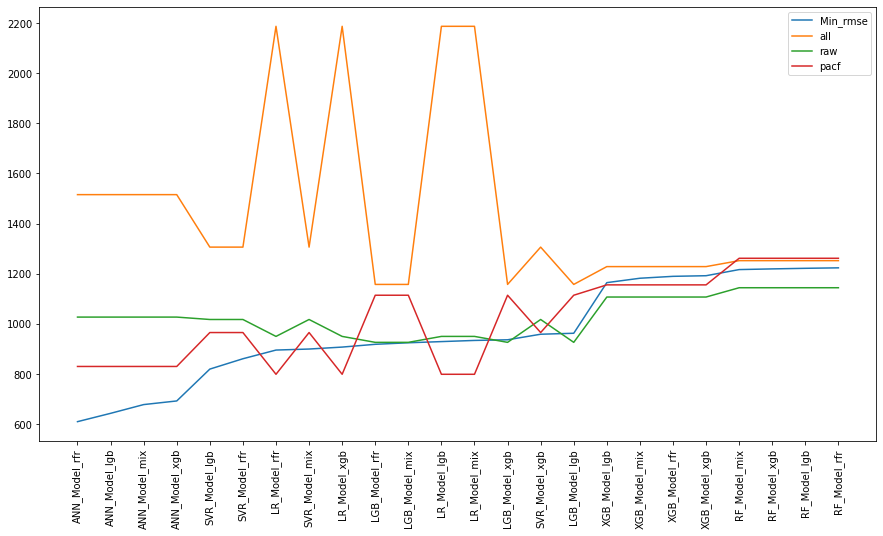

In [171]:
# plt.figure()
all_sort[['Min_rmse','all','raw','pacf']].plot(figsize=(15,8))
plt.xticks(range(0,len(all_sort.index),1),all_sort.index,rotation=90)
plt.savefig("./pic/RMSE/PowerCity/Compare.png")
plt.show()

### 画图

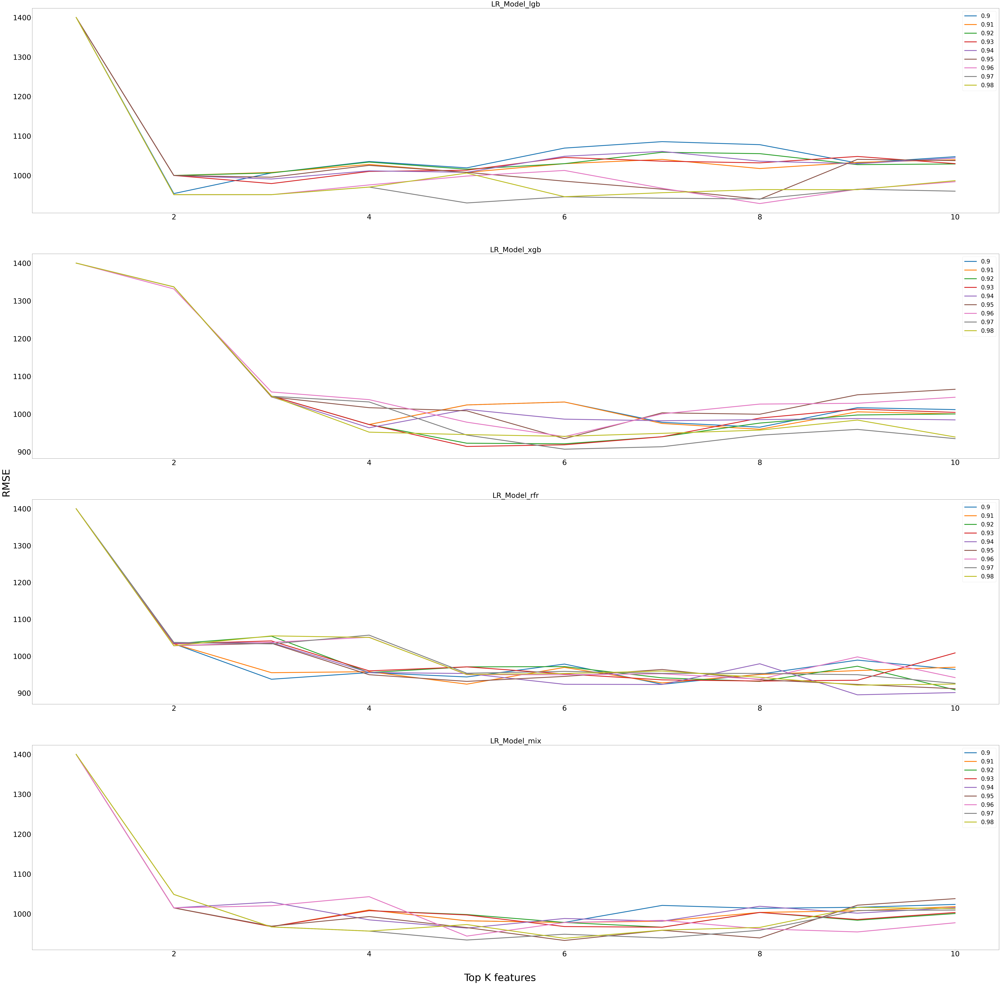

In [127]:
fig,ax = plt.subplots(len(linear_df),1,figsize=(120,120))
for order,k in zip(range(len(linear_df)),linear_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(linear_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(linear_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PowerCity/Linear.png')

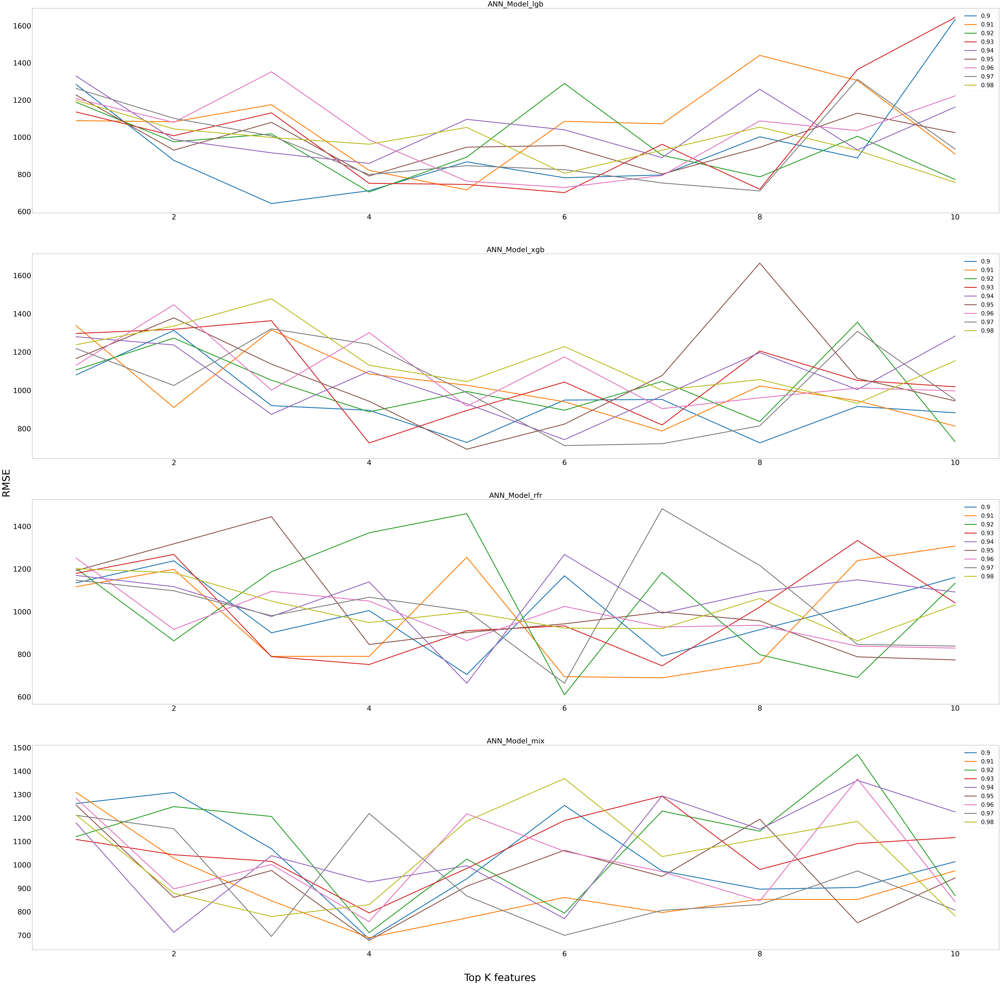

In [128]:
fig,ax = plt.subplots(len(ANN_df),1,figsize=(120,120))
for order,k in zip(range(len(ANN_df)),ANN_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(ANN_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(ANN_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PowerCity/ANN.png')

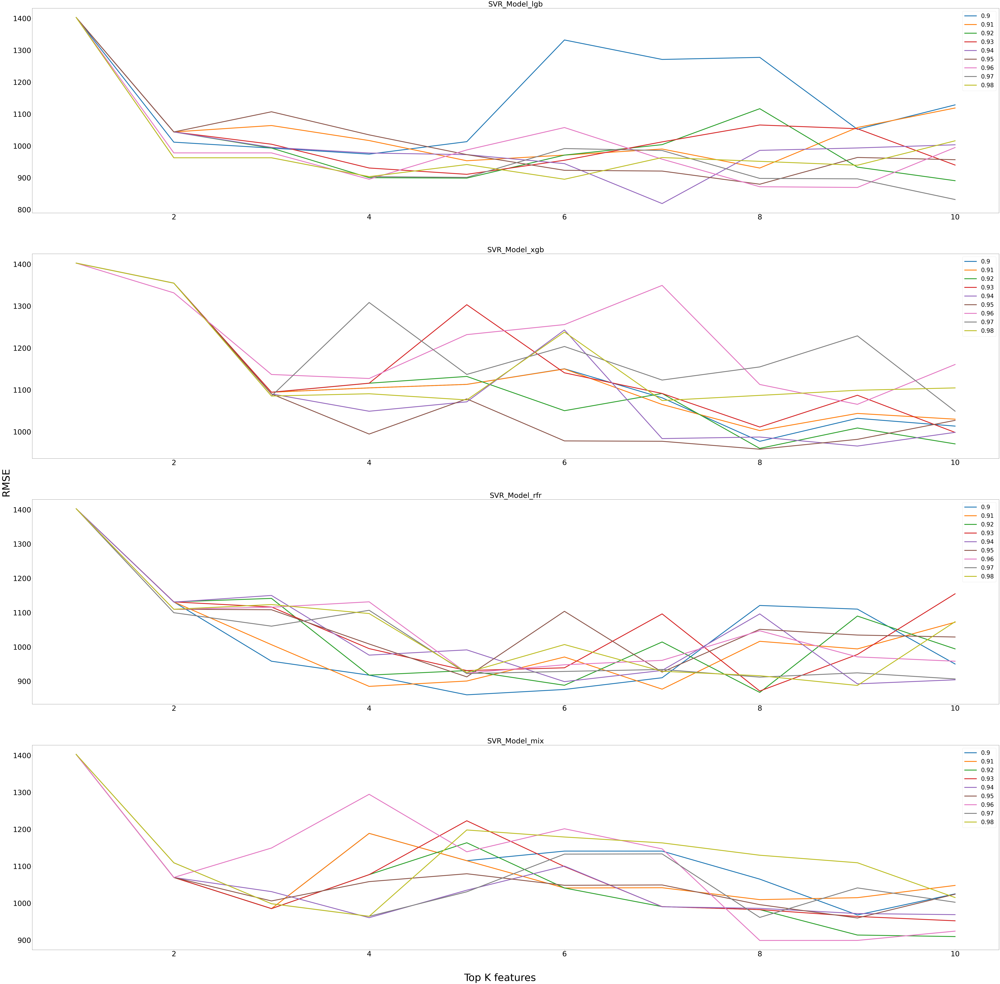

In [129]:
fig,ax = plt.subplots(len(SVR_df),1,figsize=(120,120))
for order,k in zip(range(len(SVR_df)),SVR_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(SVR_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(SVR_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PowerCity/SVR.png')

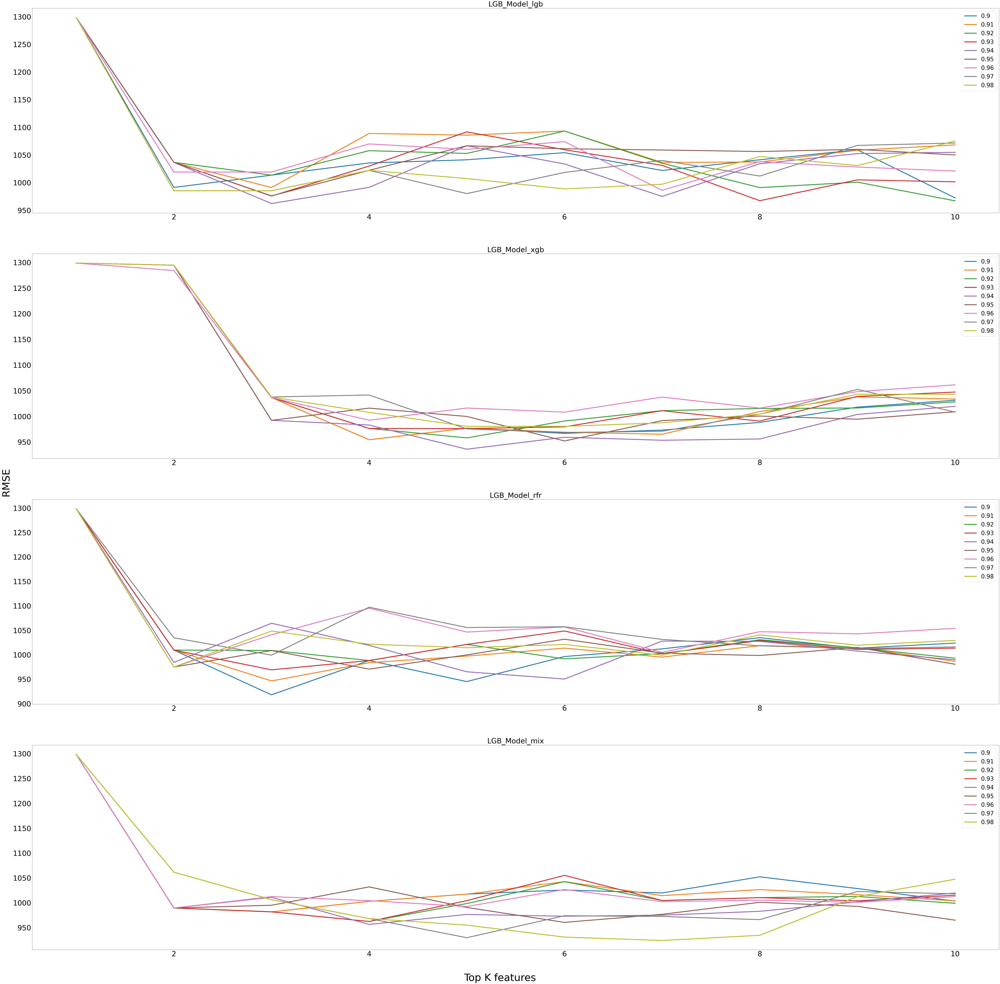

In [130]:
fig,ax = plt.subplots(len(LGB_df),1,figsize=(120,120))
for order,k in zip(range(len(LGB_df)),LGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(LGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(LGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PowerCity/LGB.png')

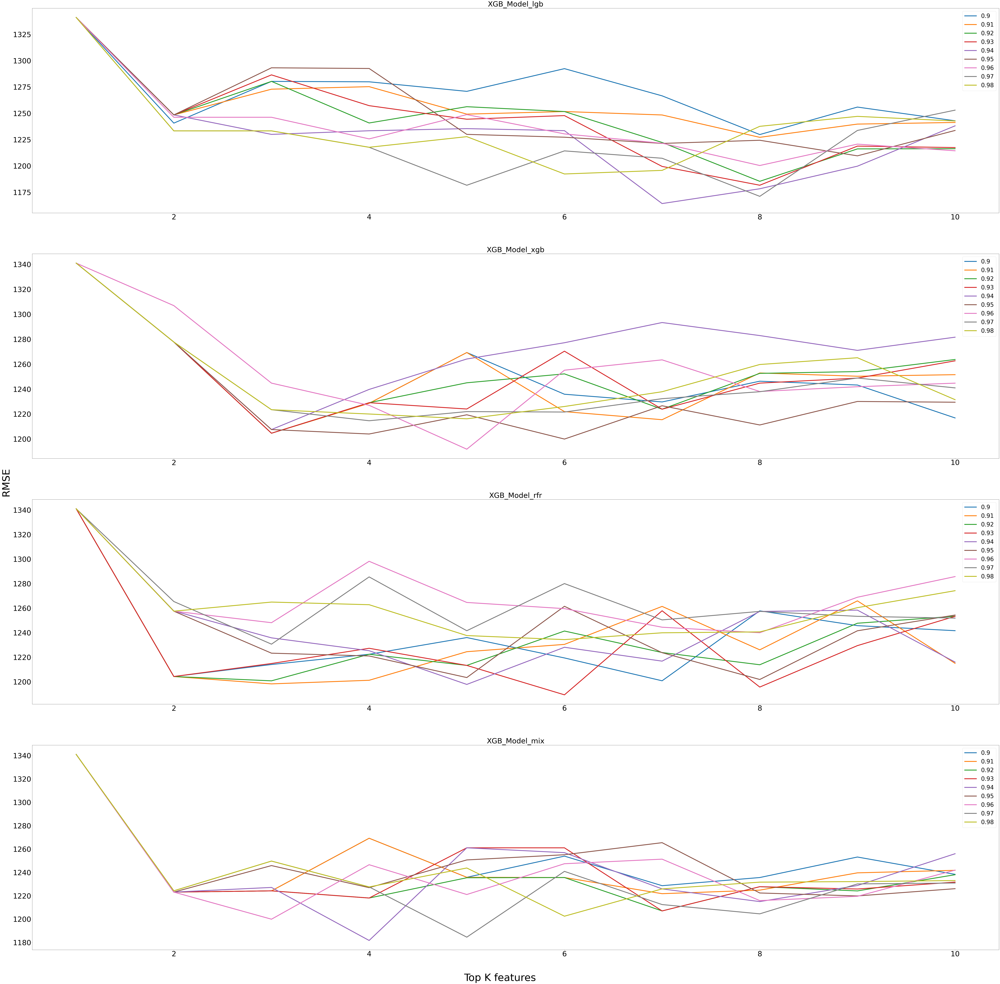

In [131]:
fig,ax = plt.subplots(len(XGB_df),1,figsize=(120,120))
for order,k in zip(range(len(XGB_df)),XGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(XGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(XGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PowerCity/XGB.png')

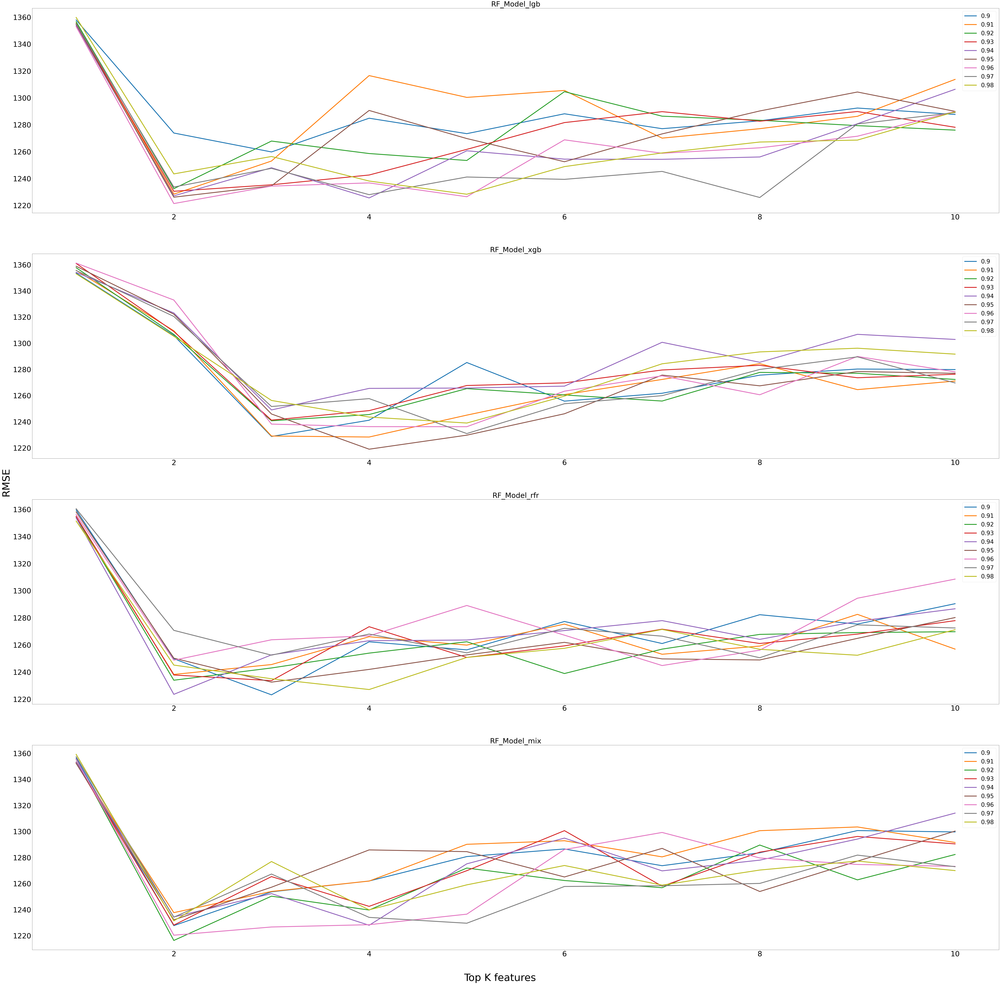

In [132]:
fig,ax = plt.subplots(len(RF_df),1,figsize=(120,120))
for order,k in zip(range(len(RF_df)),RF_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(RF_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(RF_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PowerCity/RF.png')

In [133]:
def ANN_plot(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    ann_model = keras.Sequential([
        keras.layers.Dense(500,activation='relu',input_shape=[x_train.shape[1]]),
        keras.layers.Dense(500,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(1)])#最后输出为一个结果，也就是预测的值
        #定义损失函数loss，采用的优化器optimizer为Adam
    ann_model.compile(loss='mean_absolute_error',optimizer='Adam')
    
    ann_model.fit(x_train,y_train.reshape(-1,))
    y_ann_model = ann_model.predict(x_test)
    y_ann_model_inverse =minmax_y_test.inverse_transform(y_ann_model.reshape((-1,1)))
    
    y_df = pd.DataFrame({
        'Actual':y_ann_model_inverse.reshape(-1,),
        'Predicted':y_test_inverse.reshape(-1,)
    },index=Y_test.index)
    print(r2_score(y_ann_model_inverse.reshape(-1,),y_test_inverse.reshape(-1,)))
    plt.figure(figsize=(15,8))
    plt.xticks(range(0,len(y_df.index),10),rotation=45)
    plt.plot(y_df['Actual'],label='Actual')
    plt.plot(y_df['Predicted'],linestyle='dashdot',label='Predicted')
    plt.legend()
    plt.savefig("./pic/RMSE/PowerCity/Final_prediction.png")
    return y_df

8/8 [==============================] - 0s 7ms/step - loss: 0.1847
-9.824689361968597


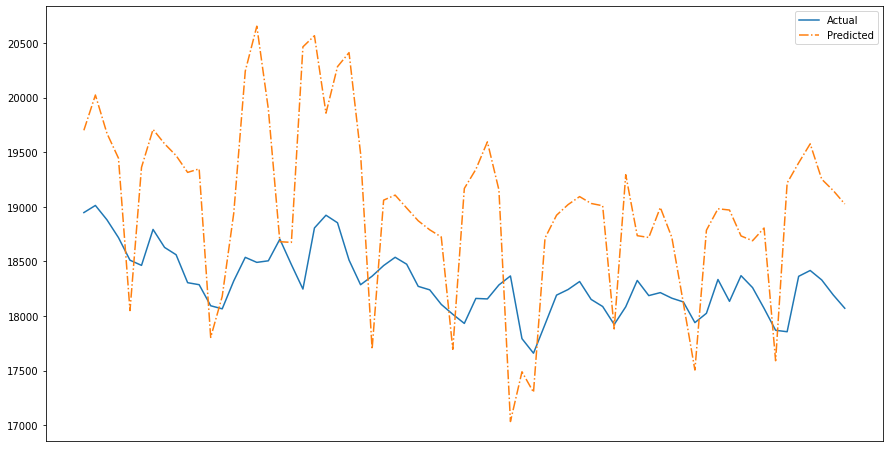

In [135]:
yy = ANN_plot(X_train_lag[real_rfr[0.92][6]],Y_train_lag,X_test_lag[real_rfr[0.92][6]],Y_test_lag)